In [1]:
import torch  
import torch.nn as nn
import numpy as np
import PIL.Image as Image
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from torch import optim
from torch.autograd import Variable
import torch.nn.functional as F
import cv2
from skimage.io import imsave
from skimage.measure import compare_ssim, compare_psnr, compare_mse
import time

In [2]:
def setup_seed(seed):
     torch.manual_seed(seed)
     torch.cuda.manual_seed_all(seed)
     np.random.seed(seed)
     np.random.seed(seed)
     torch.backends.cudnn.deterministic = True

setup_seed(120)

In [3]:
tl=time.localtime()

In [4]:
format_time = time.strftime("%Y-%m-%d %H_%M_%S", tl) 

In [5]:
import common
import ops
from models import  ENET
from GANmodels import Generator,Discriminator,Generator_SPA
import os
# from sklearn.mixture import GaussianMixture as GMM

In [6]:
device = torch.device("cuda")


In [7]:

out_dir = 'output/'
os.makedirs(out_dir,exist_ok=True)

In [8]:
# um
Nx = 500
Ny = 500
z = 5000
wavelength = 0.520
deltaX = 2#4
deltaY = 2#4
mylamda = 1e-3  # weight for background tvloss. Be careful for this paramters for differnet holo. Better start with a small value


In [9]:
def unwrap(x):
    y = x % (2 * np.pi)
    return torch.where(y > np.pi, 2*np.pi - y, y)

def fft2dc(x):
    return np.fft.fftshift(np.fft.fft2(x))
  
def ifft2dc(x):
    return np.fft.ifft2(np.fft.fftshift(x))

def Phase_unwrapping(in_, s=500):
    f = np.zeros((s,s))
    for ii in range(s):
        for jj in range(s):
            x = ii - s/2
            y = jj - s/2
            f[ii,jj] = x**2 + y**2
    a = ifft2dc(fft2dc(np.cos(in_)*ifft2dc(fft2dc(np.sin(in_))*f))/(f+0.000001))
    b = ifft2dc(fft2dc(np.sin(in_)*ifft2dc(fft2dc(np.cos(in_))*f))/(f+0.000001))
    out = np.real(a - b)
    return out

In [10]:
def propagator(Nx,Ny,z,wavelength,deltaX,deltaY):
    k = 1/wavelength
    x = np.expand_dims(np.arange(np.ceil(-Nx/2),np.ceil(Nx/2),1)*(1/(Nx*deltaX)),axis=0)
    y = np.expand_dims(np.arange(np.ceil(-Ny/2),np.ceil(Ny/2),1)*(1/(Ny*deltaY)),axis=1)
    y_new = np.repeat(y,Nx,axis=1)
    x_new = np.repeat(x,Ny,axis=0)
    kp = np.sqrt(y_new**2+x_new**2)
    term=k**2-kp**2
    term=np.maximum(term,0) 
    phase = np.exp(1j*2*np.pi*z*np.sqrt(term))
    return phase



## load the image for simulation

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


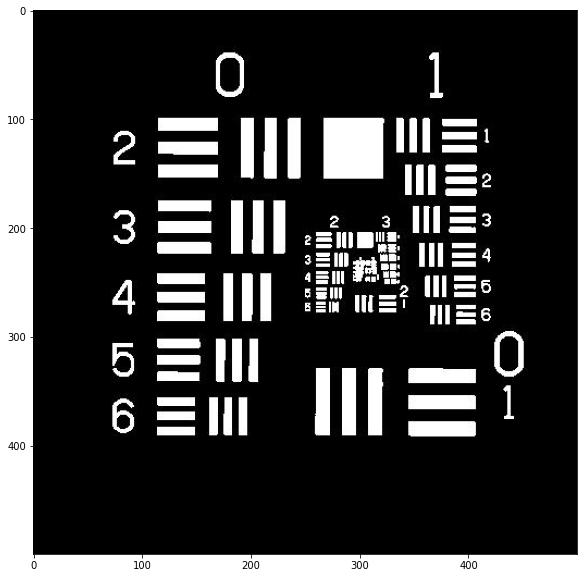

In [11]:
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])

img = (np.array(Image.open('./target_final.jpg')))
# img = rgb2gray((np.array(Image.open('./target_final.jpg'))))

#img = np.sqrt(img)
img = (img-np.min(img))/(np.max(img)-np.min(img))
imsave('./gray.bmp',np.squeeze(img))
plt.figure(figsize=(20,10))
plt.imshow(np.squeeze(img), cmap='gray')

In [12]:
# center_point = Nx/2
# phase_shapes = np.ones(Nx)
# for nn in range(Nx):
#     phase_shapes[nn] = 1 / (1 + np.exp(-(nn-center_point)/50))

# phase_shapes_GT = phase_shapes*img

# #* np.exp(1j * phase)

In [13]:
# imsave('phase_gt.jpg',phase_shapes_GT)

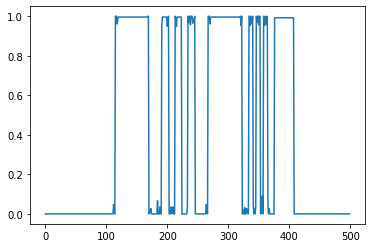

In [14]:
plt.plot(img[100,:])

In [15]:
# plt.plot(phase_shapes_GT[100,:])

In [16]:
# img = img* np.exp(1j * phase_shapes_GT)

In [17]:
# phase_shapes_GT.shape

## Generate hologram (forward propogation)

In [18]:
def generate_holo(imge):
    phase = propagator(Nx,Ny,z,wavelength,deltaX,deltaY)
    E = np.ones((Nx,Ny))  # illumination light
    E = np.fft.ifft2(np.fft.fft2(E)*np.fft.fftshift(np.conj(phase)))

    Es = imge*E
    S = np.fft.ifft2(np.fft.fft2(Es)*np.fft.fftshift(phase))

    S1 = np.fft.ifft2(np.fft.fft2(E)*np.fft.fftshift(phase))

    s=(S+1)*np.conj(S+1);
    s1=(S1+1)*np.conj(S1+1);
    g = s/s1

    hologram = np.abs(g)

#     plt.figure(figsize=(20,10))
#     plt.imshow(hologram, cmap='gray')


    gen_holo = (hologram-np.min(hologram))/(np.max(hologram)-np.min(hologram))
    return gen_holo

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


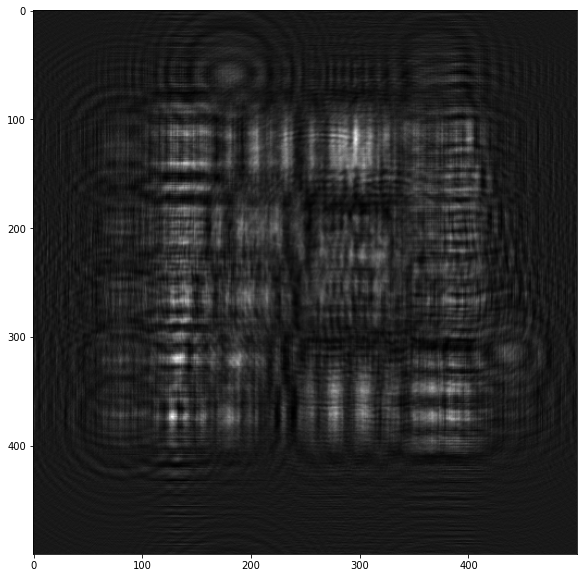

In [19]:
phase = propagator(Nx,Ny,z,wavelength,deltaX,deltaY)
E = np.ones((Nx,Ny))  # illumination light
E = np.fft.ifft2(np.fft.fft2(E)*np.fft.fftshift(np.conj(phase)))

Es = img*E
S = np.fft.ifft2(np.fft.fft2(Es)*np.fft.fftshift(phase))

S1 = np.fft.ifft2(np.fft.fft2(E)*np.fft.fftshift(phase))

s=(S+1)*np.conj(S+1);
s1=(S1+1)*np.conj(S1+1);
g = s/s1

hologram = np.abs(g)

plt.figure(figsize=(20,10))
plt.imshow(hologram, cmap='gray')


hologram = (hologram-np.min(hologram))/(np.max(hologram)-np.min(hologram))
imsave('./holo.bmp',np.squeeze(hologram))

##  angular spectrum propagation (ASP) Back-propagate Amp and Phase

(-0.5, 499.5, 499.5, -0.5)

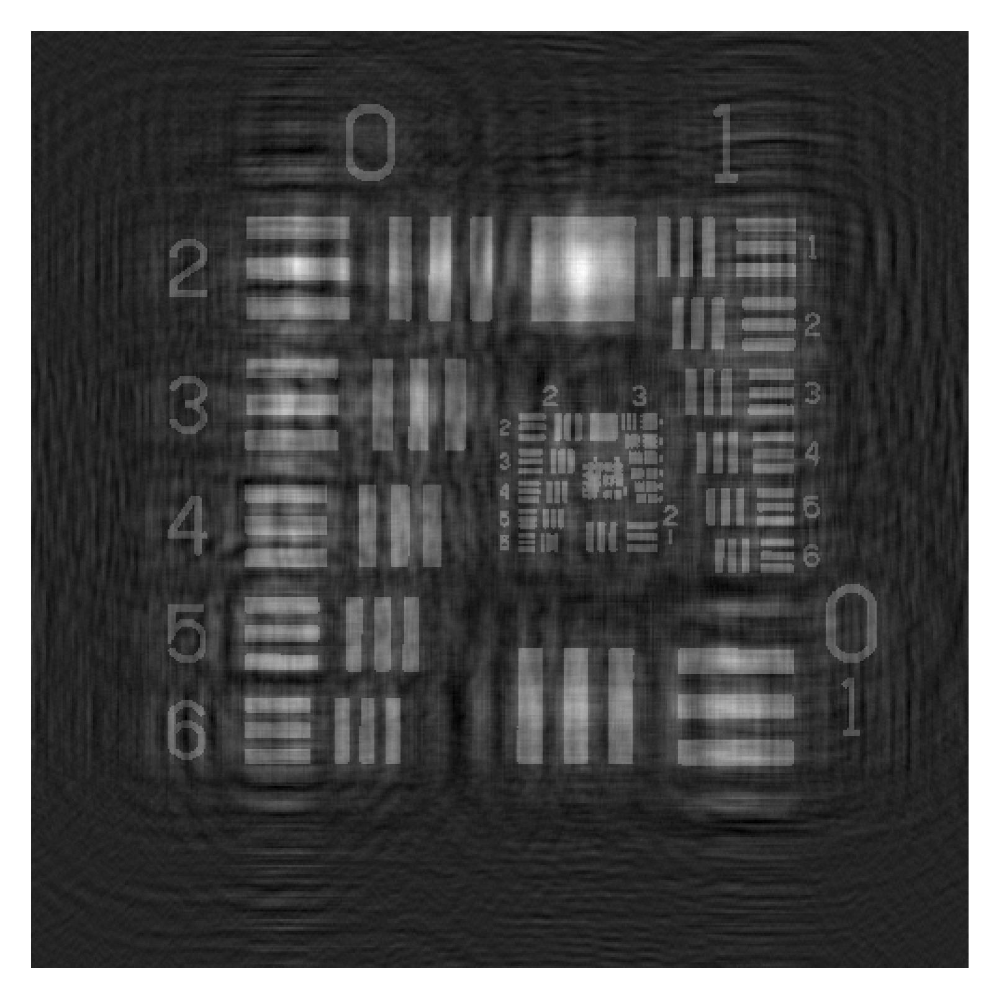

In [20]:
phase = propagator(Nx,Ny,z,wavelength,deltaX,deltaY)
bp = np.fft.ifft2(np.fft.fft2(hologram)*np.fft.fftshift(np.conj(phase)))
plt.figure(dpi=500)
plt.imshow(np.abs(bp), cmap='gray')
plt.axis('off')

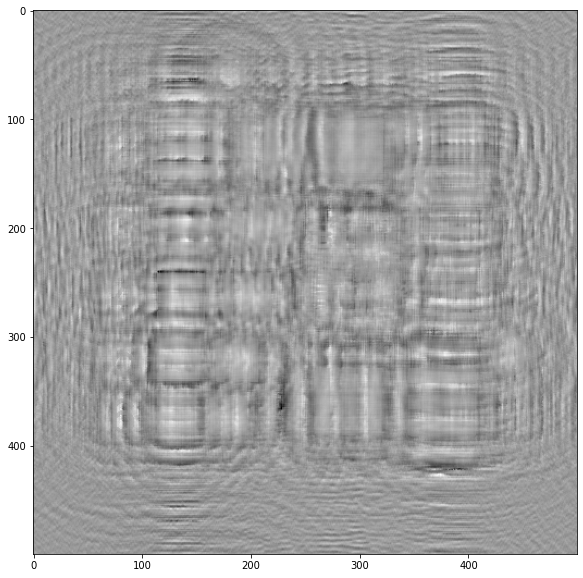

In [21]:
# plot phase
bp_p = np.angle(bp)
bp_p = Phase_unwrapping(bp_p)
bp_p = (bp_p - np.min(bp_p))/(np.max(bp_p)-np.min(bp_p))
        
plt.figure(figsize=(20,10))
plt.imshow(bp_p, cmap='gray')

In [22]:
def seg(img):
    critera = (cv2.TermCriteria_EPS+cv2.TermCriteria_MAX_ITER,10,0.1)
    flags = cv2.KMEANS_RANDOM_CENTERS

    data = np.float32(img.reshape(-1,1))
    r,best,center = cv2.kmeans(data,2,None,criteria=critera,attempts=10,flags=flags)
    # print(r)
    # print(best.shape)
    # print(center)
    center = np.uint8(center)

    if best.ravel()[0] == 0:
        data[best.ravel()==1] = (0)
        data[best.ravel()==0] = (255) 
    else:
        data[best.ravel()==1] = (255)
        data[best.ravel()==0] = (0) 
    # data[best.ravel()==2] = (0,0,255)
    # data[best.ravel()==3] = (0,255,0) 
    # data[best.ravel()==2] = (255)
    # data[best.ravel()==3] = (0) 

    data = np.uint8(data)
    mask = data.reshape((img.shape))
    mask = mask/255.
    # plt.imshow('img',img)
    # plt.imshow('res',oi)
    return mask

In [23]:
def propagator(Nx,Ny,z,wavelength,deltaX,deltaY):
        k = 1/wavelength
        x = np.expand_dims(np.arange(np.ceil(-Nx/2),np.ceil(Nx/2),1)*(1/(Nx*deltaX)),axis=0)
        y = np.expand_dims(np.arange(np.ceil(-Ny/2),np.ceil(Ny/2),1)*(1/(Ny*deltaY)),axis=1)
        y_new = np.repeat(y,Nx,axis=1)
        x_new = np.repeat(x,Ny,axis=0)
        kp = np.sqrt(y_new**2+x_new**2)
        term=k**2-kp**2
        term=np.maximum(term,0) 
        phase = np.exp(1j*2*np.pi*z*np.sqrt(term))
        return torch.from_numpy(np.concatenate([np.real(phase)[np.newaxis,:,:,np.newaxis], np.imag(phase)[np.newaxis,:,:,np.newaxis]], axis = 3))
   
def roll_n(X, axis, n):
    f_idx = tuple(slice(None, None, None) if i != axis else slice(0, n, None) for i in range(X.dim()))
    b_idx = tuple(slice(None, None, None) if i != axis else slice(n, None, None) for i in range(X.dim()))
    front = X[f_idx]
    back = X[b_idx]
    return torch.cat([back, front], axis)

def batch_fftshift2d( x):
    real, imag = torch.unbind(x, -1)
    for dim in range(1, len(real.size())):
        n_shift = real.size(dim)//2
        if real.size(dim) % 2 != 0:
            n_shift += 1  # for odd-sized images
        real = roll_n(real, axis=dim, n=n_shift)
        imag = roll_n(imag, axis=dim, n=n_shift)
    return torch.stack((real, imag), -1)  # last dim=2 (real&imag)

def batch_ifftshift2d(x):
    real, imag = torch.unbind(x, -1)
    for dim in range(len(real.size()) - 1, 0, -1):
        real = roll_n(real, axis=dim, n=real.size(dim)//2)
        imag = roll_n(imag, axis=dim, n=imag.size(dim)//2)
    return torch.stack((real, imag), -1)  # last dim=2 (real&imag)

def complex_mult(x, y):
    real_part = x[:,:,:,0]*y[:,:,:,0]-x[:,:,:,1]*y[:,:,:,1]
    real_part = real_part.unsqueeze(3)
    imag_part = x[:,:,:,0]*y[:,:,:,1]+x[:,:,:,1]*y[:,:,:,0]
    imag_part = imag_part.unsqueeze(3)
    return torch.cat((real_part, imag_part), 3)

def forward_propogate(x):
    x = x.squeeze(2)
#     y = y.squeeze(2)
    x = x.permute([0,2,3,1])
#     y = y.permute([0,2,3,1])

    prop = propagator(Nx,Ny,z,wavelength,deltaX,deltaY).to(device, dtype=torch.float)
    cEs = batch_fftshift2d(torch.fft(x,3,normalized=True))
    cEsp =complex_mult(cEs,prop)

    S = torch.ifft(batch_ifftshift2d(cEsp),3,normalized=True)
    Se = S[:,:,:,0].unsqueeze(-1)
    Se = Se.permute([0,3,1,2])
    return Se


## Define loss

In [24]:

class RECLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.Nx = 500
        self.Ny = 500
        self.z = z
        self.wavelength =wavelength
        self.deltaX = deltaX
        self.deltaY = deltaY
        self.prop = self.propagator(self.Nx,self.Ny,self.z,self.wavelength,self.deltaX,self.deltaY)
        self.prop = self.prop.cuda()

    def propagator(self,Nx,Ny,z,wavelength,deltaX,deltaY):
        k = 1/wavelength
        x = np.expand_dims(np.arange(np.ceil(-Nx/2),np.ceil(Nx/2),1)*(1/(Nx*deltaX)),axis=0)
        y = np.expand_dims(np.arange(np.ceil(-Ny/2),np.ceil(Ny/2),1)*(1/(Ny*deltaY)),axis=1)
        y_new = np.repeat(y,Nx,axis=1)
        x_new = np.repeat(x,Ny,axis=0)
        kp = np.sqrt(y_new**2+x_new**2)
        term=k**2-kp**2
        term=np.maximum(term,0) 
        phase = np.exp(1j*2*np.pi*z*np.sqrt(term))
        return torch.from_numpy(np.concatenate([np.real(phase)[np.newaxis,:,:,np.newaxis], np.imag(phase)[np.newaxis,:,:,np.newaxis]], axis = 3))
   

    def roll_n(self, X, axis, n):
        f_idx = tuple(slice(None, None, None) if i != axis else slice(0, n, None) for i in range(X.dim()))
        b_idx = tuple(slice(None, None, None) if i != axis else slice(n, None, None) for i in range(X.dim()))
        front = X[f_idx]
        back = X[b_idx]
        return torch.cat([back, front], axis)

    def batch_fftshift2d(self, x):
        real, imag = torch.unbind(x, -1)
        for dim in range(1, len(real.size())):
            n_shift = real.size(dim)//2
            if real.size(dim) % 2 != 0:
                n_shift += 1  # for odd-sized images
            real = self.roll_n(real, axis=dim, n=n_shift)
            imag = self.roll_n(imag, axis=dim, n=n_shift)
        return torch.stack((real, imag), -1)  # last dim=2 (real&imag)

    def batch_ifftshift2d(self,x):
        real, imag = torch.unbind(x, -1)
        for dim in range(len(real.size()) - 1, 0, -1):
            real = self.roll_n(real, axis=dim, n=real.size(dim)//2)
            imag = self.roll_n(imag, axis=dim, n=imag.size(dim)//2)
        return torch.stack((real, imag), -1)  # last dim=2 (real&imag)
    
    def complex_mult(self, x, y):
        real_part = x[:,:,:,0]*y[:,:,:,0]-x[:,:,:,1]*y[:,:,:,1]
        real_part = real_part.unsqueeze(3)
        imag_part = x[:,:,:,0]*y[:,:,:,1]+x[:,:,:,1]*y[:,:,:,0]
        imag_part = imag_part.unsqueeze(3)
        return torch.cat((real_part, imag_part), 3)
    
    def TV(self,x,mask):
        batch_size = x.size()[0]
        mask_tensor = torch.zeros((x.size())).to(device)
        for i in range(batch_size):
            mask_tensor[i,:,:,0] = mask
            mask_tensor[i,:,:,1] = mask
        h_x = x.size()[2]
        w_x = x.size()[3]
        
        count_h = self._tensor_size(x[:,1:,:,:])
        count_w = self._tensor_size(x[:,:,1:,:])
        x = torch.mul(x,mask_tensor)
        amp = torch.sqrt(torch.pow(x[:,:,:,0],2)+torch.pow(x[:,:,:,1],2))
        phase = torch.atan2(x[:,:,:,0],x[:,:,:,1])
#         phase = (phase-torch.min(phase))/(torch.max(phase)-torch.min(phase))
#         h_tv = torch.pow(phase[:,1:,:]-phase[:,:h_x-1,:],2).sum() #gradient in horizontal axis
#         w_tv = torch.pow(phase[:,:,1:]-phase[:,:,:w_x-1],2).sum() #gradient in vertical axis
        
        
        h_tv = torch.pow(x[:,1:,:,:]-x[:,:h_x-1,:,:],2).sum() #gradient in horizontal axis
        w_tv = torch.pow(x[:,:,1:,:]-x[:,:,:w_x-1,:],2).sum() #gradient in vertical axis

#         h_tv = 1*torch.pow(x[:,1:,:,0]-x[:,:h_x-1,:,0],2).sum()-torch.pow(x[:,1:,:,1]-x[:,:h_x-1,:,1],2).sum()   #gradient in horizontal axis
#         w_tv = 1*torch.pow(x[:,:,1:,0]-x[:,:,:w_x-1,0],2).sum()-torch.pow(x[:,:,1:,1]-x[:,:,:w_x-1,1],2).sum() #gradient in vertical axis

        return 2*(h_tv/count_h+w_tv/count_w)/batch_size #0.005 for cs prior
#         return torch.sum(amp)/(batch_size*h_x*w_x)+torch.sum(phase)/(batch_size*h_x*w_x) #0.005 for cs prior
    
    def forward(self,x,y,mask,mylambda=0):
        x = x.squeeze(2)
        y = y.squeeze(2)
        x = x.permute([0,2,3,1])
        y = y.permute([0,2,3,1])
    
        
        cEs = self.batch_fftshift2d(torch.fft(x,3,normalized=True))
        cEsp = self.complex_mult(cEs,self.prop)
        
        S = torch.ifft(self.batch_ifftshift2d(cEsp),3,normalized=True)
        Se = S[:,:,:,0]
#         Se = torch.sqrt(torch.pow(S[:,:,:,0],2)+torch.pow(S[:,:,:,1],2))
#         print("TV LOSS:")
#         print(self.TV(x,mask))
        loss = torch.mean(torch.abs(Se-torch.sqrt(y[:,:,:,0])))/2+mylambda*self.TV(x,mask)#torch.mean(torch.abs(Se-y[:,:,:,0]))/2#
        
        return loss


    def _tensor_size(self,t):
        return t.size()[1]*t.size()[2]*t.size()[3]
 



class BCELosswithLogits(nn.Module):
    def __init__(self, pos_weight=1, reduction='mean'):
        super(BCELosswithLogits, self).__init__()
        self.pos_weight = pos_weight
        self.reduction = reduction

    def forward(self, logits, target):
        # logits: [N, *], target: [N, *]
        logits = torch.sigmoid(logits)
        loss = - self.pos_weight * target * torch.log(logits) - \
               (1 - target) * torch.log(1 - logits)
        if self.reduction == 'mean':
            loss = loss.mean()
        elif self.reduction == 'sum':
            loss = loss.sum()
        return loss 

## Define the network

In [25]:
device = torch.device("cuda")

from torchsummary import summary
criterion = RECLoss() #ONLY FOR GENERATOR
criterion_2 = BCELosswithLogits() # FOR G AND
# G = Generator().to(device)
G = Generator().to(device)
D = Discriminator().to(device)
optimizer_G = optim.Adam(G.parameters(), lr=9e-3)#9e-3  9e-3
optimizer_D = optim.Adam(D.parameters(), lr=5e-3)#5e-3

In [26]:
# for param in G.parameters():
#     print(param)

## Define the Input

In [27]:
epoch = 5000
period = 100
period_train = 1 #train 5 times D and train G once
# eta = torch.Tensor(np.concatenate([np.abs(bp)[np.newaxis,:,:], np.zeros_like(np.abs(bp))[np.newaxis,:,:]], axis = 0))

eta = torch.Tensor(np.concatenate([np.real(bp)[np.newaxis,:,:], np.imag(bp)[np.newaxis,:,:]], axis = 0))
#back-progated holo

holo = torch.Tensor(np.concatenate([np.real(hologram)[np.newaxis,:,:], np.imag(hologram)[np.newaxis,:,:]], axis = 0))
holo = holo #input
eta = eta.to(device).unsqueeze(0)
holo = holo.to(device).unsqueeze(0)


#load the ground truth to compare
ground_truth = (np.array(Image.open('./gray.bmp')))
ground_truth = (ground_truth-np.min(ground_truth))/(np.max(ground_truth)-np.min(ground_truth))

## Train the network

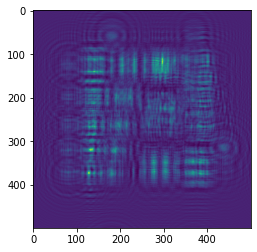

In [28]:
plt.imshow(hologram)

epoch [100/5000]     Loss: 0.022396487265192645


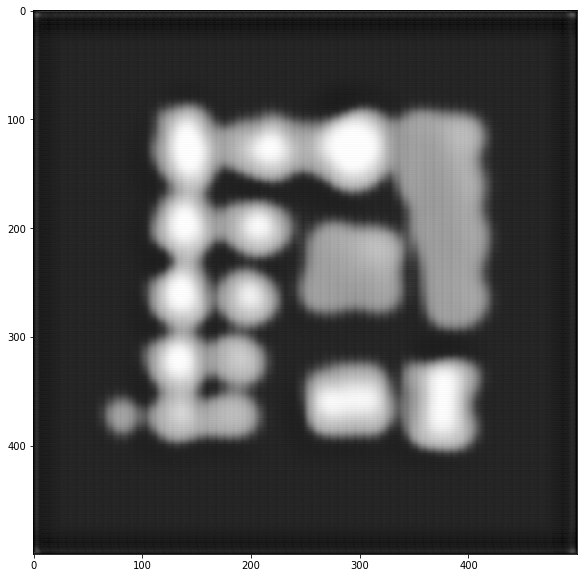

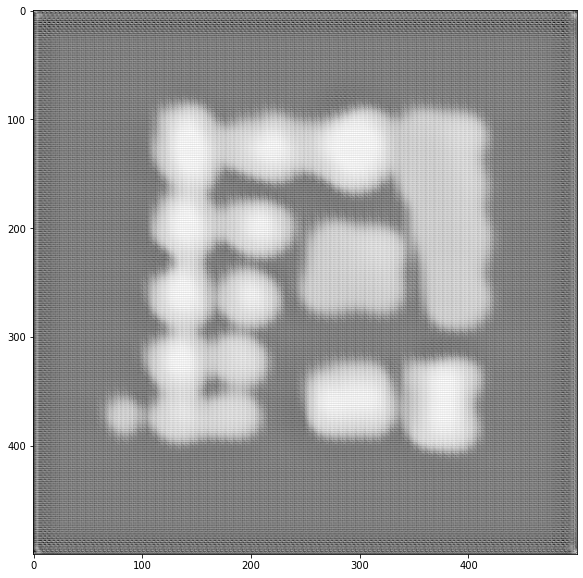

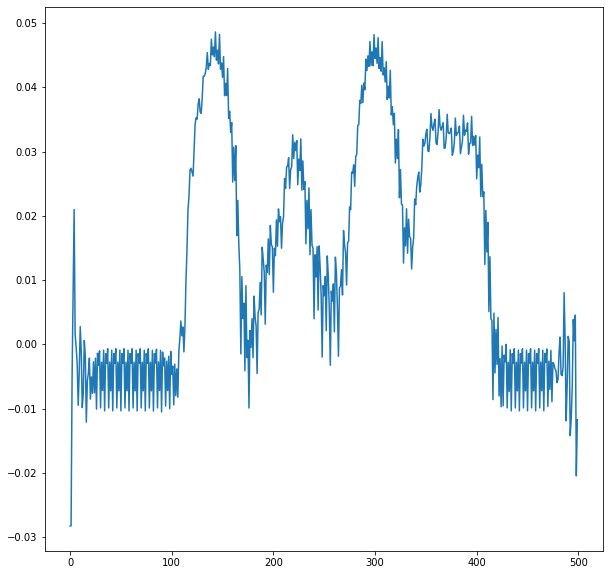

epoch [100/5000]     PSNR: 10.073822573799116 |  SSIM: 0.05659425415518 | Phase PSNR: 8.926072429062796
epoch [200/5000]     Loss: 0.01775362950332413


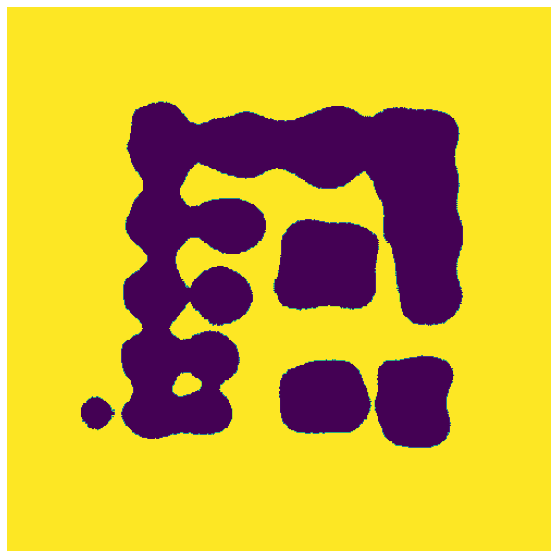

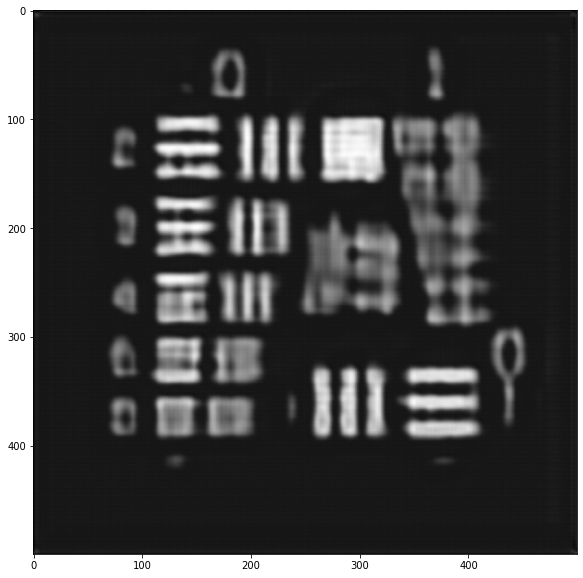

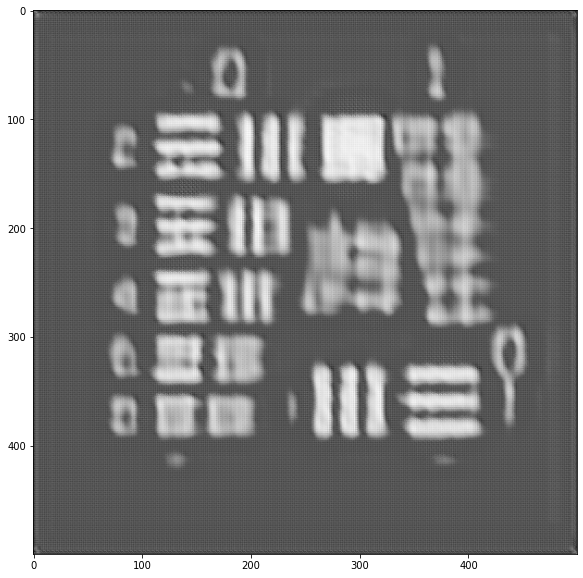

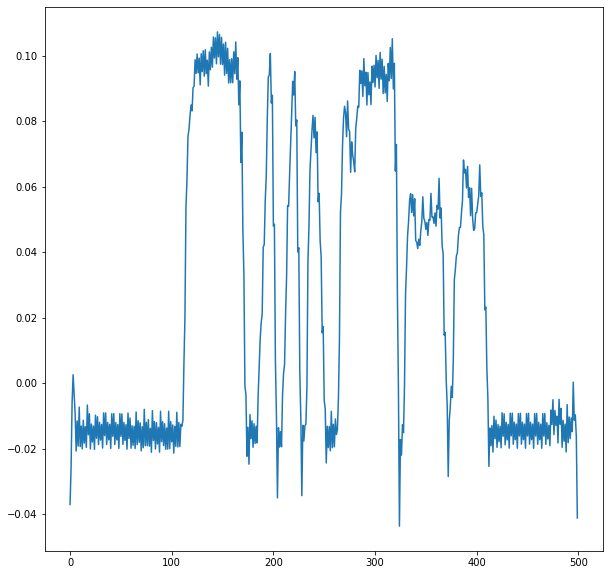

epoch [200/5000]     PSNR: 13.303176376451516 |  SSIM: 0.11483128013301896 | Phase PSNR: 8.924255689399622
epoch [300/5000]     Loss: 0.01348242146235184


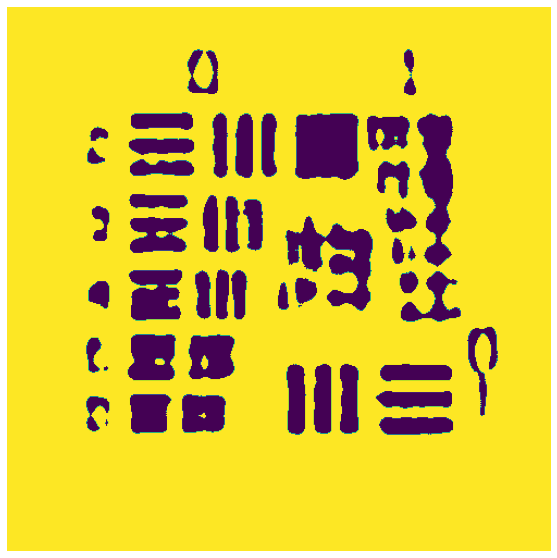

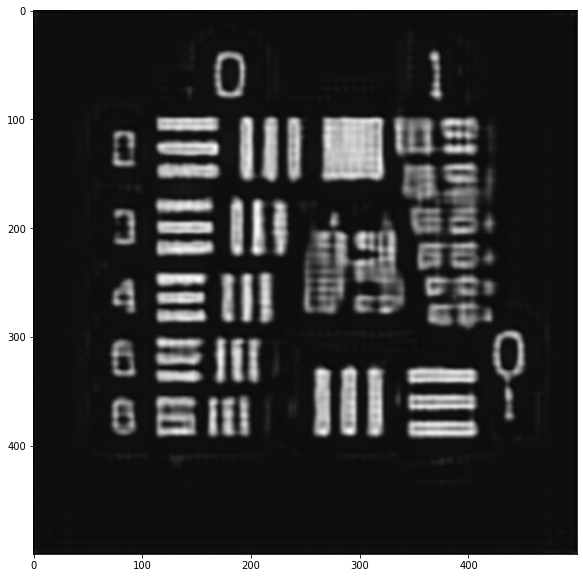

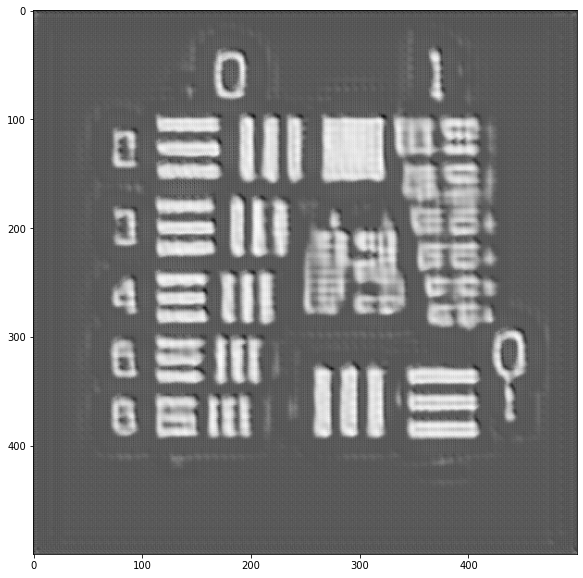

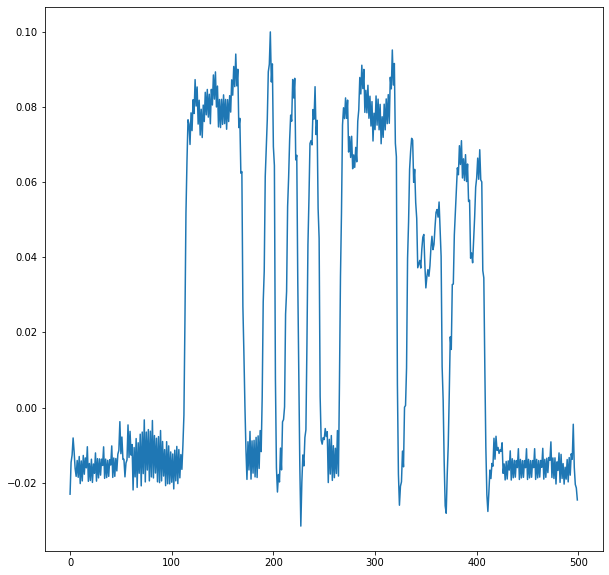

epoch [300/5000]     PSNR: 14.756988714101503 |  SSIM: 0.19672537605229695 | Phase PSNR: 8.926171504219184
epoch [400/5000]     Loss: 0.012126647578248217


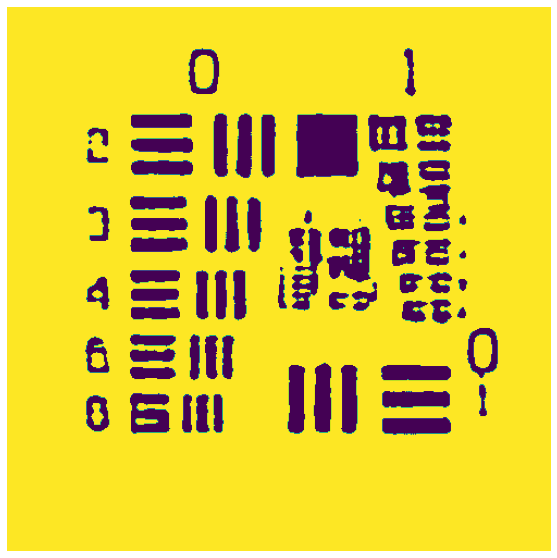

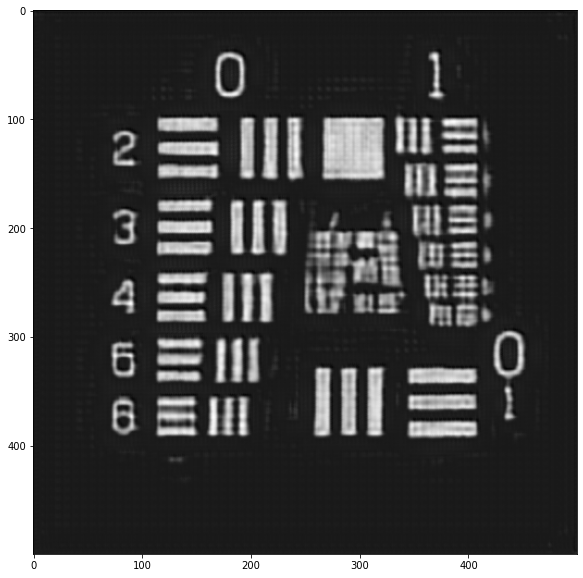

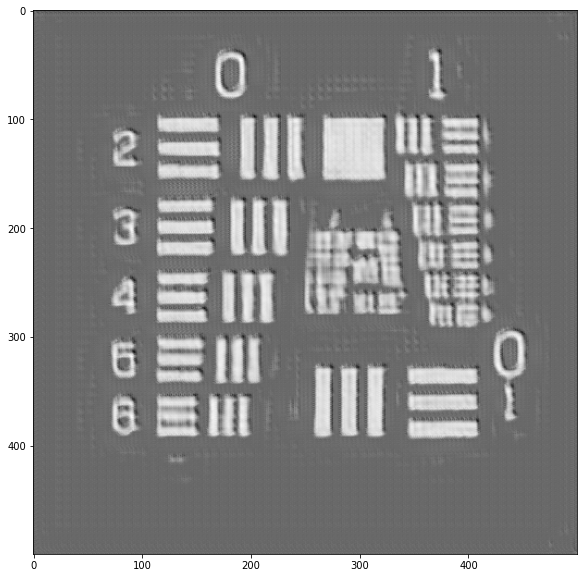

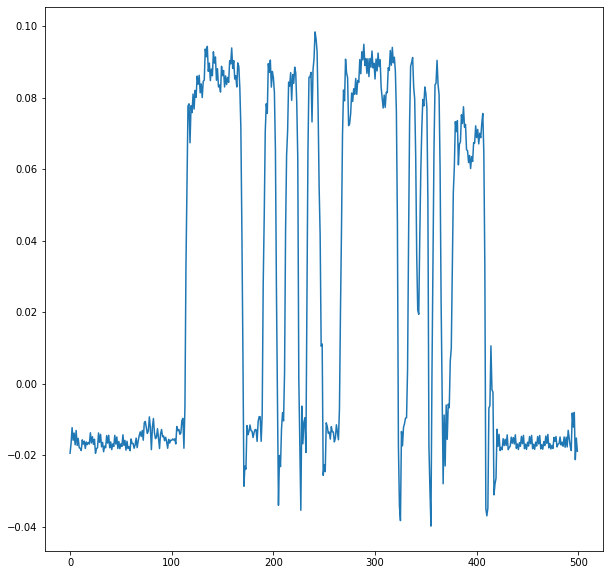

epoch [400/5000]     PSNR: 15.18837178599555 |  SSIM: 0.1795812293945974 | Phase PSNR: 8.926569558714363
epoch [500/5000]     Loss: 0.009882293780017953


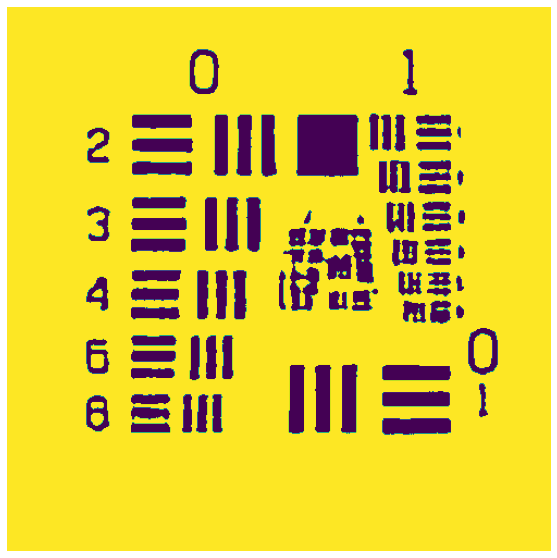

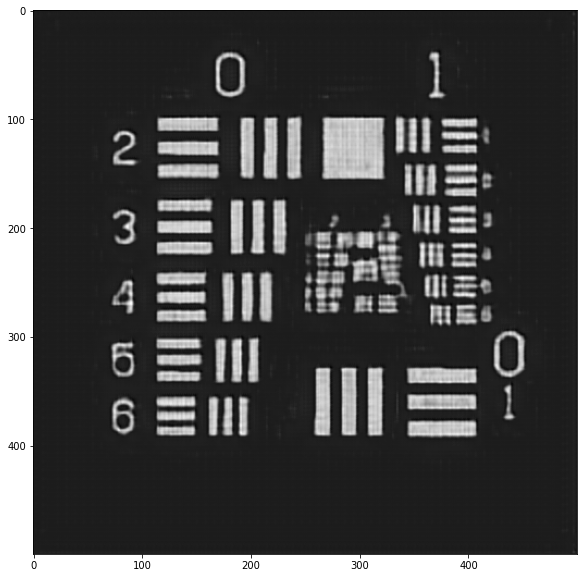

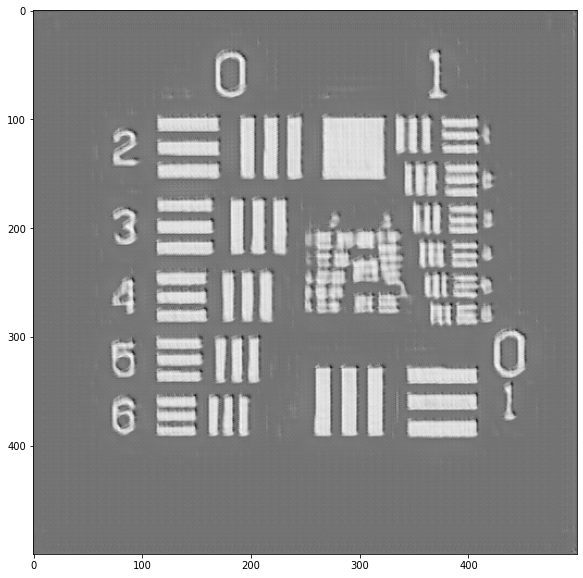

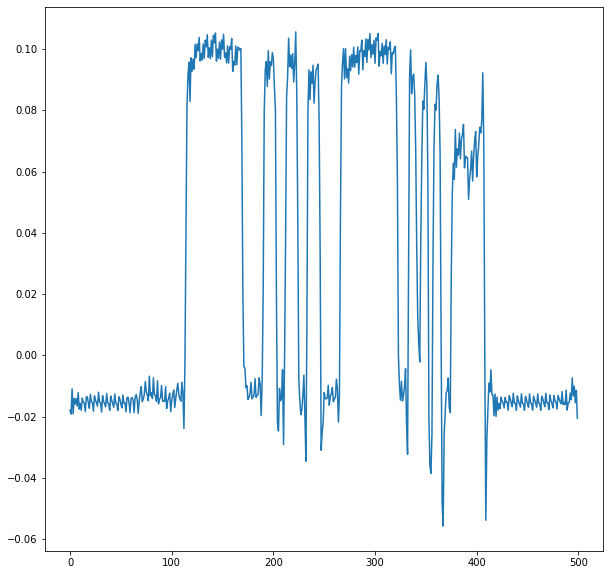

epoch [500/5000]     PSNR: 15.602421679701717 |  SSIM: 0.19973305552065887 | Phase PSNR: 8.927159675413979
epoch [600/5000]     Loss: 0.008492790546845508


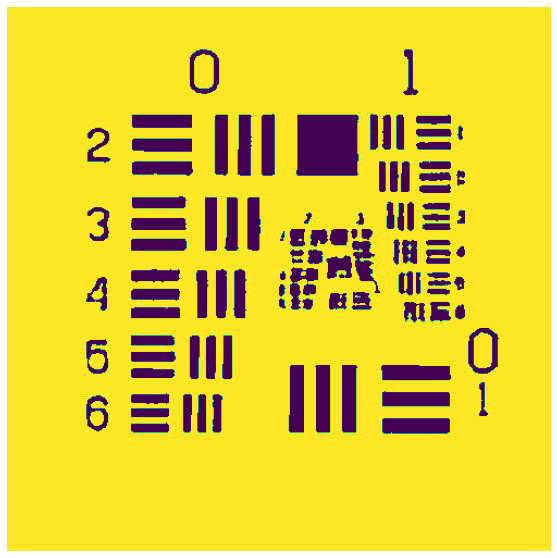

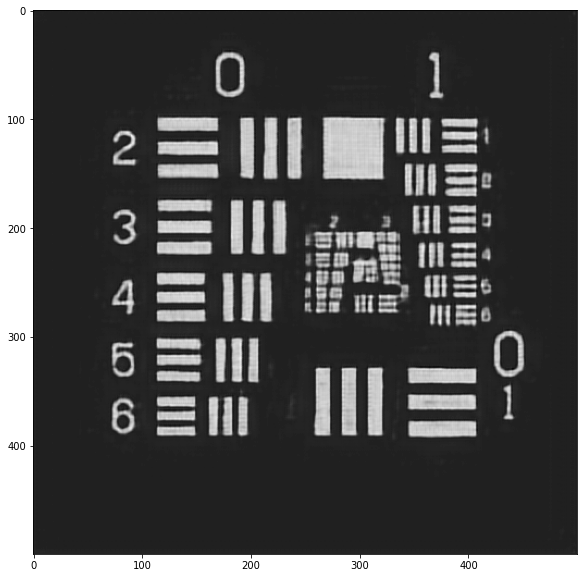

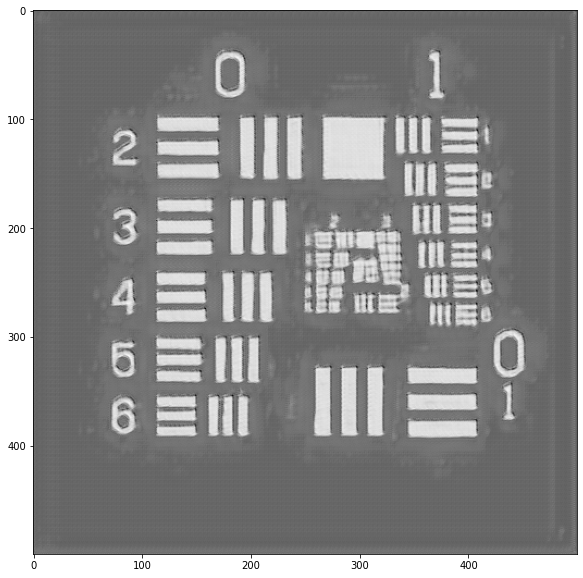

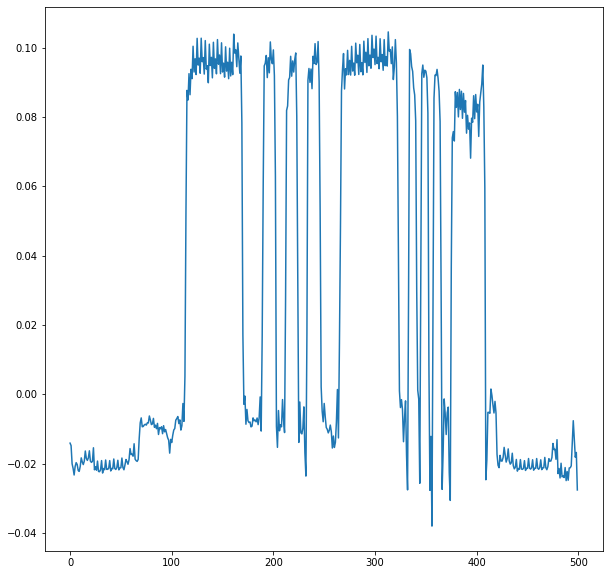

epoch [600/5000]     PSNR: 15.685691167517268 |  SSIM: 0.21234274426454158 | Phase PSNR: 8.927615695408543
epoch [700/5000]     Loss: 0.006345882597496208


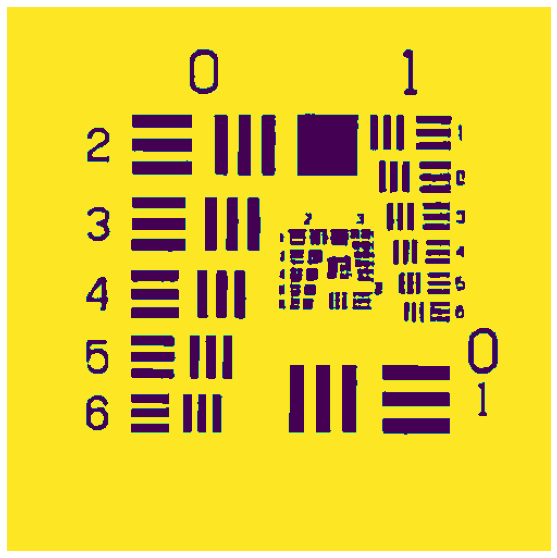

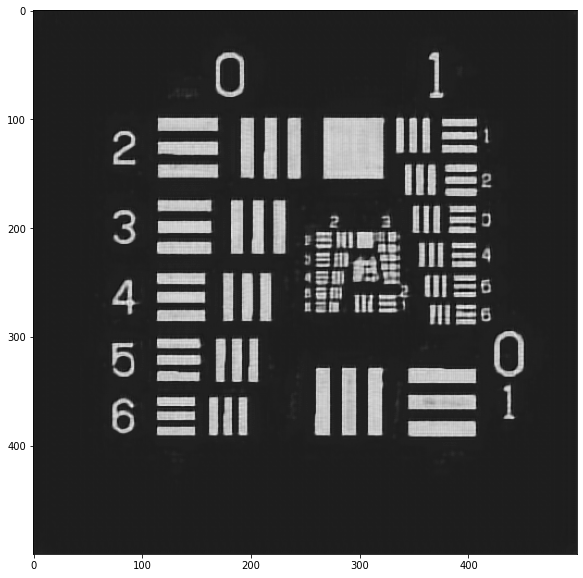

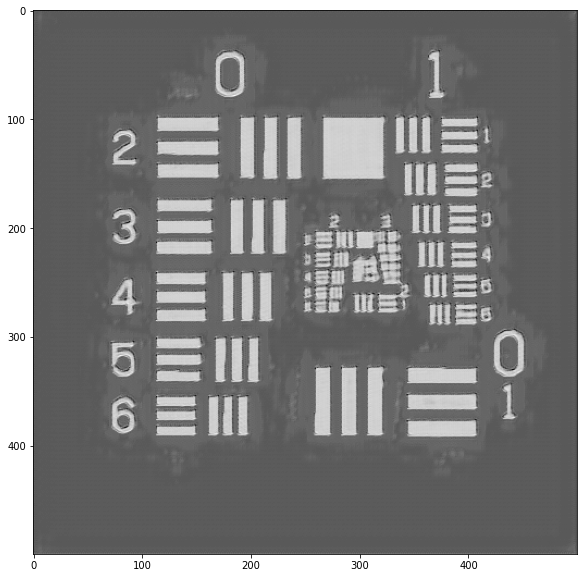

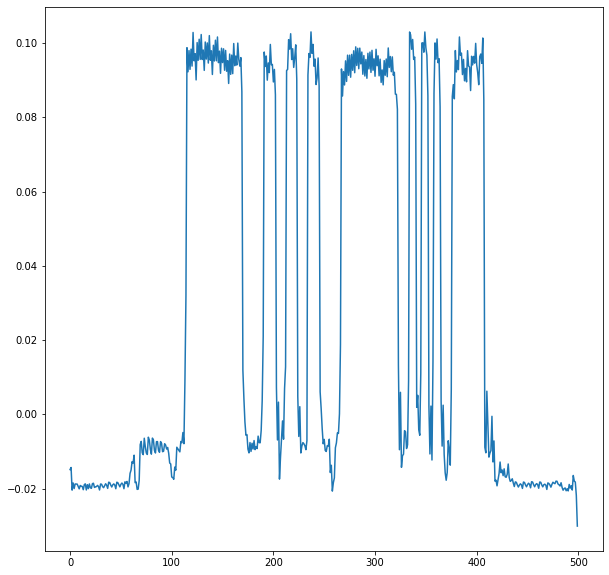

epoch [700/5000]     PSNR: 16.661819871882106 |  SSIM: 0.23512911460876784 | Phase PSNR: 8.925882547832096
epoch [800/5000]     Loss: 0.005530009035561416


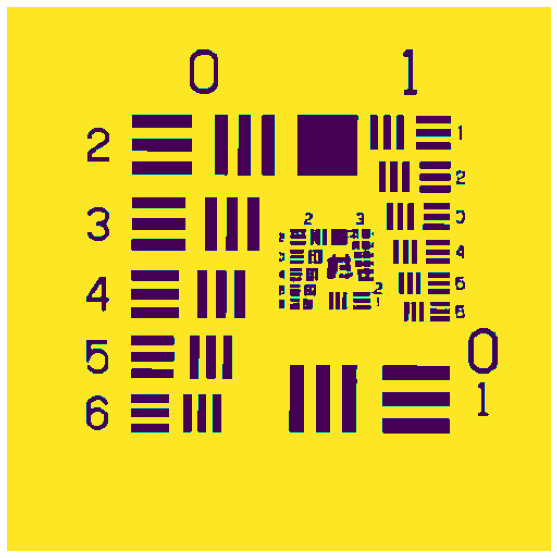

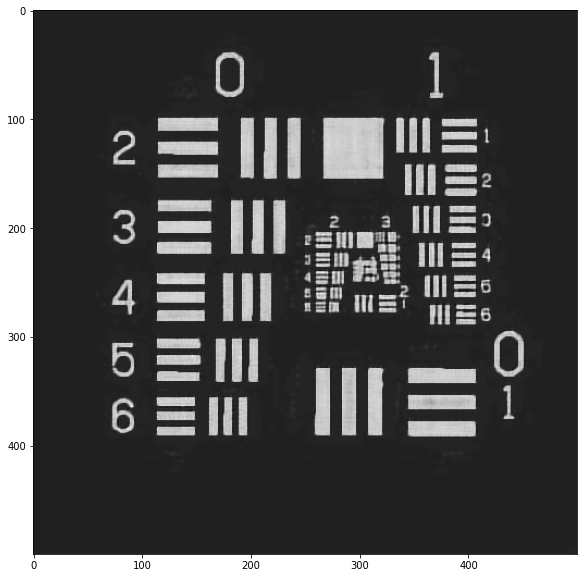

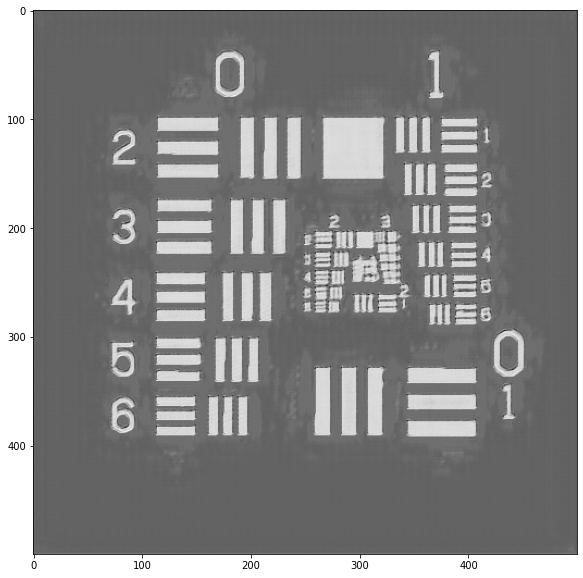

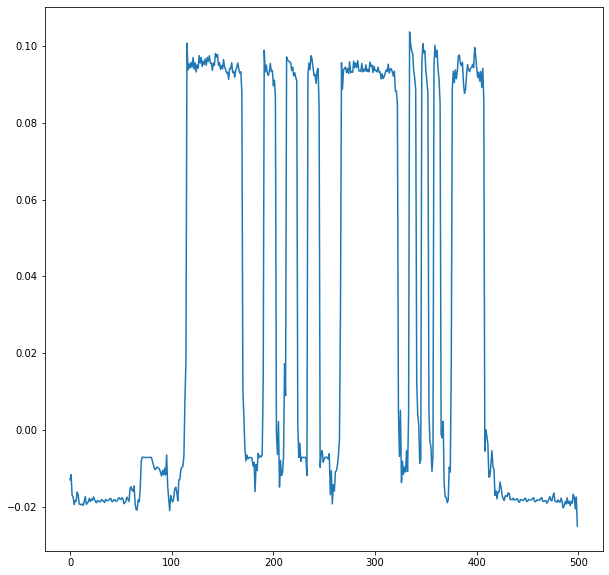

epoch [800/5000]     PSNR: 16.43089618239122 |  SSIM: 0.23635792256941257 | Phase PSNR: 8.927158678448452
epoch [900/5000]     Loss: 0.004916667991087176


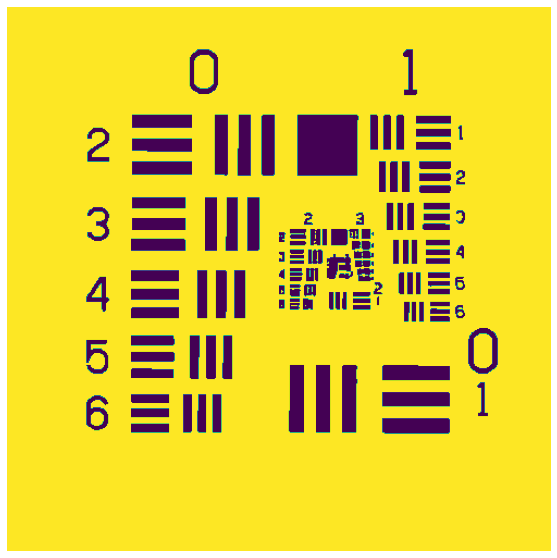

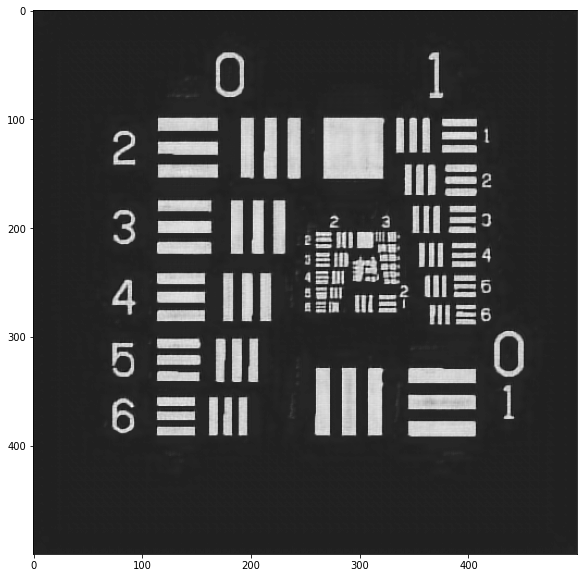

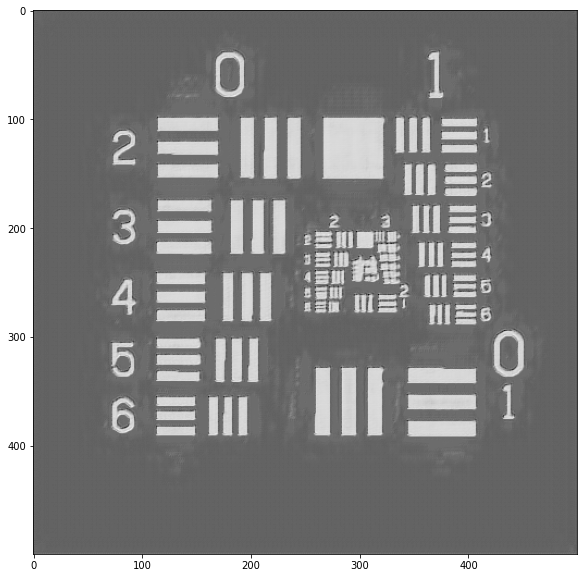

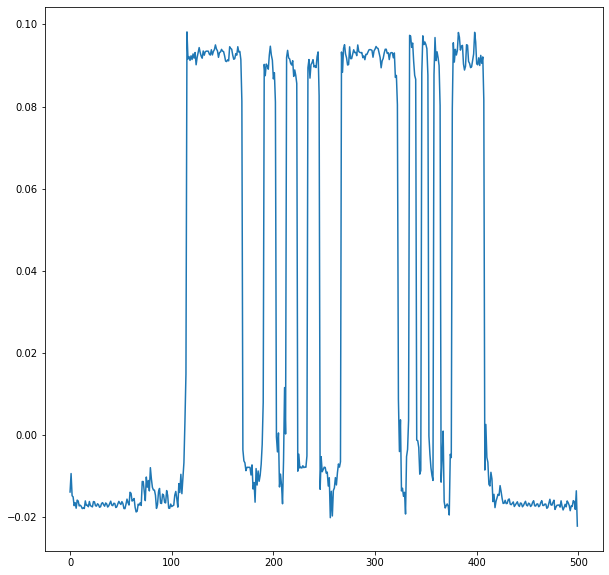

epoch [900/5000]     PSNR: 16.620216578154935 |  SSIM: 0.23997278356578272 | Phase PSNR: 8.926970182804325
epoch [1000/5000]     Loss: 0.004373107498132815


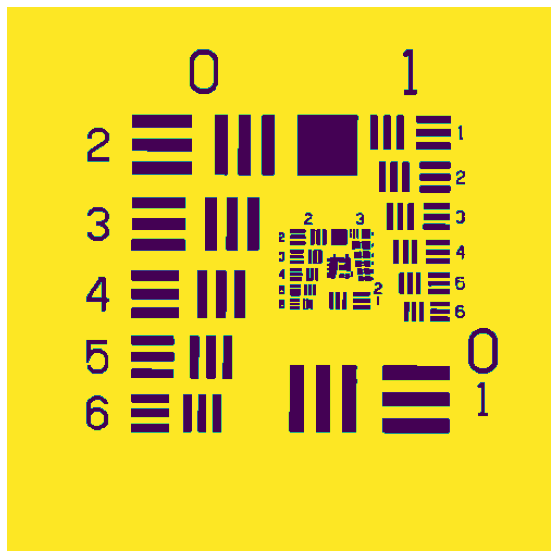

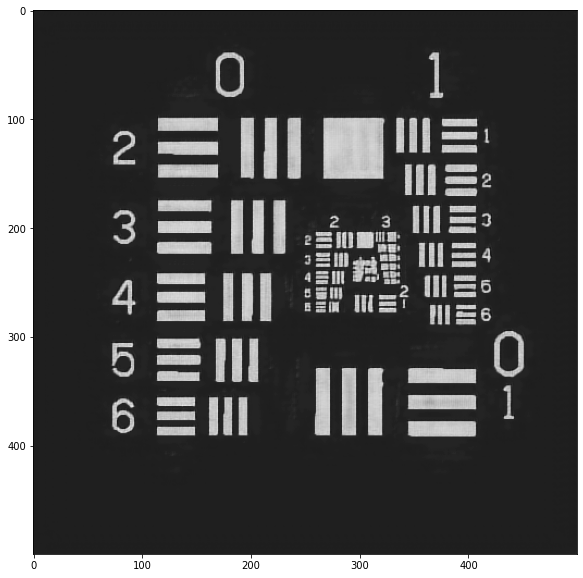

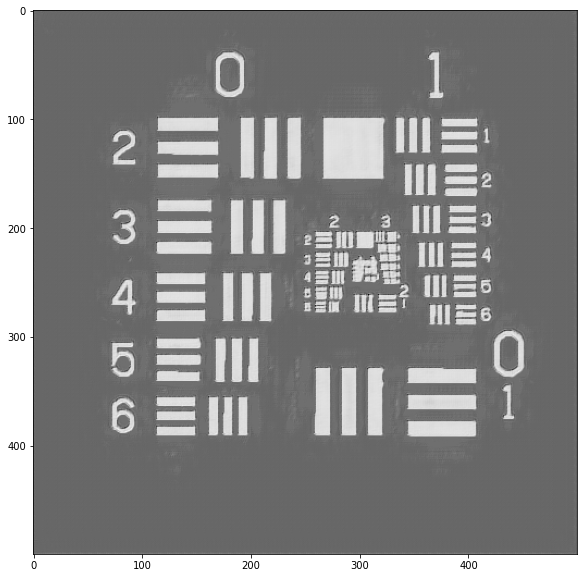

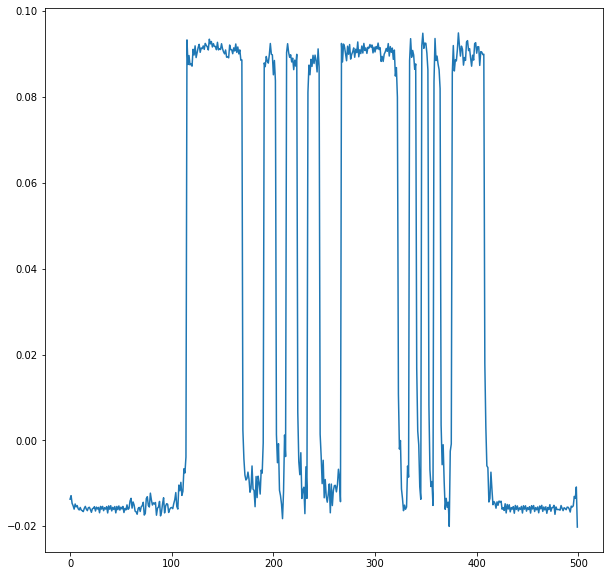

epoch [1000/5000]     PSNR: 16.7988770147494 |  SSIM: 0.24272867956548907 | Phase PSNR: 8.927910213035737
epoch [1100/5000]     Loss: 0.00395801949807145


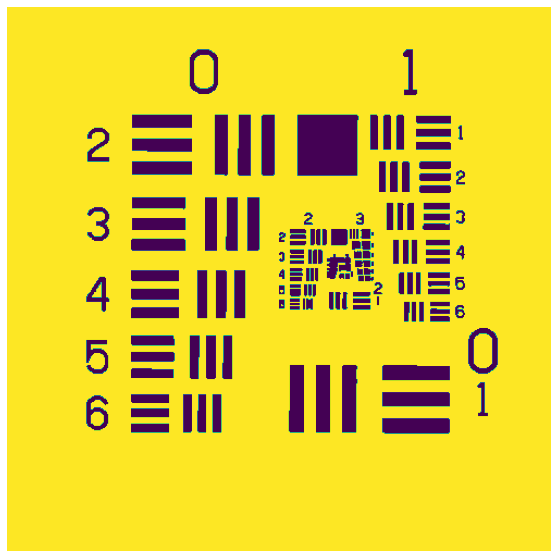

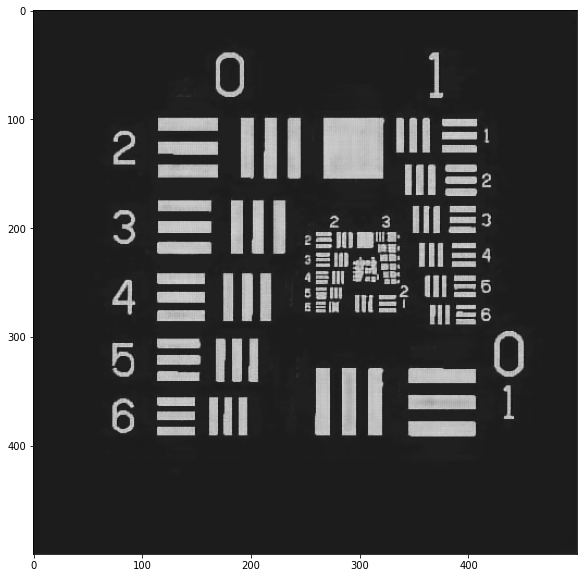

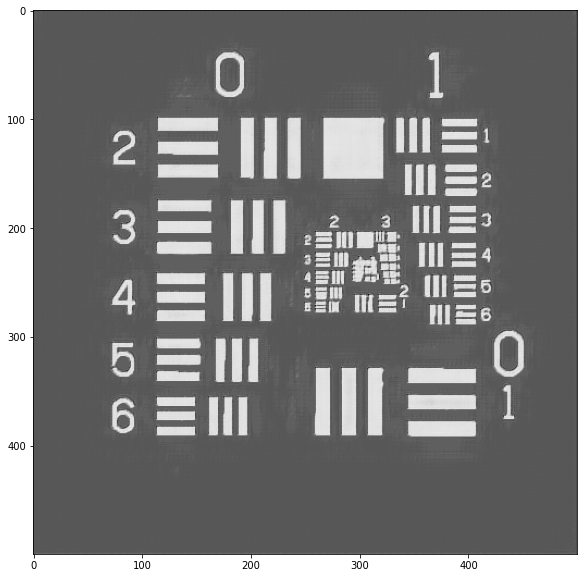

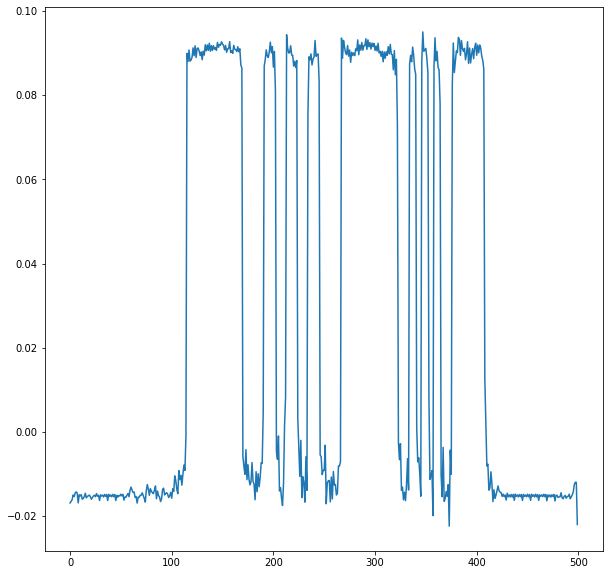

epoch [1100/5000]     PSNR: 16.992394780665737 |  SSIM: 0.24713908275080138 | Phase PSNR: 8.928410314700633
epoch [1200/5000]     Loss: 0.003789980219909878


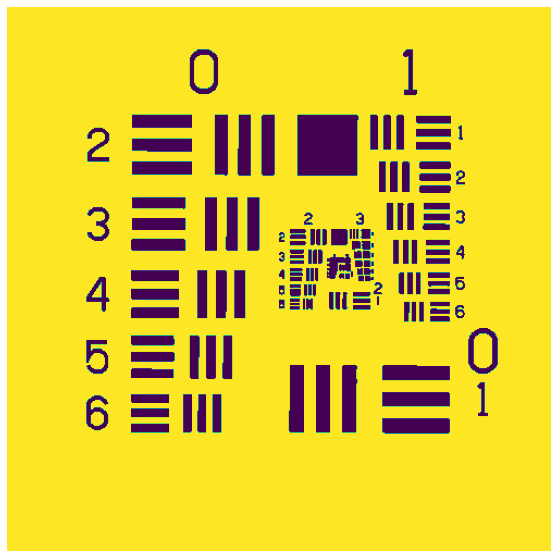

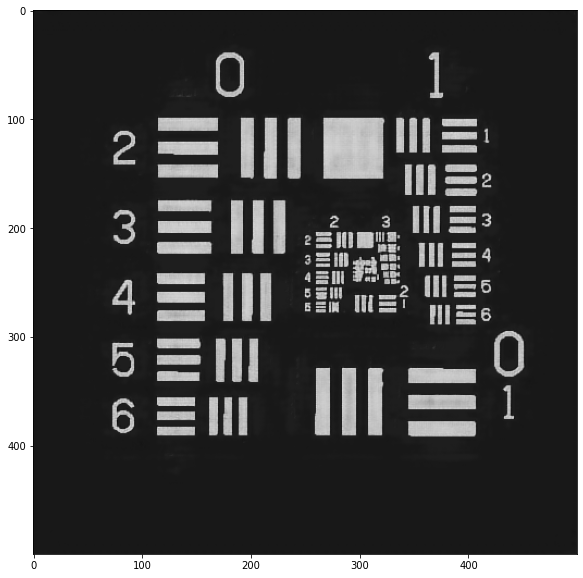

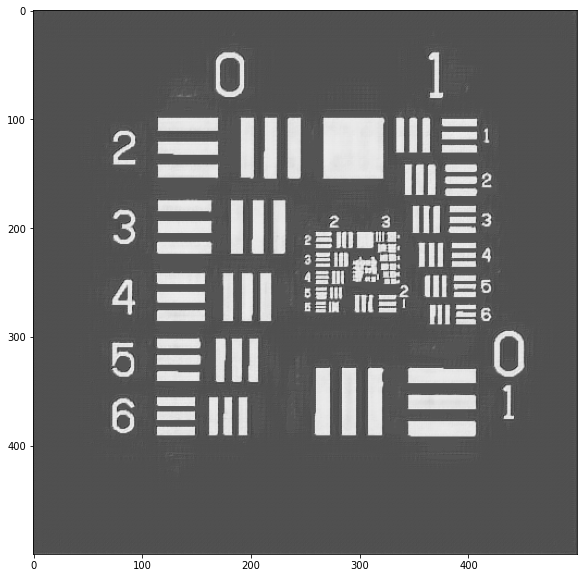

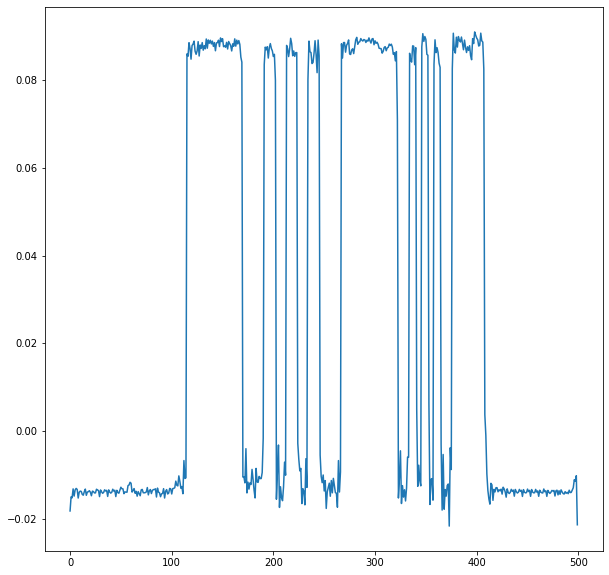

epoch [1200/5000]     PSNR: 17.81344603143023 |  SSIM: 0.26031709230897 | Phase PSNR: 8.928947483882038
epoch [1300/5000]     Loss: 0.007833160184147866


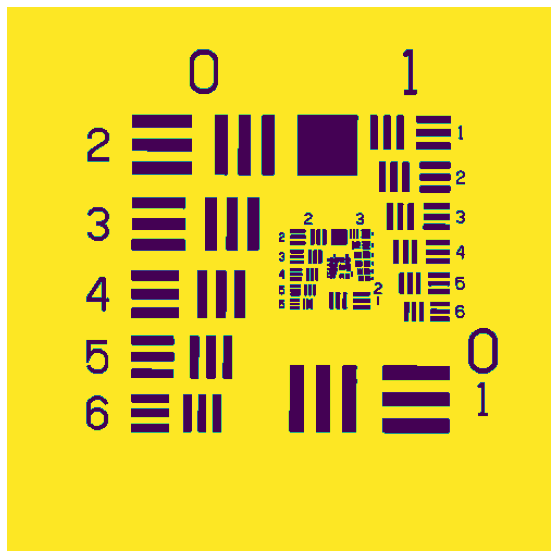

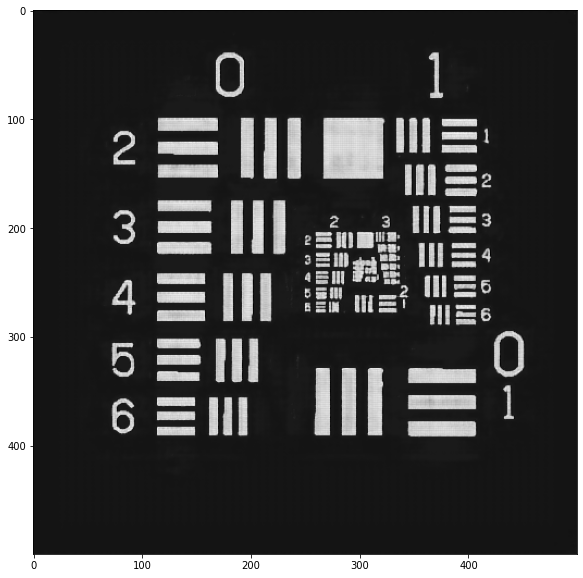

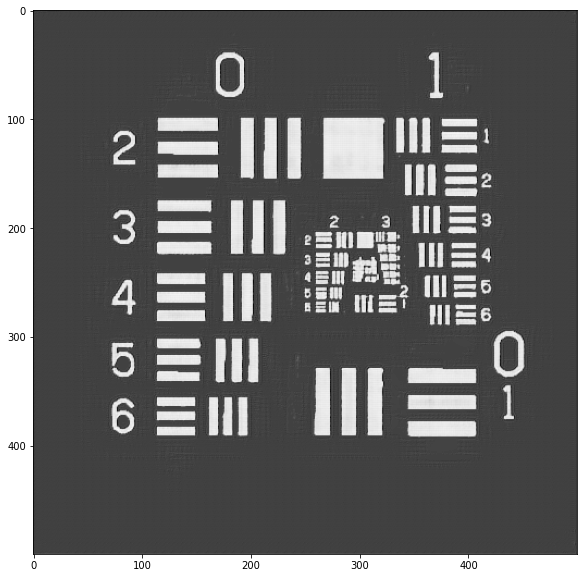

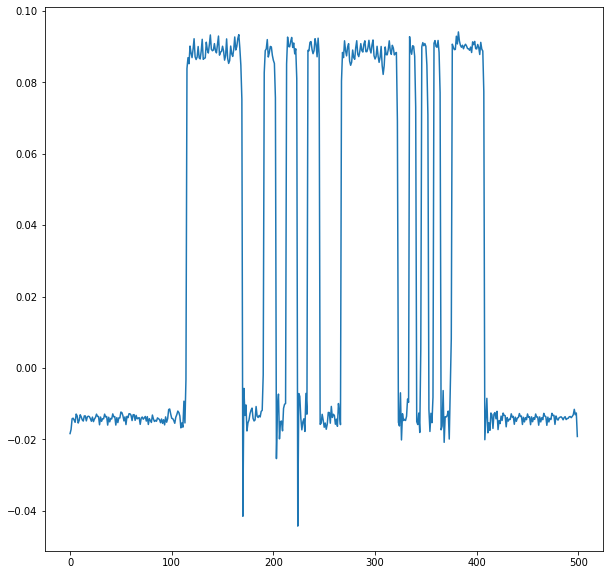

epoch [1300/5000]     PSNR: 19.288869848429545 |  SSIM: 0.2750372042118039 | Phase PSNR: 8.929241729647755
epoch [1400/5000]     Loss: 0.003970499946609022


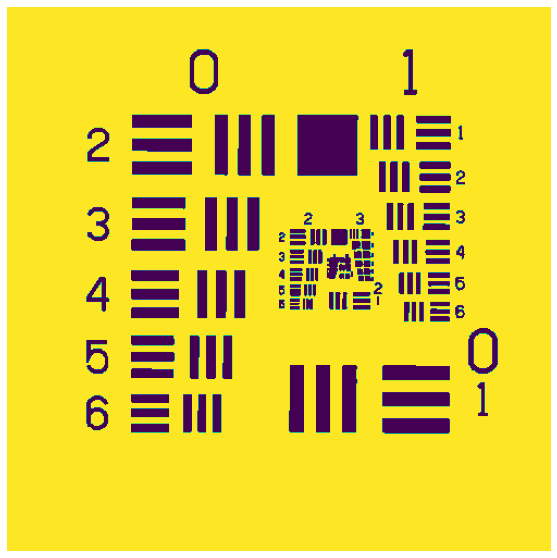

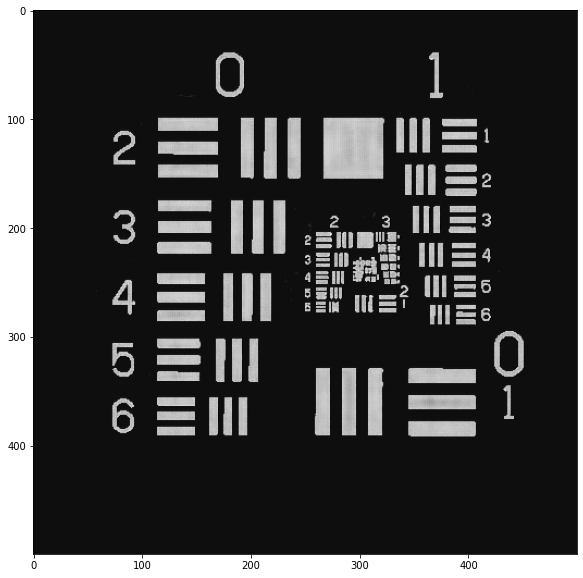

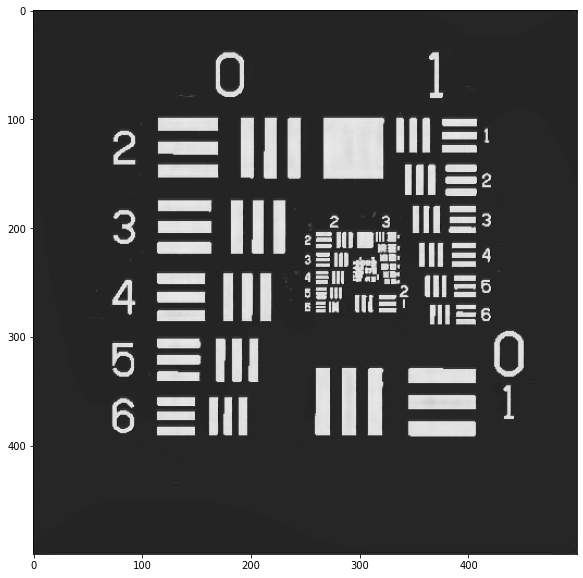

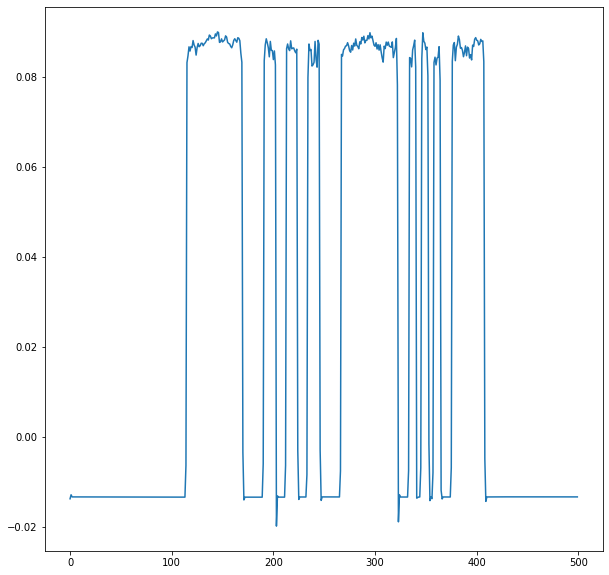

epoch [1400/5000]     PSNR: 19.853027483292742 |  SSIM: 0.33203510015317994 | Phase PSNR: 8.928322103548838
epoch [1500/5000]     Loss: 0.0029818154861756554


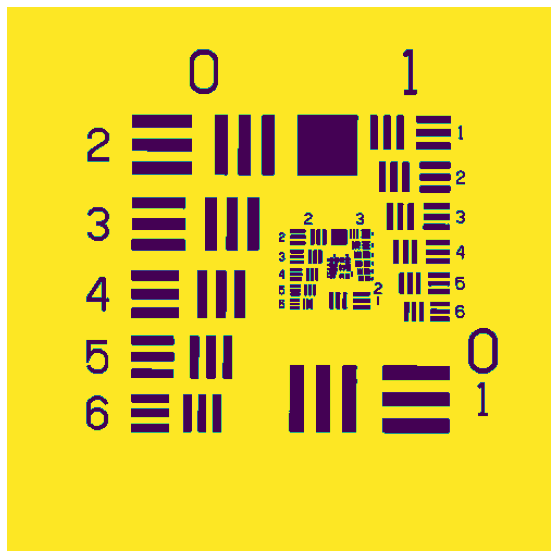

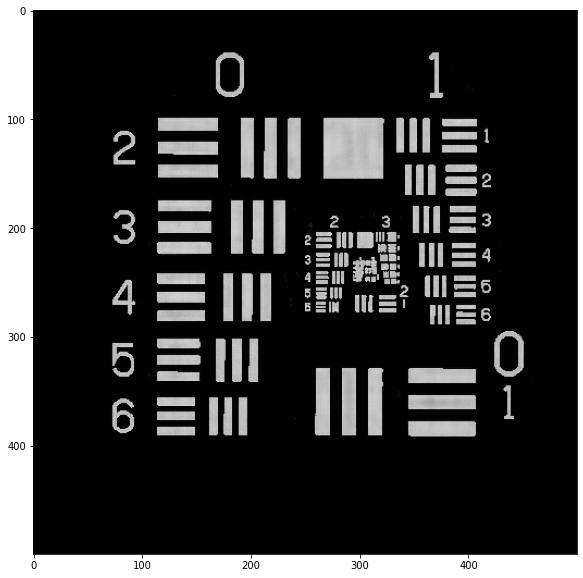

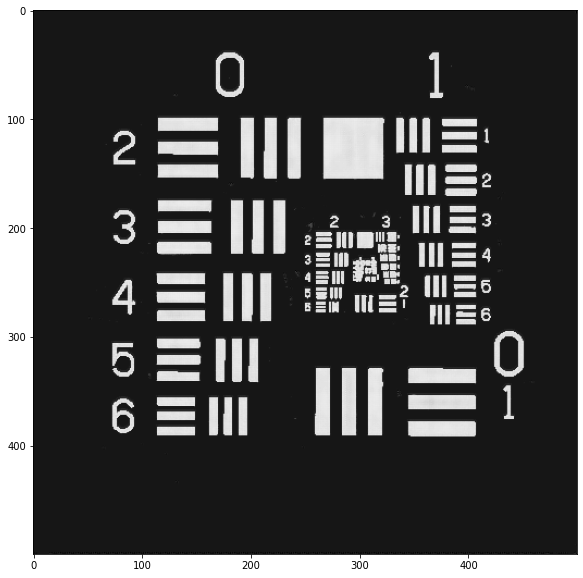

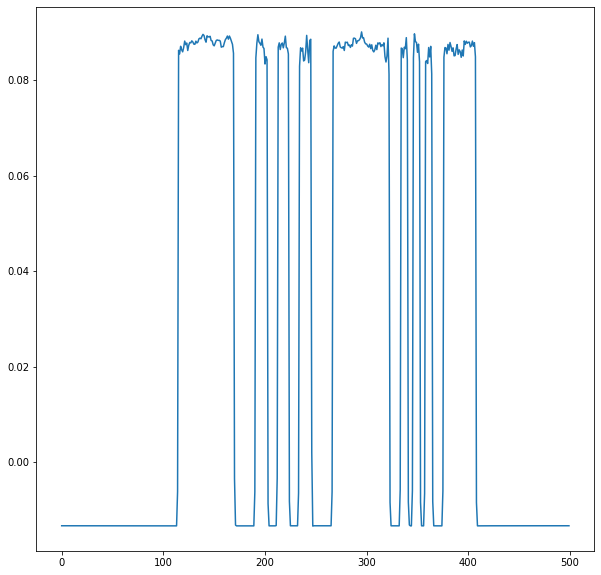

epoch [1500/5000]     PSNR: 20.990463607715736 |  SSIM: 0.8813297406428672 | Phase PSNR: 8.928725791995472
epoch [1600/5000]     Loss: 0.004246990324055587


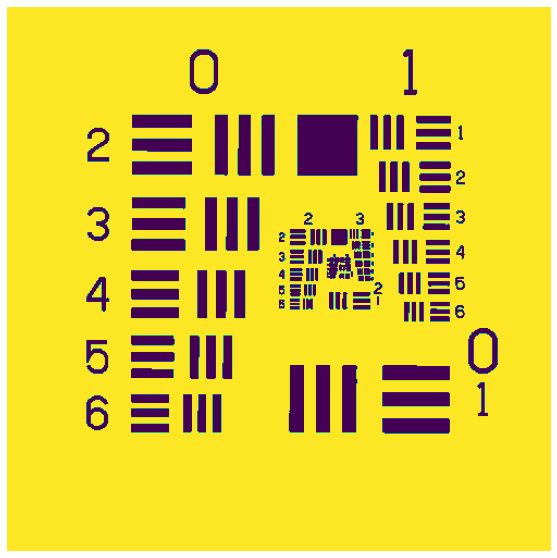

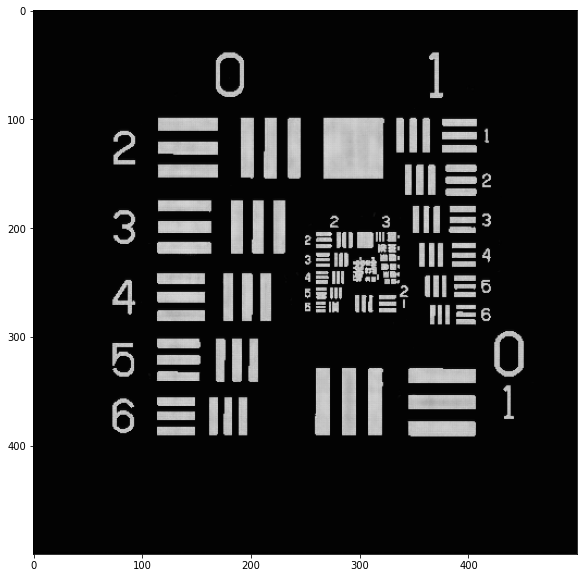

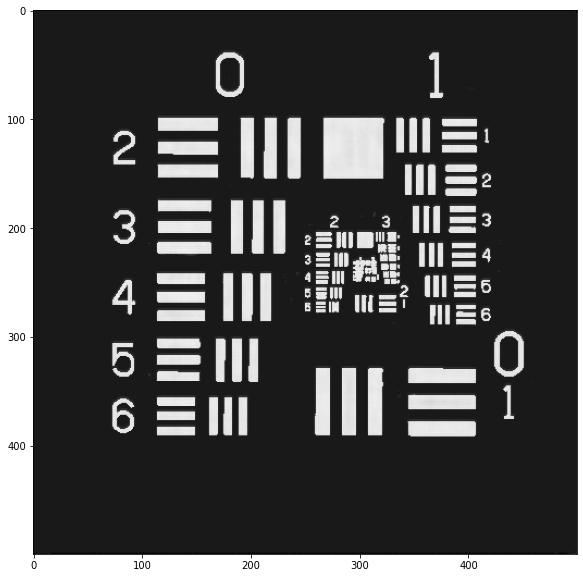

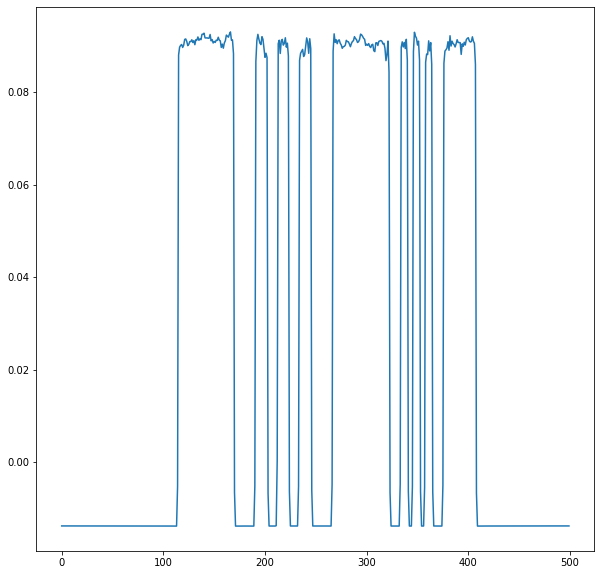

epoch [1600/5000]     PSNR: 21.28797210817229 |  SSIM: 0.7946514560940836 | Phase PSNR: 8.929150909650824
epoch [1700/5000]     Loss: 0.002936740499848389


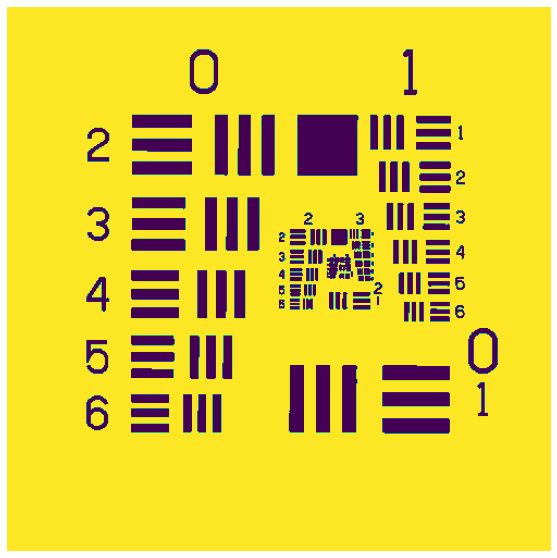

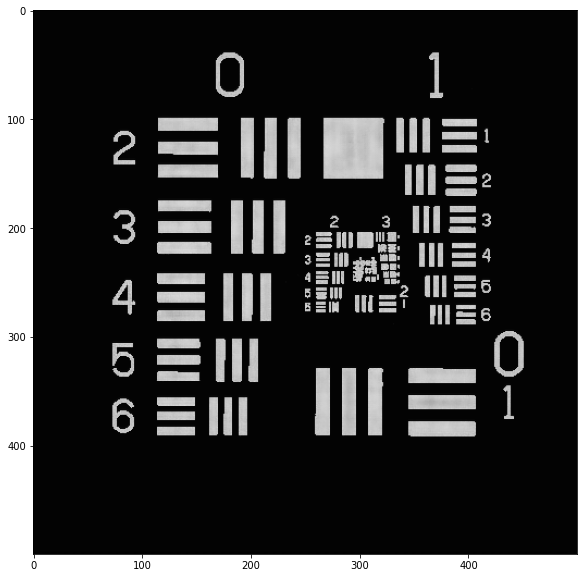

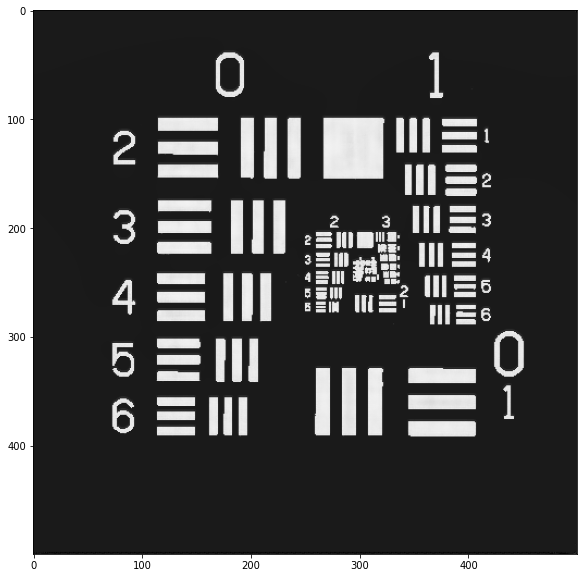

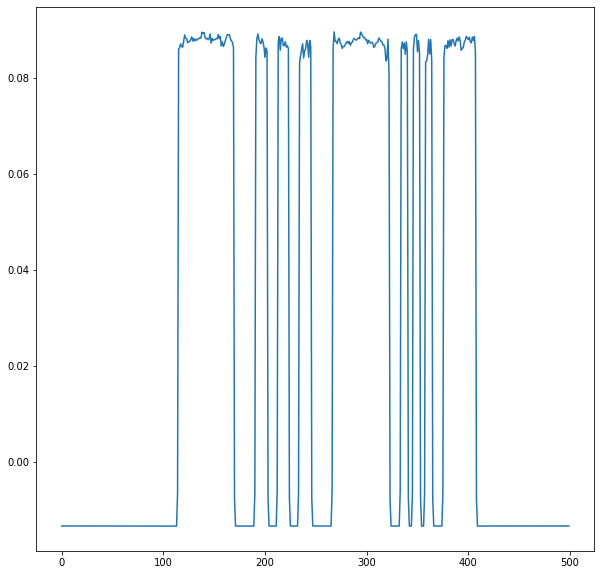

epoch [1700/5000]     PSNR: 21.8718938703244 |  SSIM: 0.7996342280215593 | Phase PSNR: 8.929535122352936
epoch [1800/5000]     Loss: 0.003014219459564513


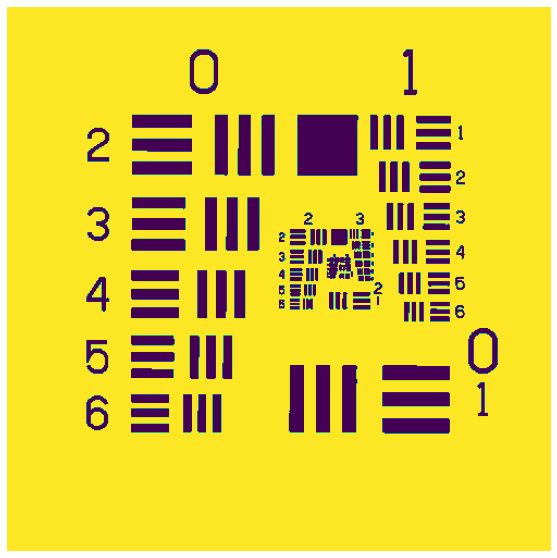

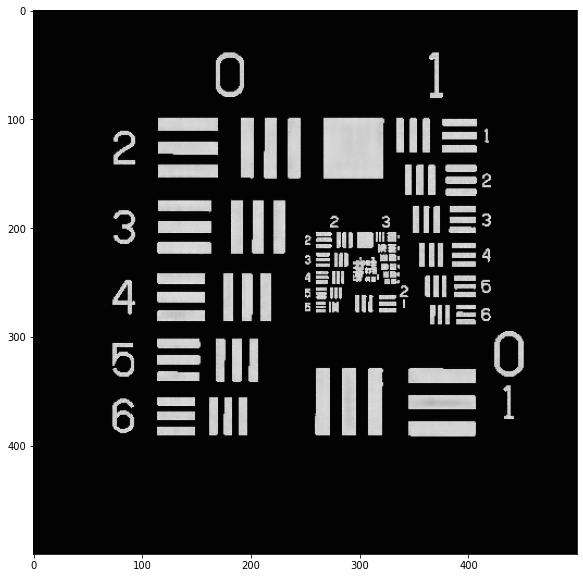

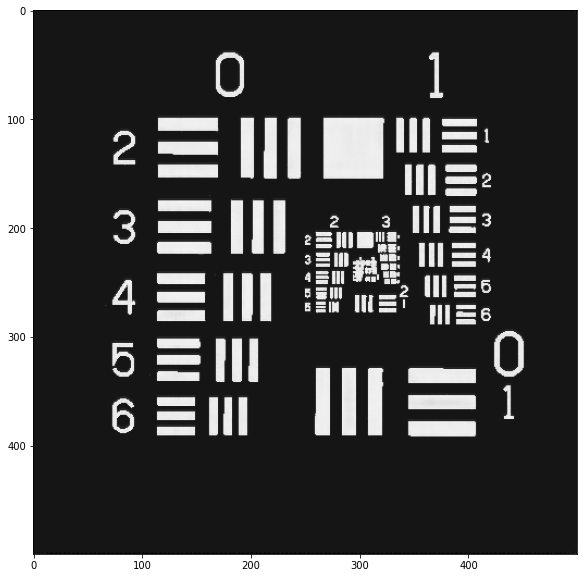

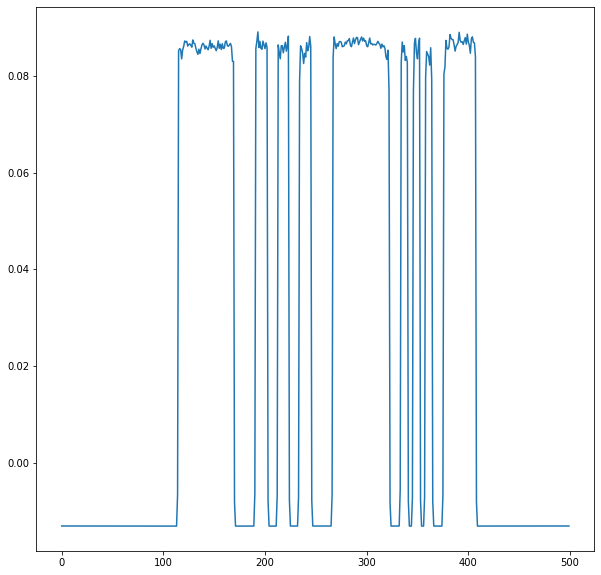

epoch [1800/5000]     PSNR: 23.524063290971373 |  SSIM: 0.8048320693390759 | Phase PSNR: 8.929910158809191
epoch [1900/5000]     Loss: 0.0030213888878281793


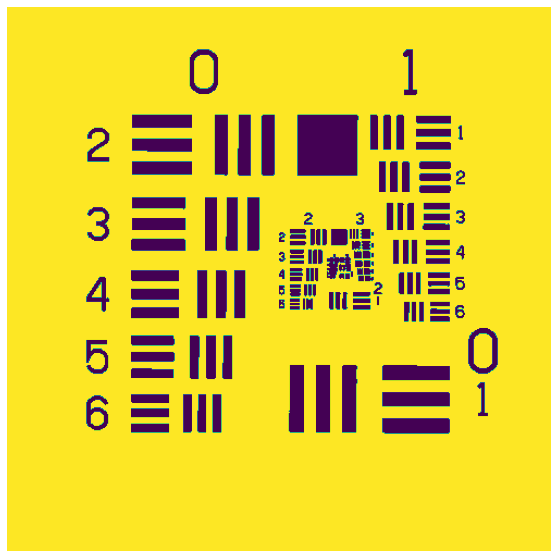

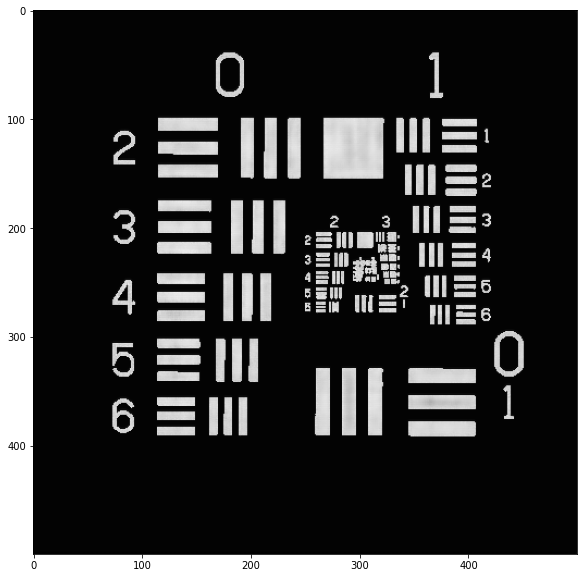

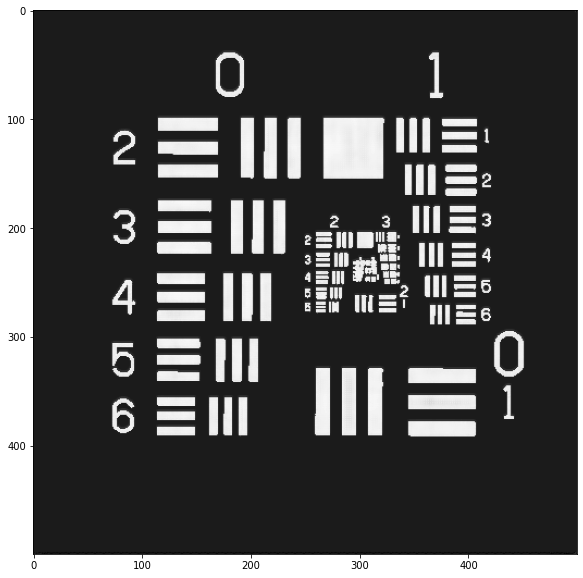

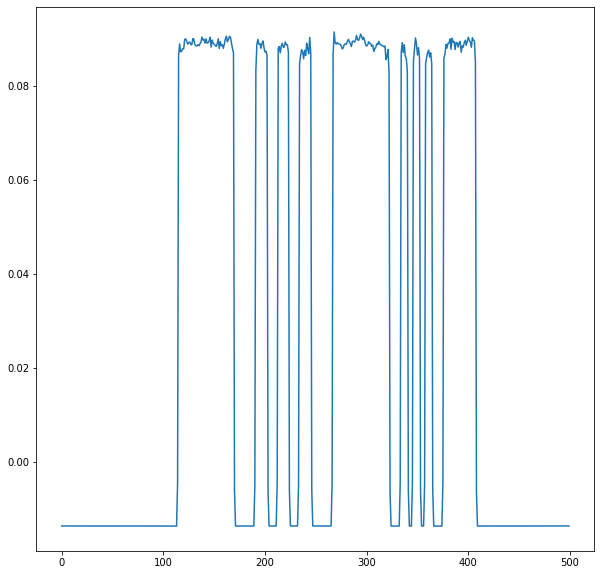

epoch [1900/5000]     PSNR: 24.623449731954416 |  SSIM: 0.8051114329274824 | Phase PSNR: 8.930400862942674
epoch [2000/5000]     Loss: 0.002713284482275338


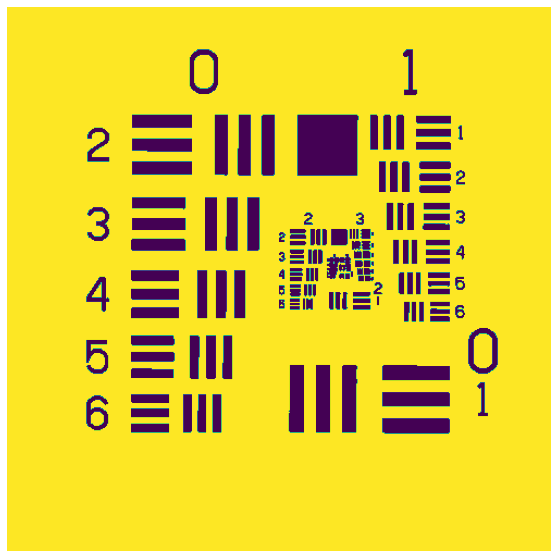

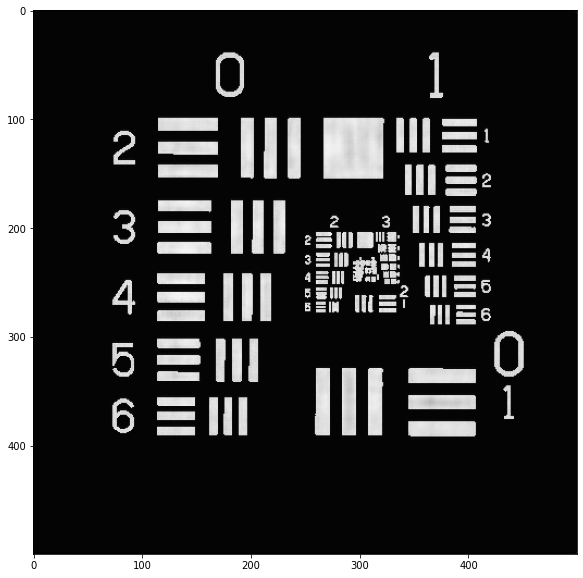

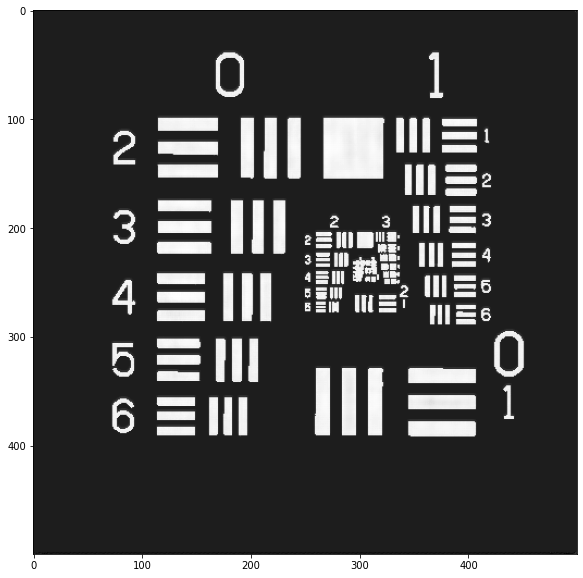

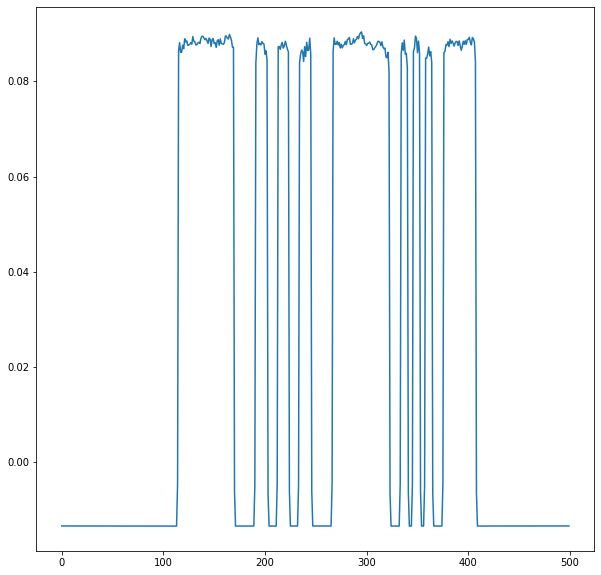

epoch [2000/5000]     PSNR: 26.194767883428987 |  SSIM: 0.7187758280772152 | Phase PSNR: 8.930928988656685
epoch [2100/5000]     Loss: 0.003160096952025464


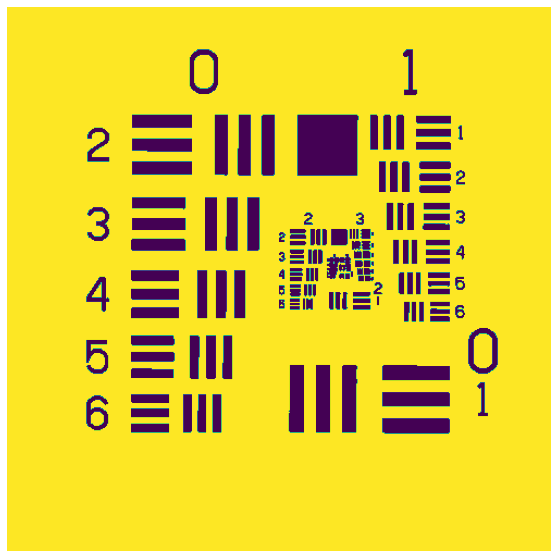

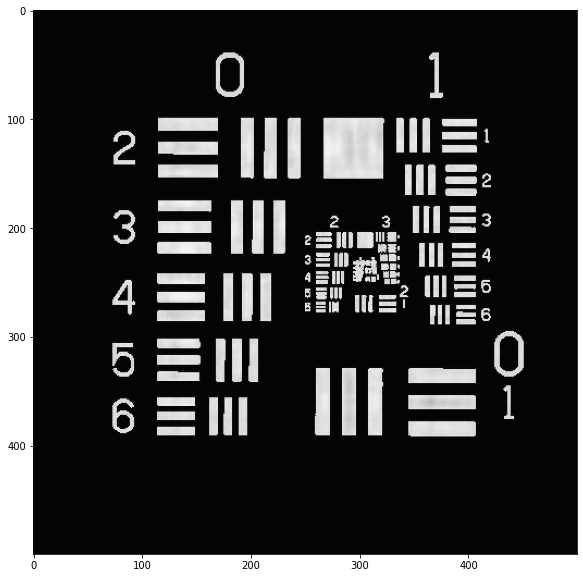

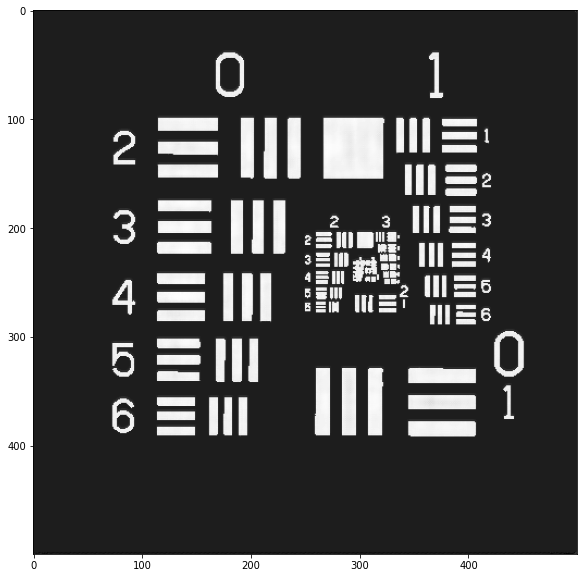

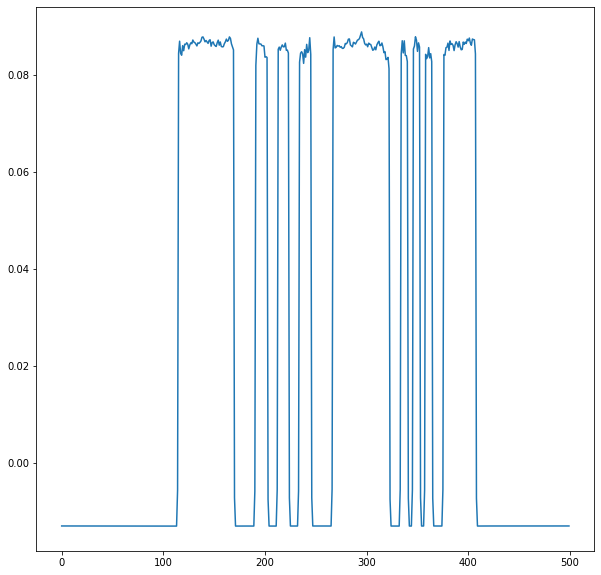

epoch [2100/5000]     PSNR: 26.290083860224215 |  SSIM: 0.7198848989279434 | Phase PSNR: 8.930831997243725
epoch [2200/5000]     Loss: 0.002811962008918215


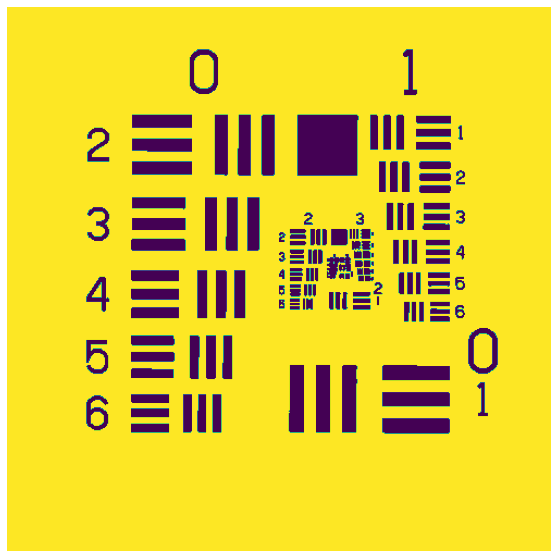

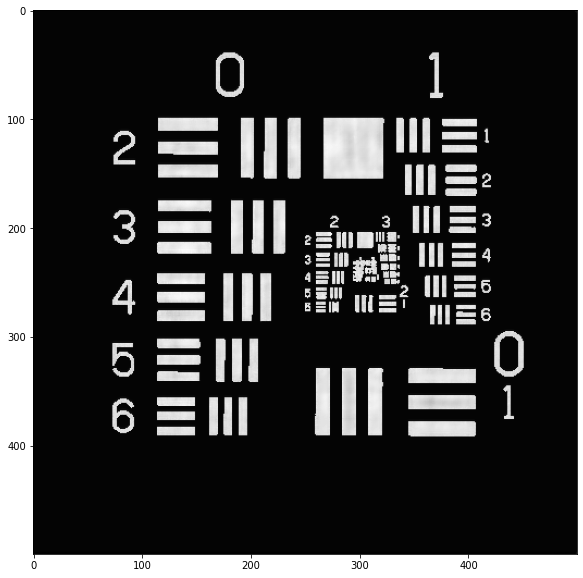

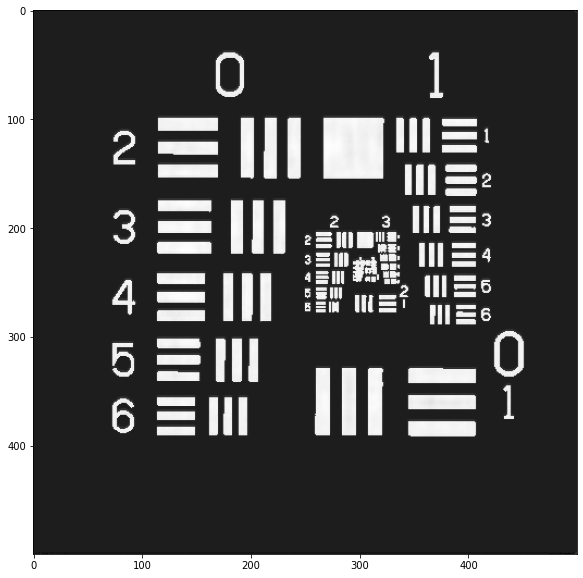

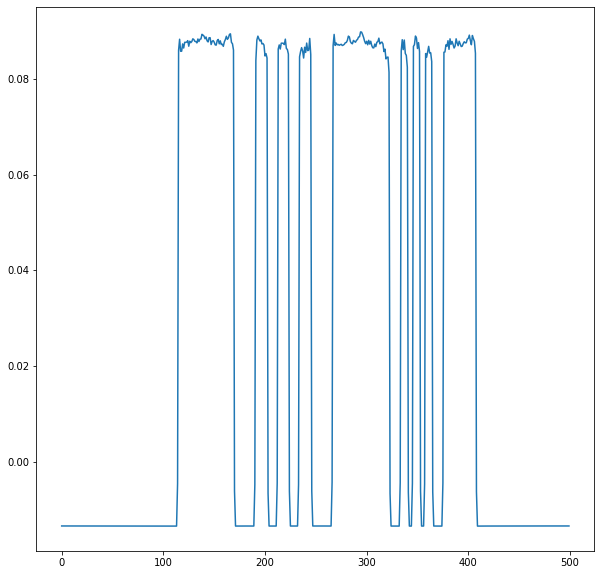

epoch [2200/5000]     PSNR: 27.026970197709474 |  SSIM: 0.7198573776301371 | Phase PSNR: 8.930856579555083
epoch [2300/5000]     Loss: 0.002633083526691654


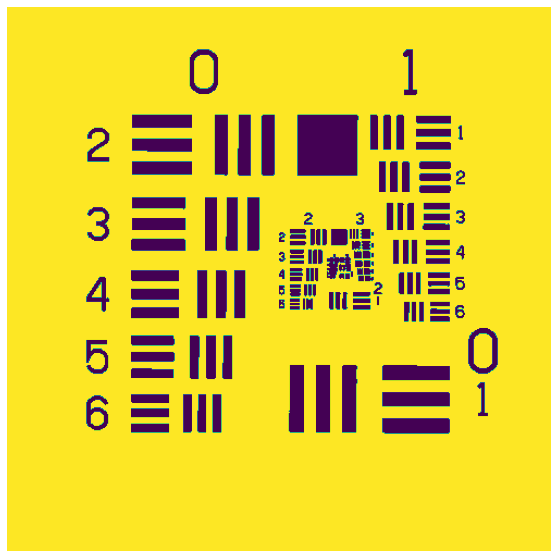

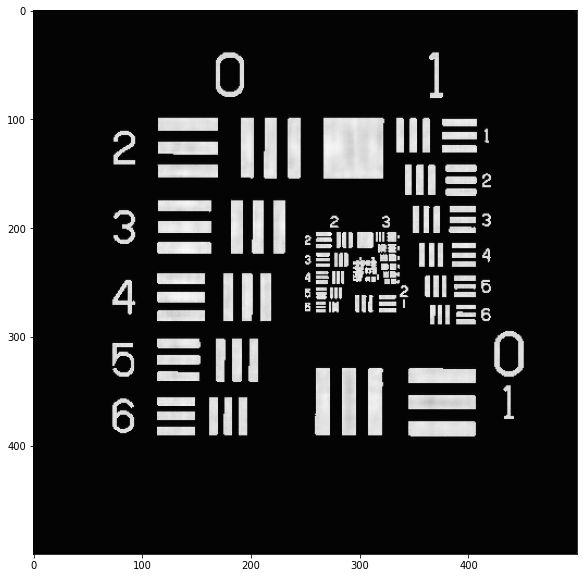

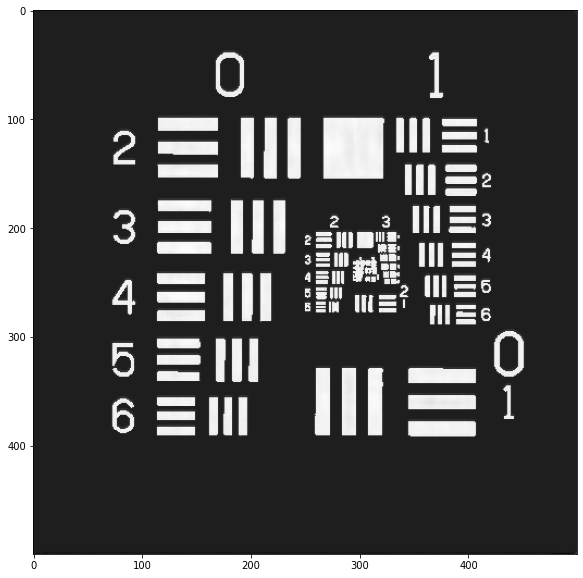

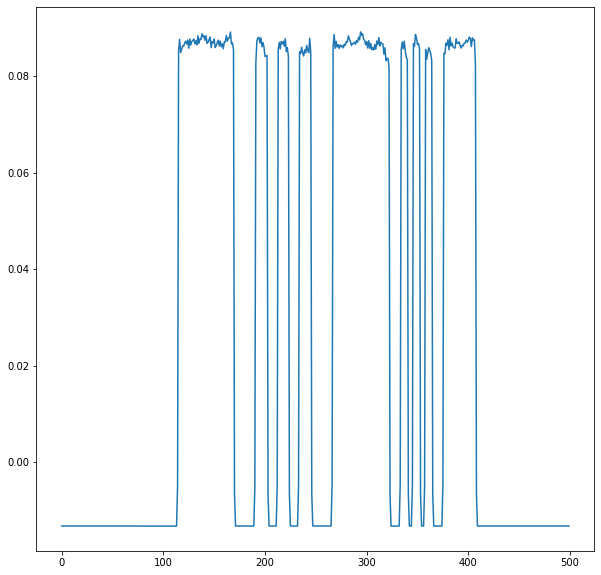

epoch [2300/5000]     PSNR: 26.6940508563869 |  SSIM: 0.7195711707898588 | Phase PSNR: 8.930697098638912
epoch [2400/5000]     Loss: 0.0029221080062104697


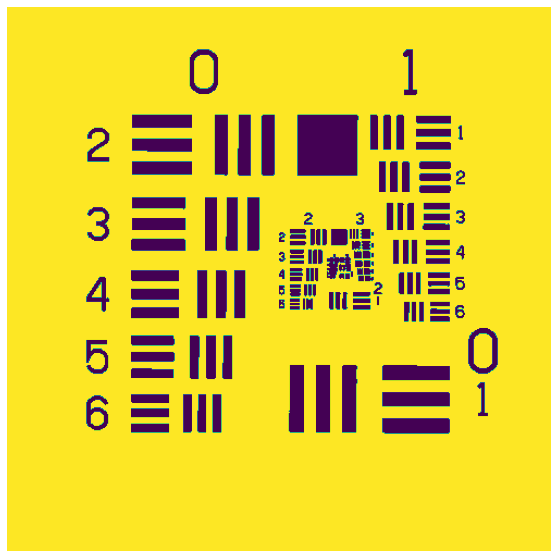

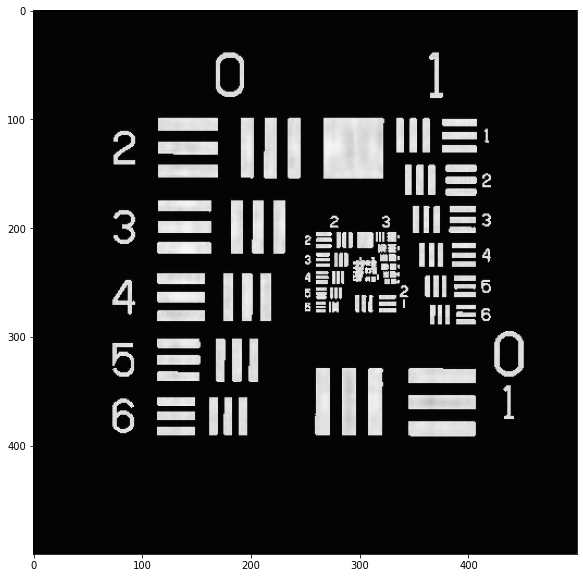

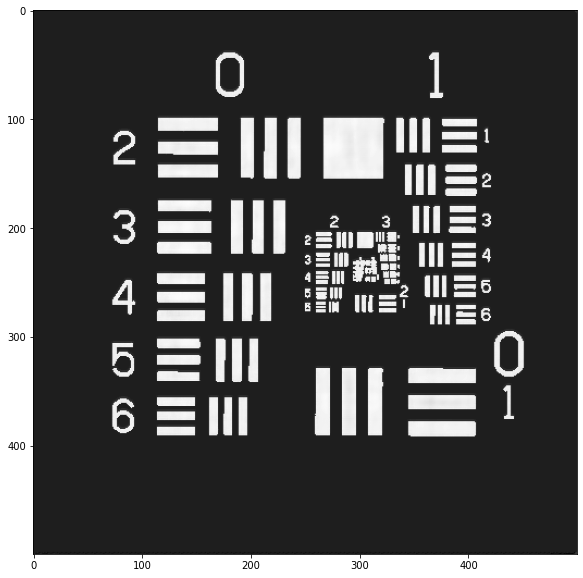

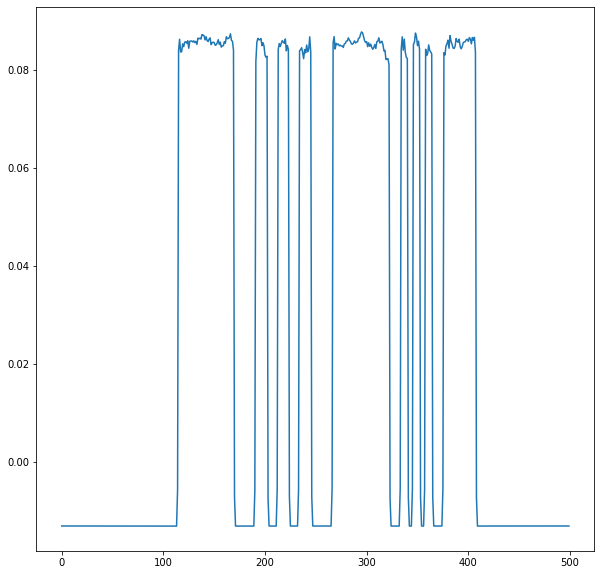

epoch [2400/5000]     PSNR: 26.731534543535112 |  SSIM: 0.7202581137285485 | Phase PSNR: 8.930637344354812
epoch [2500/5000]     Loss: 0.0027482618374283863


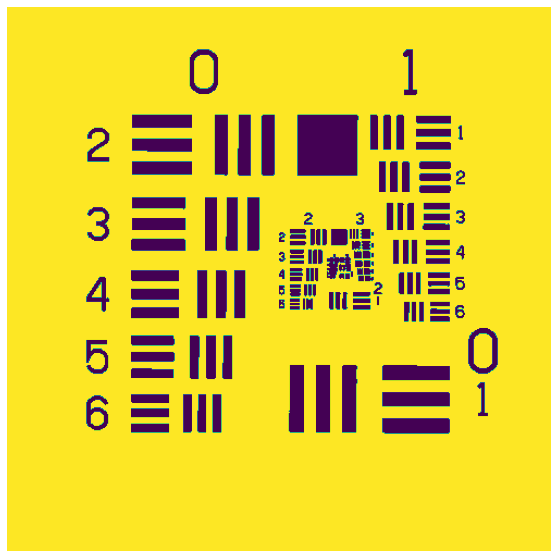

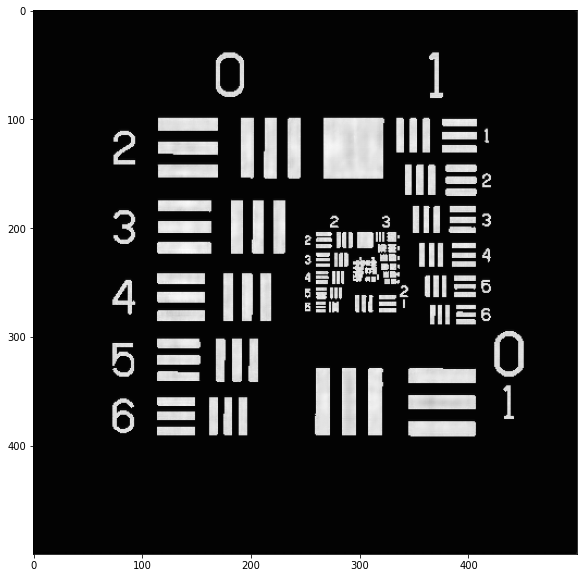

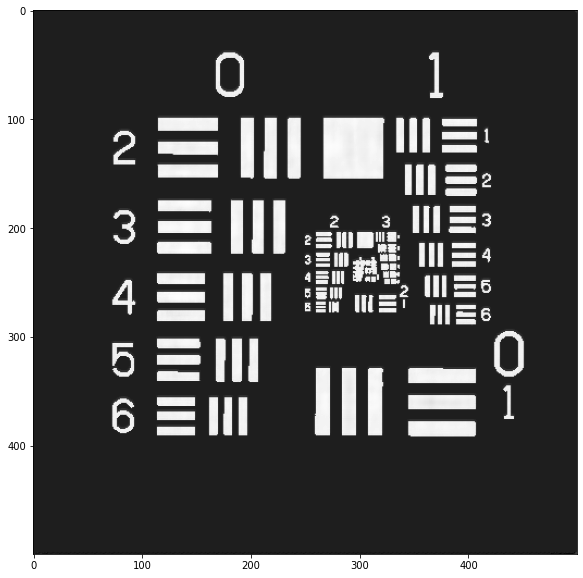

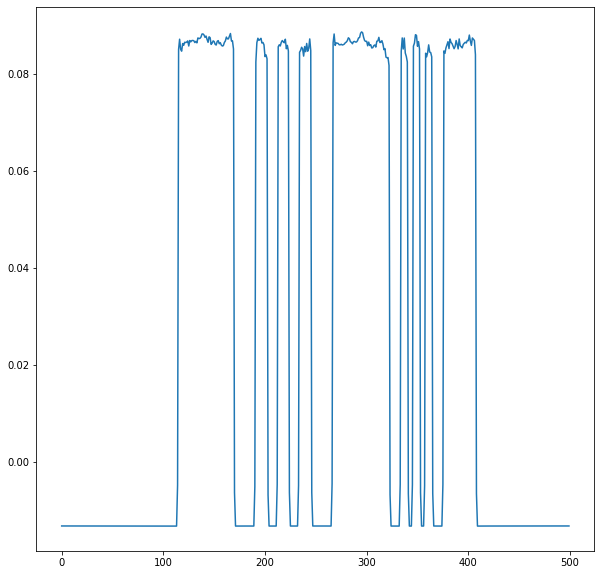

epoch [2500/5000]     PSNR: 26.943520703170382 |  SSIM: 0.8079378438668182 | Phase PSNR: 8.930783073152591
epoch [2600/5000]     Loss: 0.0030528526852159686


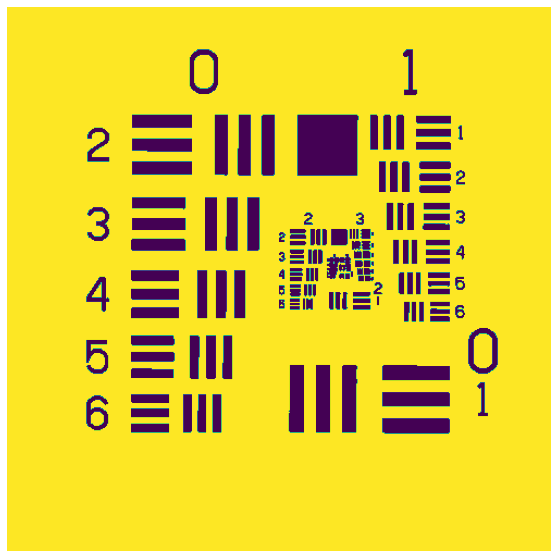

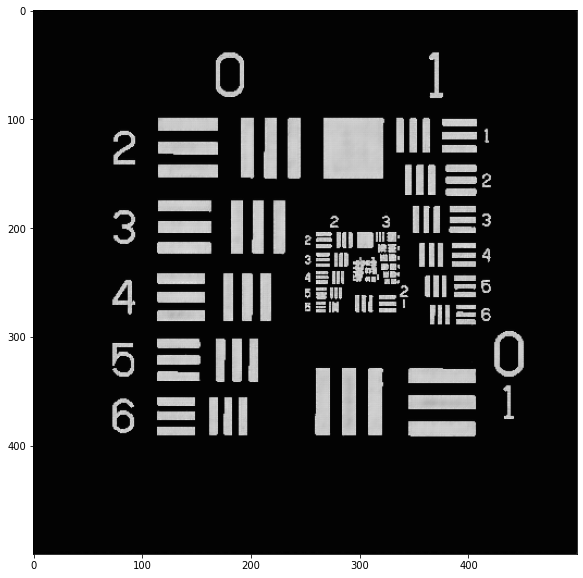

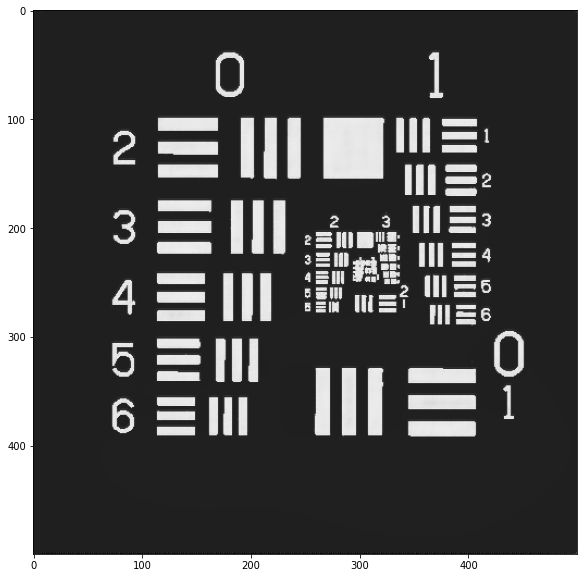

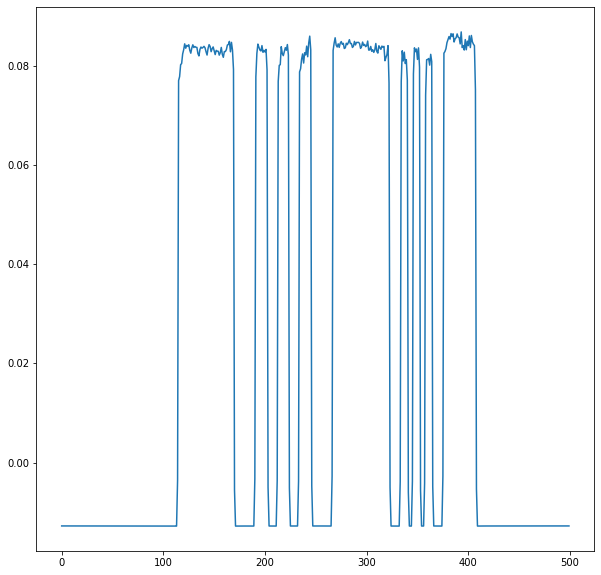

epoch [2600/5000]     PSNR: 22.23508905458972 |  SSIM: 0.800515419456233 | Phase PSNR: 8.929245403127808
epoch [2700/5000]     Loss: 0.0027424814089916103


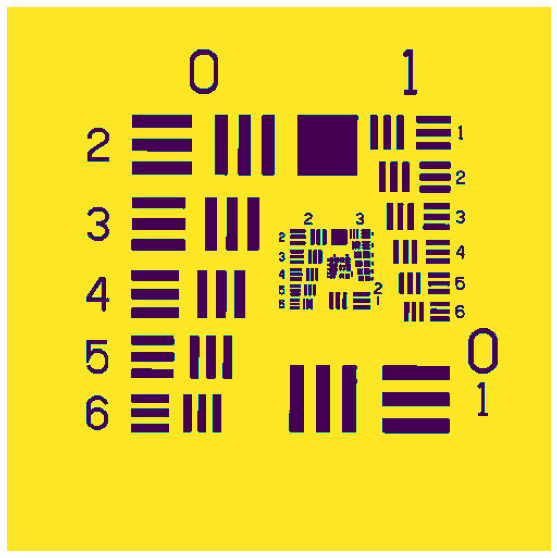

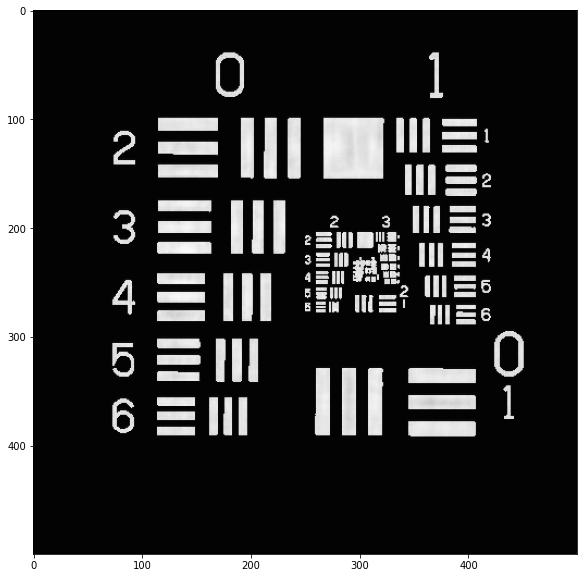

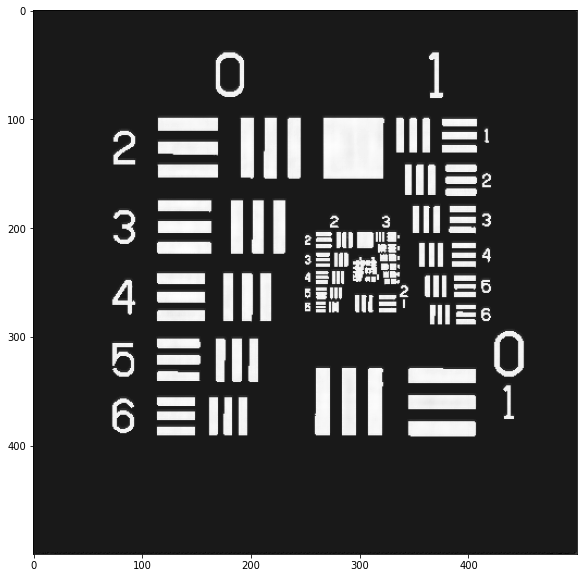

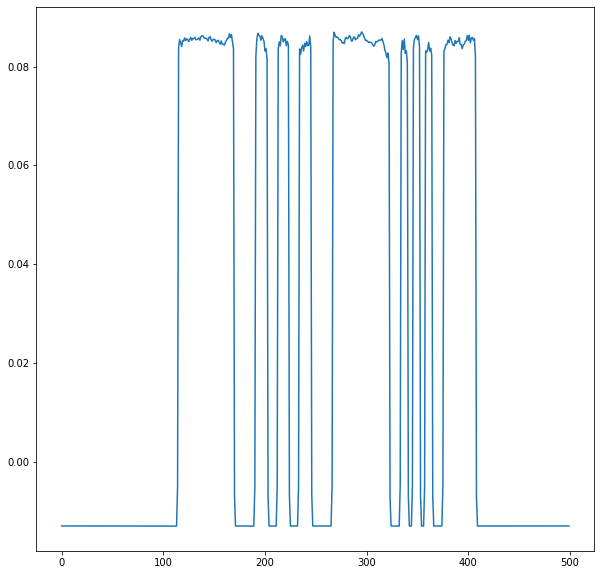

epoch [2700/5000]     PSNR: 27.954242723950067 |  SSIM: 0.8098137155451213 | Phase PSNR: 8.931090622686796
epoch [2800/5000]     Loss: 0.0027765694229997385


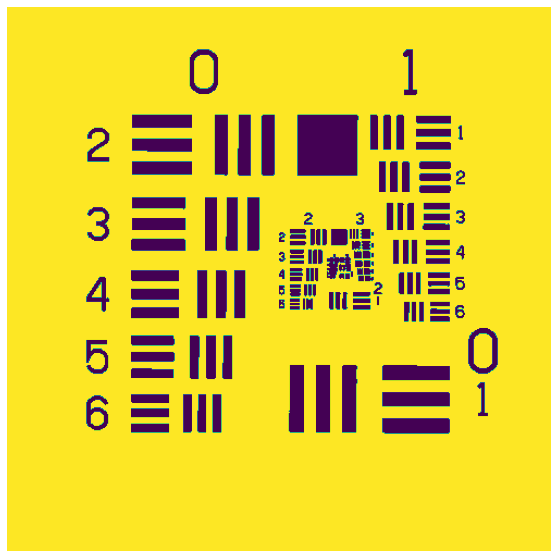

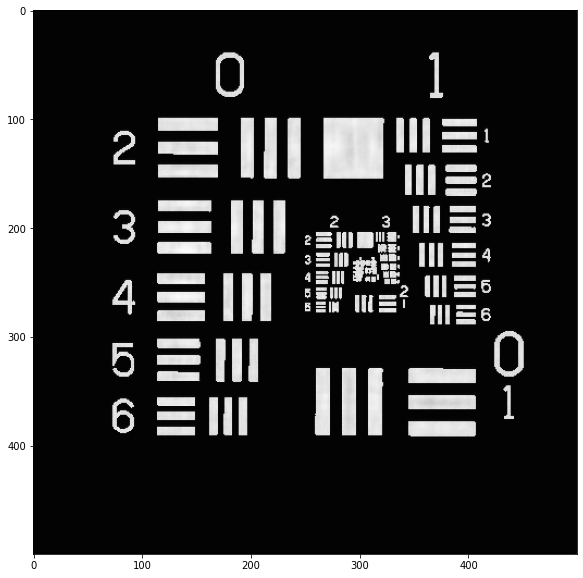

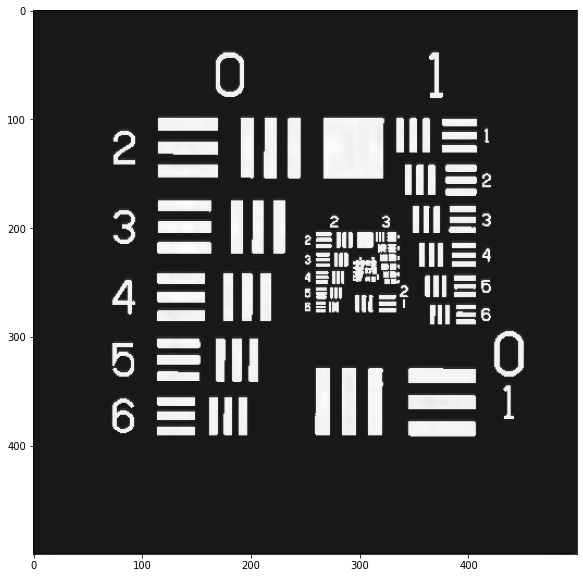

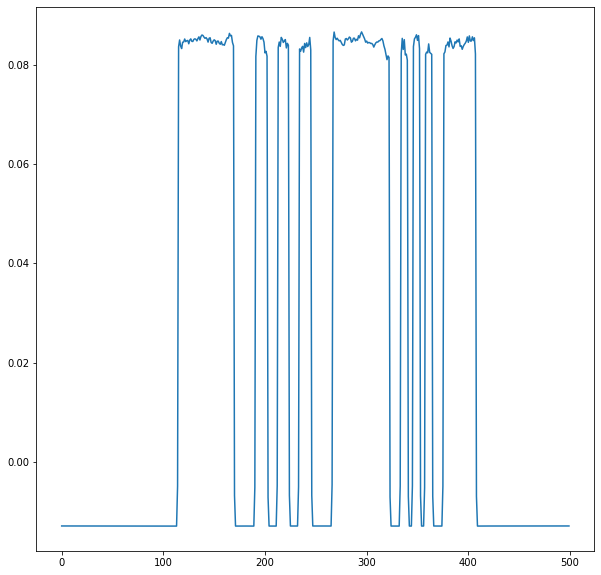

epoch [2800/5000]     PSNR: 27.719516174331815 |  SSIM: 0.809498236818879 | Phase PSNR: 8.93093397366599
epoch [2900/5000]     Loss: 0.0025697036957324343


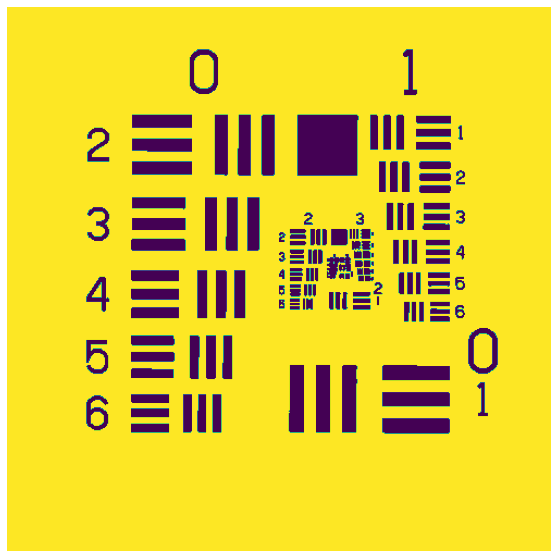

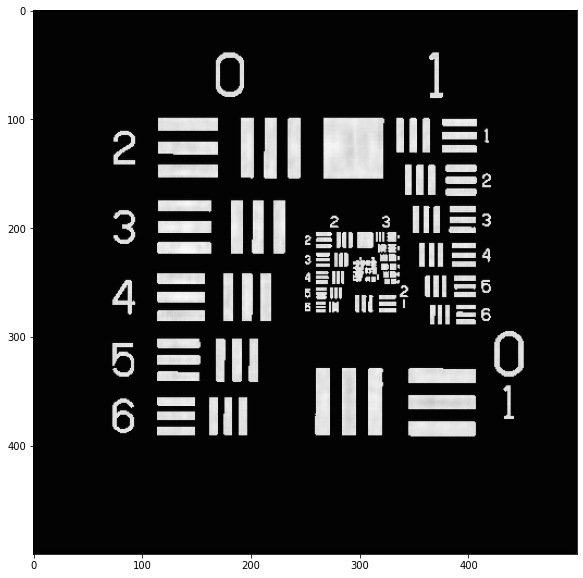

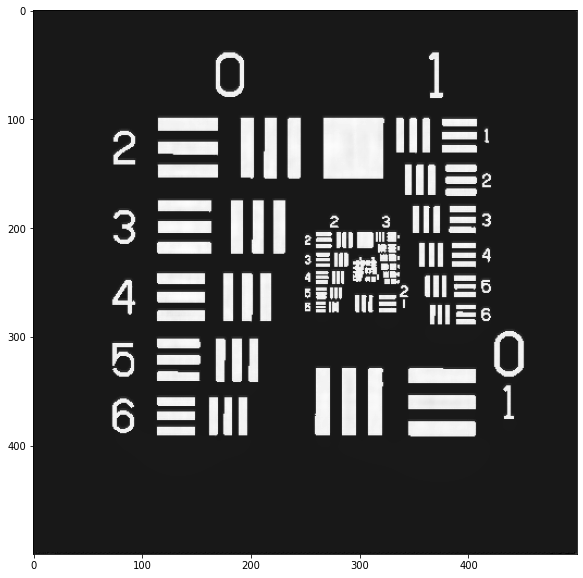

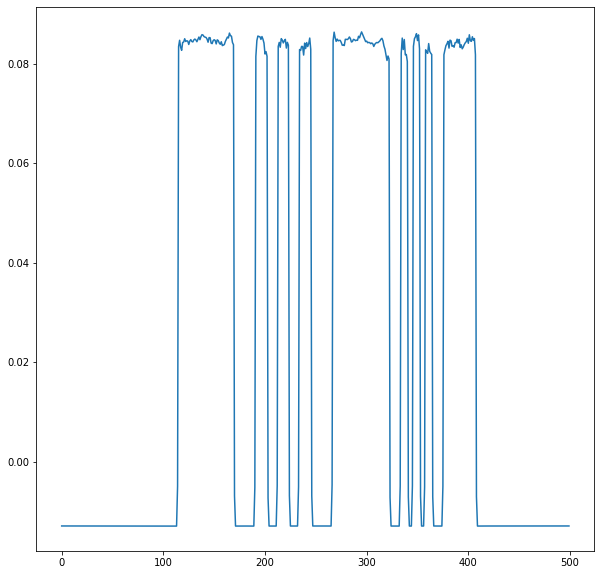

epoch [2900/5000]     PSNR: 27.468775614640037 |  SSIM: 0.8091726562206177 | Phase PSNR: 8.930820957570209
epoch [3000/5000]     Loss: 0.002617765505809795


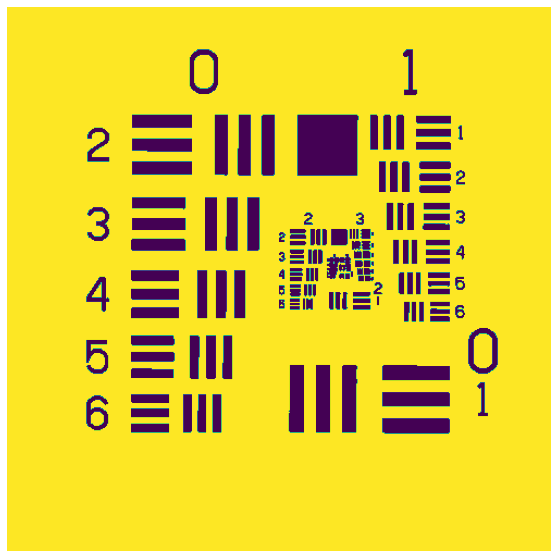

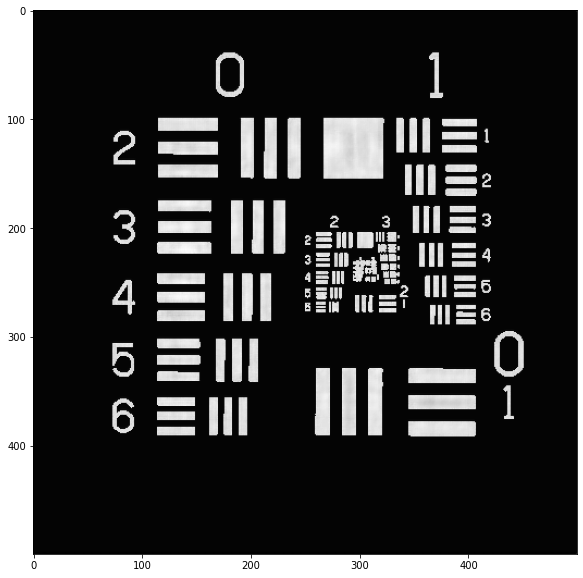

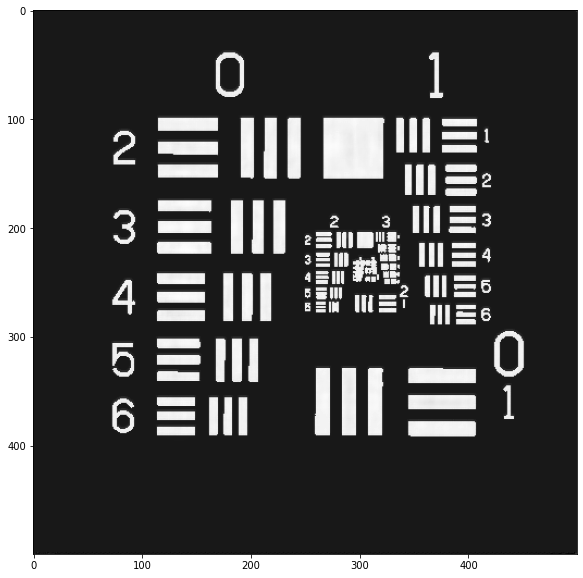

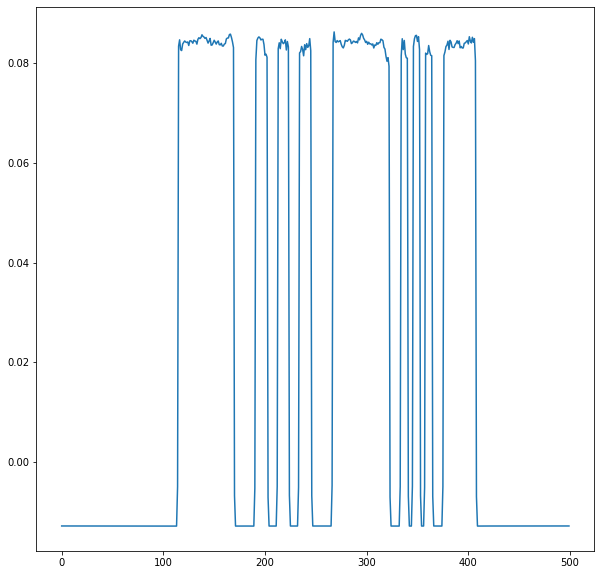

epoch [3000/5000]     PSNR: 27.120943948506543 |  SSIM: 0.7207470081776772 | Phase PSNR: 8.930675621955176
epoch [3100/5000]     Loss: 0.002526515063801204


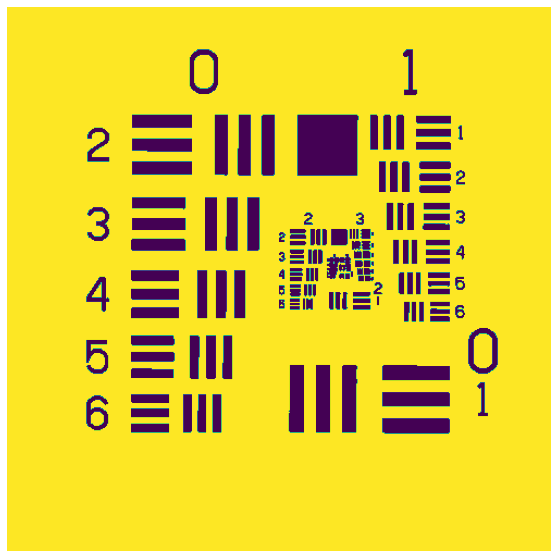

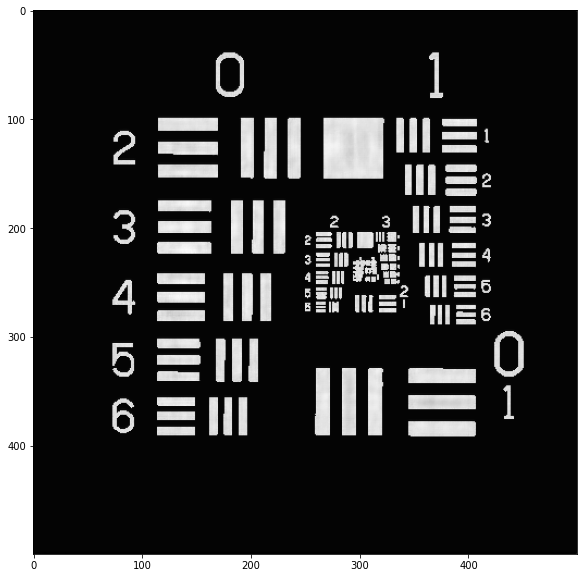

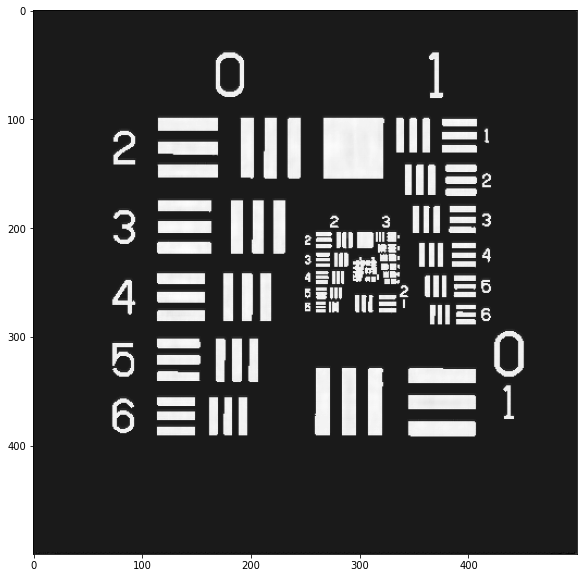

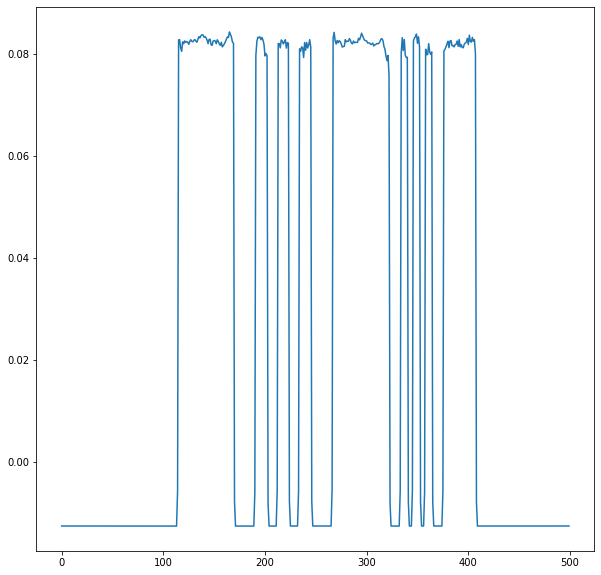

epoch [3100/5000]     PSNR: 26.945601212053063 |  SSIM: 0.7203334871723951 | Phase PSNR: 8.930772302117523
epoch [3200/5000]     Loss: 0.002676747216874023


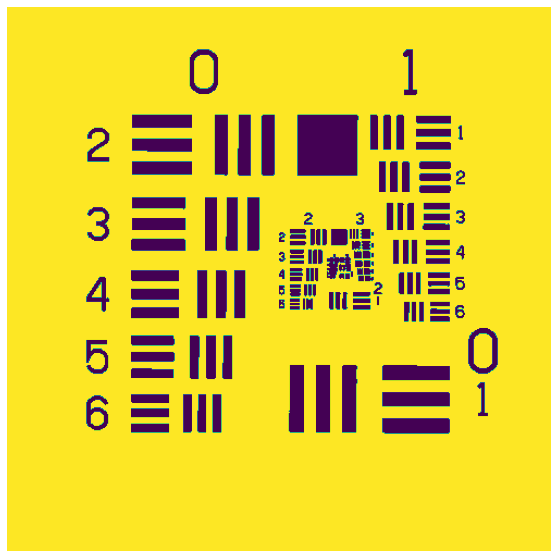

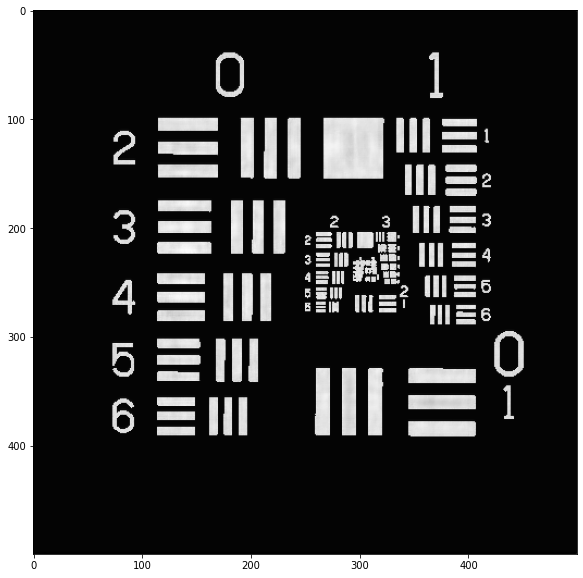

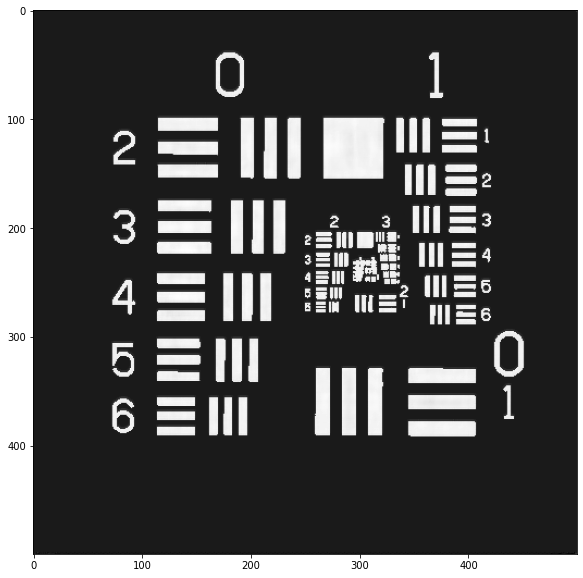

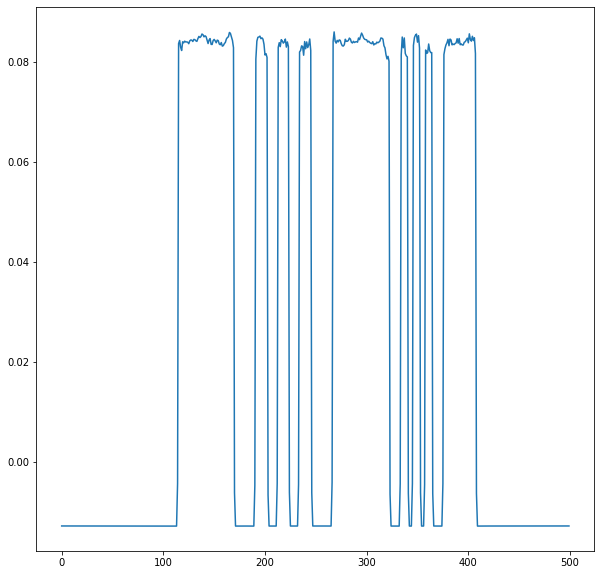

epoch [3200/5000]     PSNR: 26.89647228704892 |  SSIM: 0.7200434436383131 | Phase PSNR: 8.930684986976408
epoch [3300/5000]     Loss: 0.004372974513408518


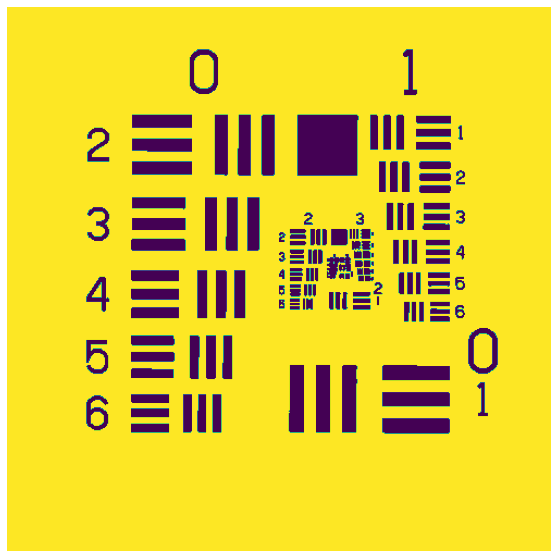

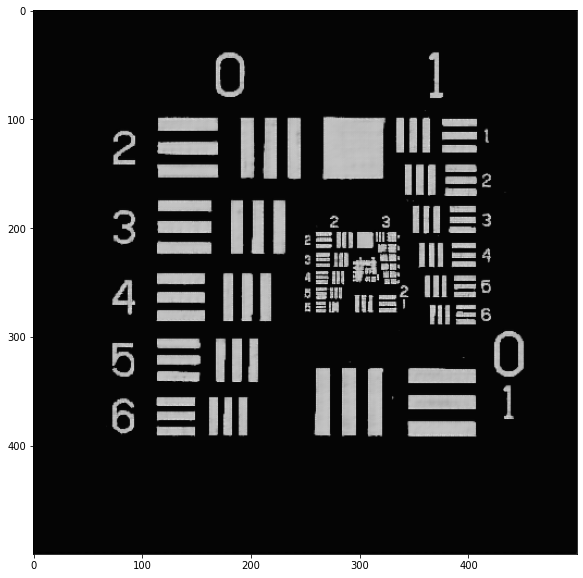

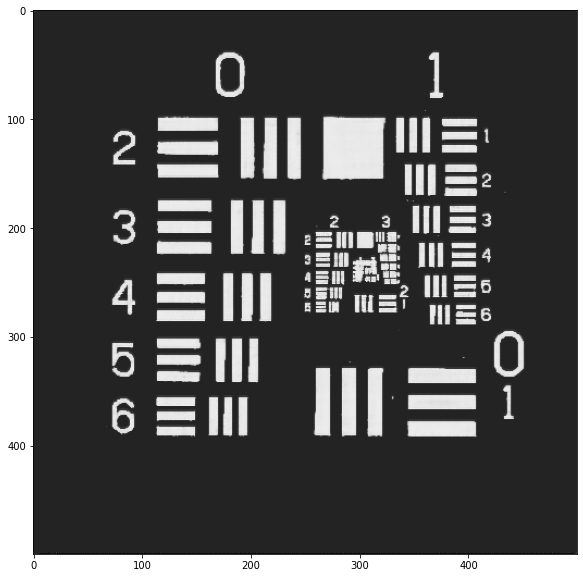

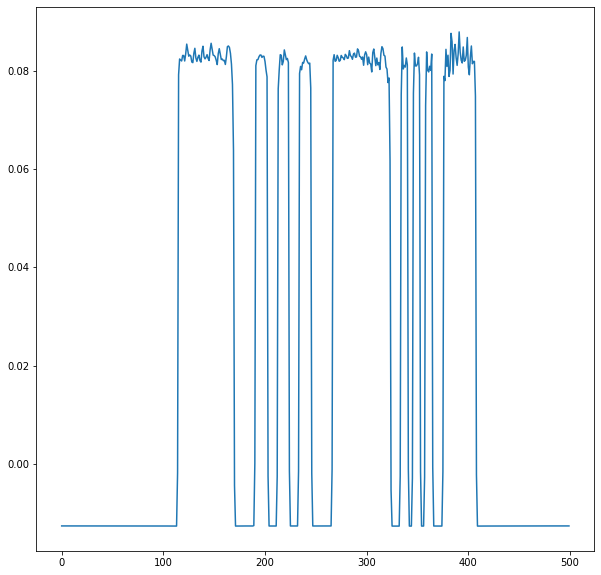

epoch [3300/5000]     PSNR: 20.05849507667164 |  SSIM: 0.6195569381608773 | Phase PSNR: 8.929127997771891
epoch [3400/5000]     Loss: 0.0031922940515772655


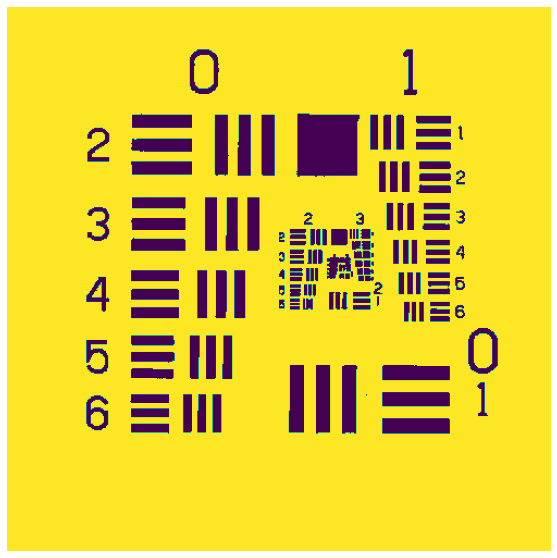

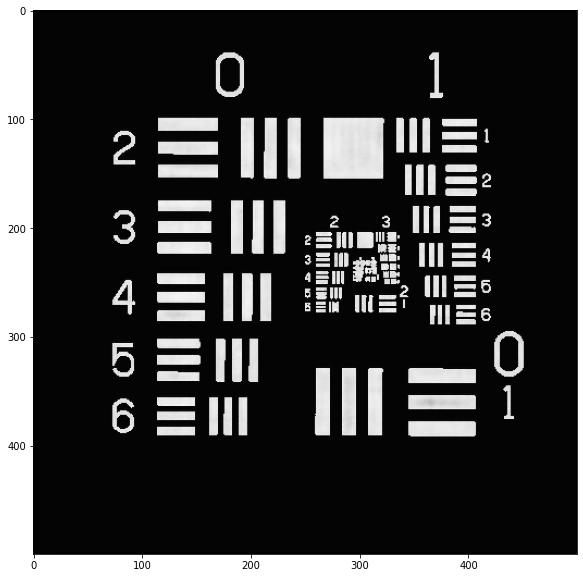

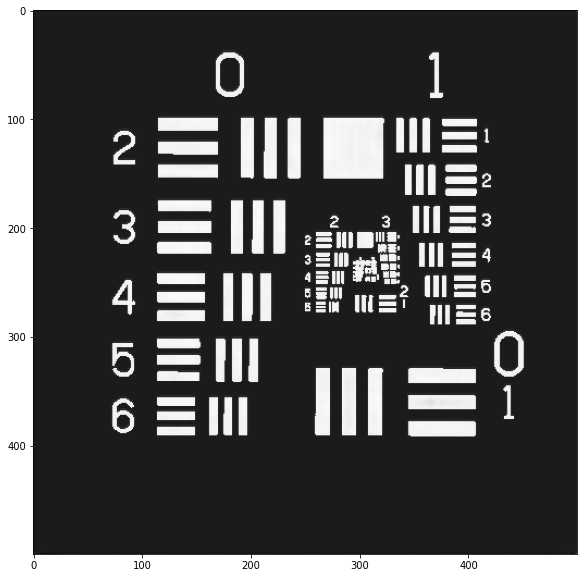

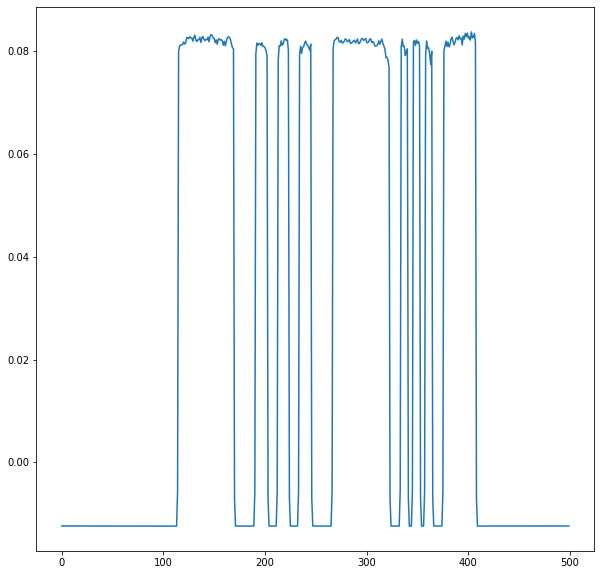

epoch [3400/5000]     PSNR: 28.15862571375204 |  SSIM: 0.72311538588247 | Phase PSNR: 8.931013167479051
epoch [3500/5000]     Loss: 0.002787306997065051


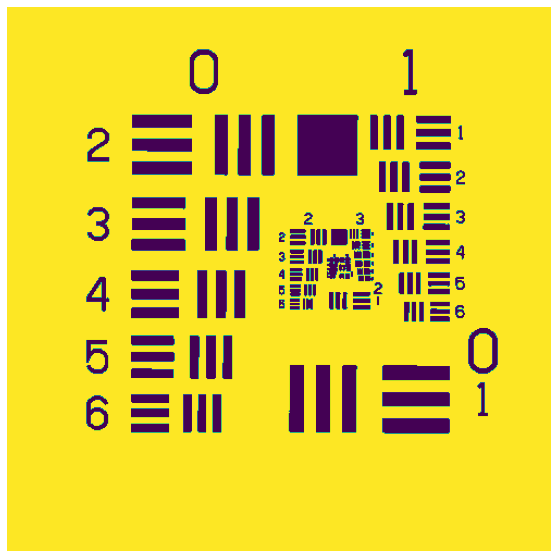

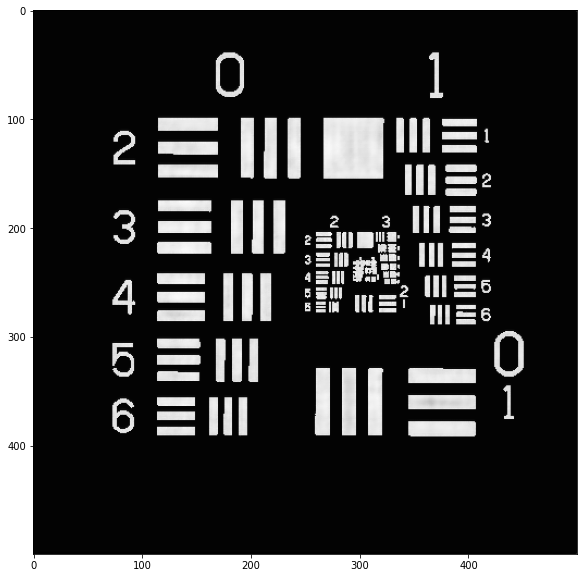

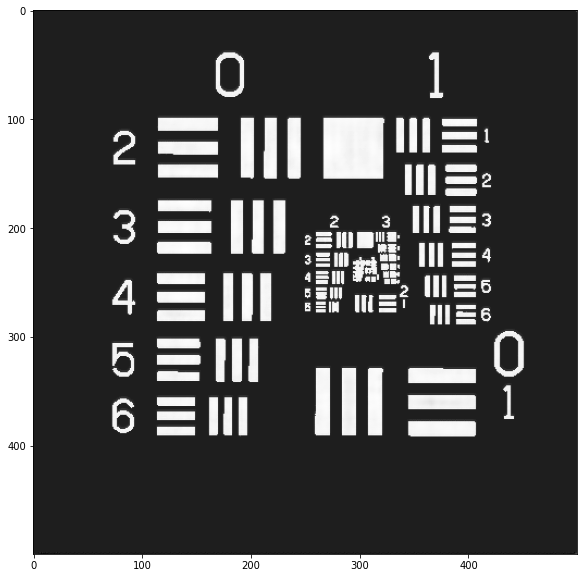

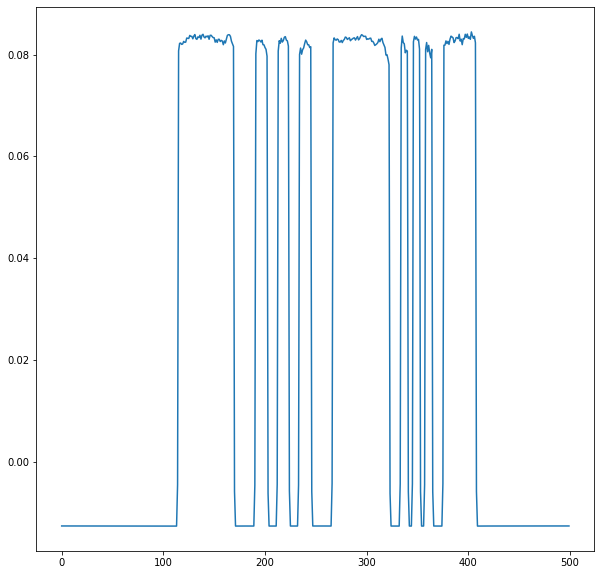

epoch [3500/5000]     PSNR: 28.646900689831906 |  SSIM: 0.8101777700757284 | Phase PSNR: 8.931251799605972
epoch [3600/5000]     Loss: 0.0026694629695682907


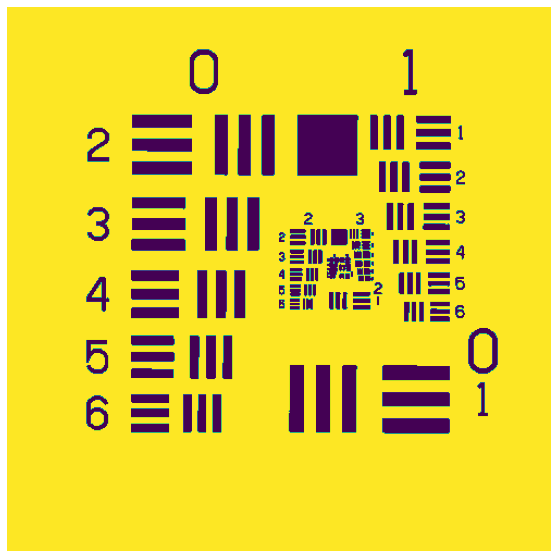

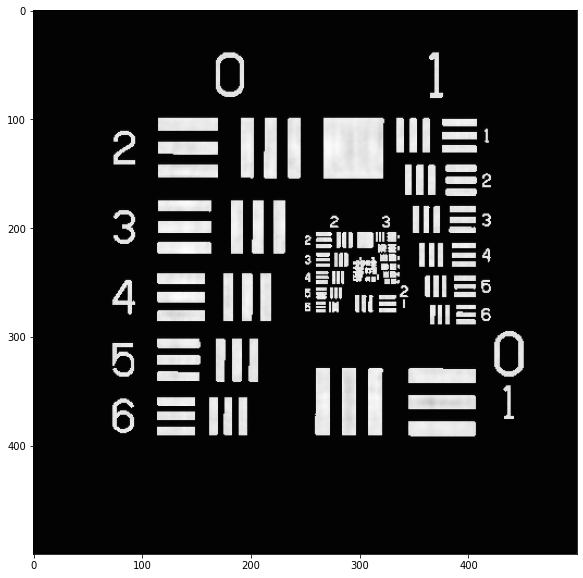

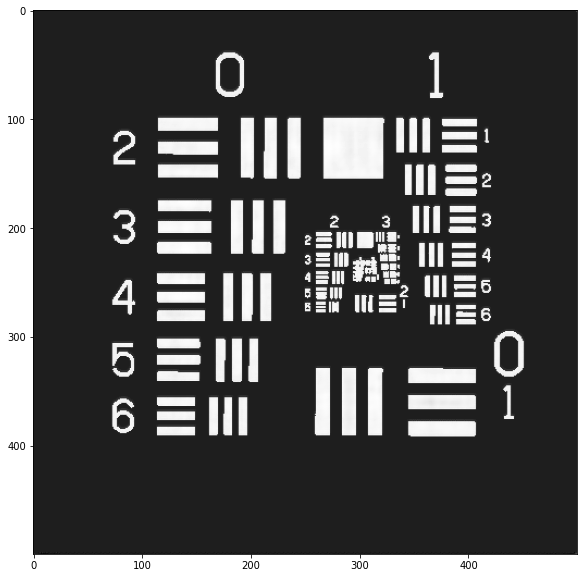

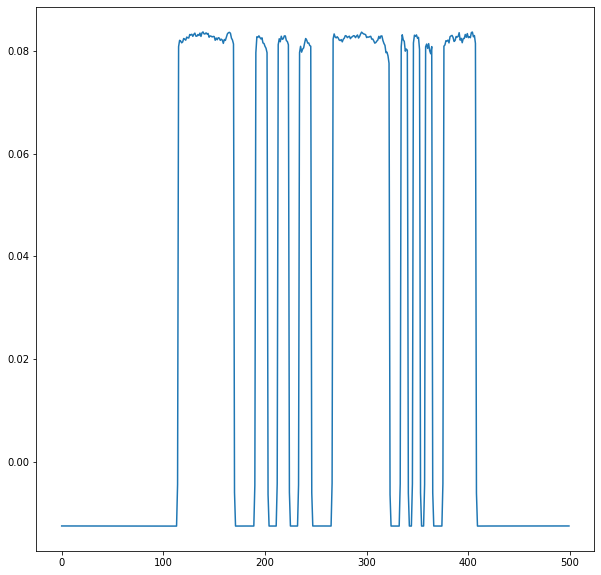

epoch [3600/5000]     PSNR: 29.019452187892327 |  SSIM: 0.8103717456455 | Phase PSNR: 8.931164793364392
epoch [3700/5000]     Loss: 0.0027380021911521317


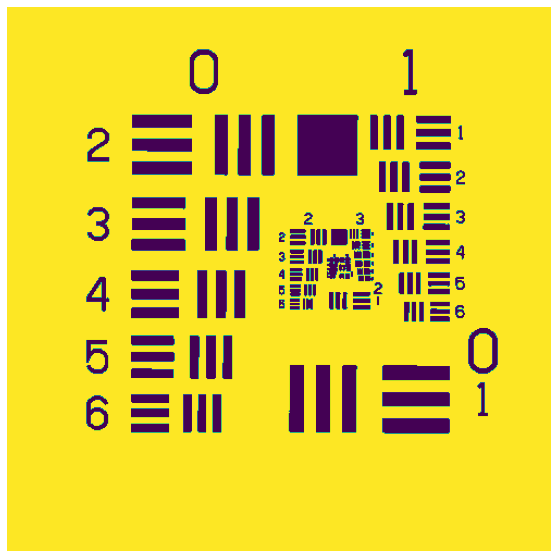

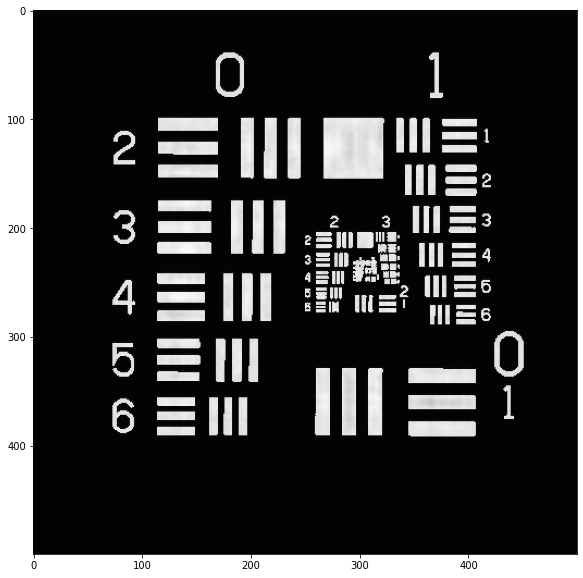

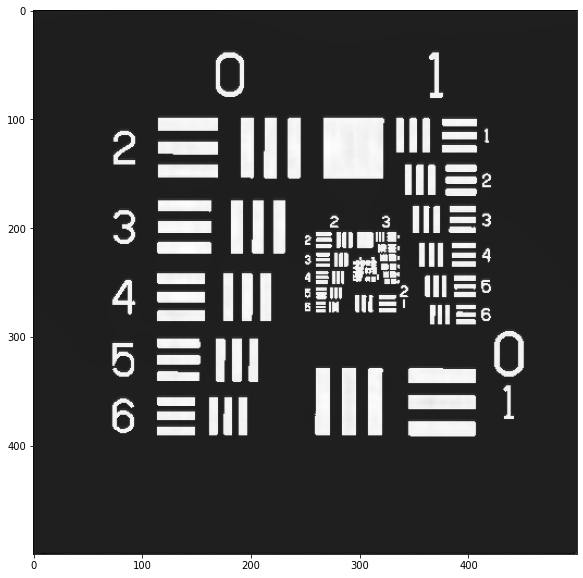

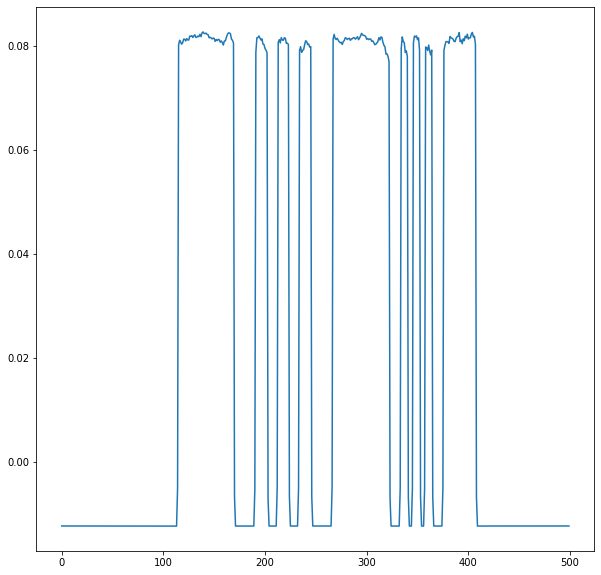

epoch [3700/5000]     PSNR: 28.206273034774725 |  SSIM: 0.8101525084059362 | Phase PSNR: 8.931029492198556
epoch [3800/5000]     Loss: 0.0027917962484114494


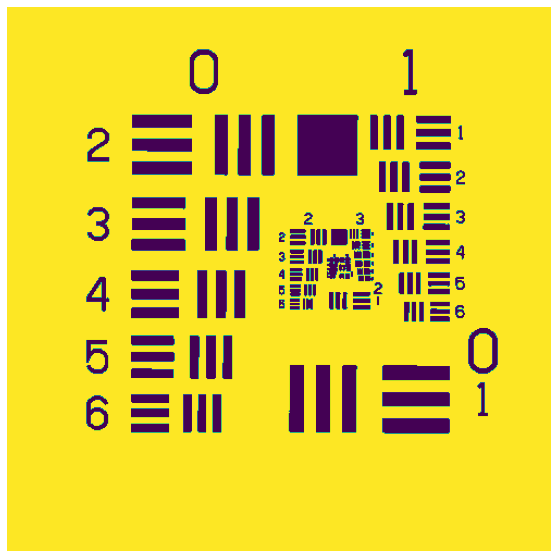

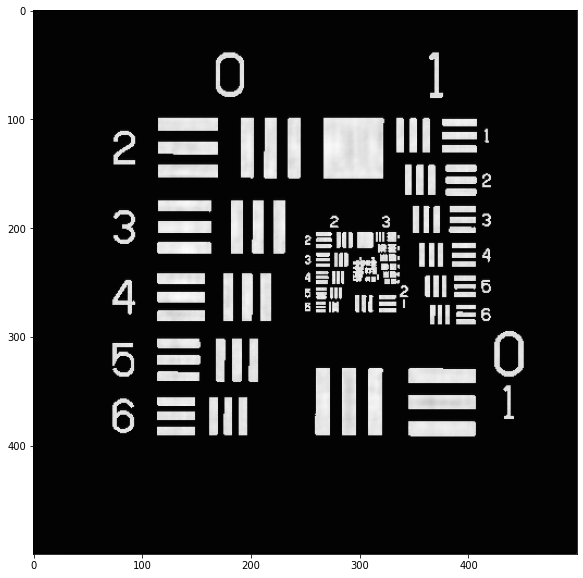

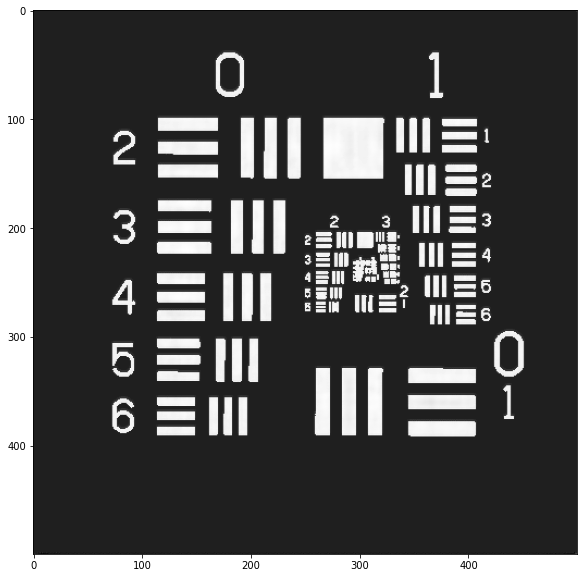

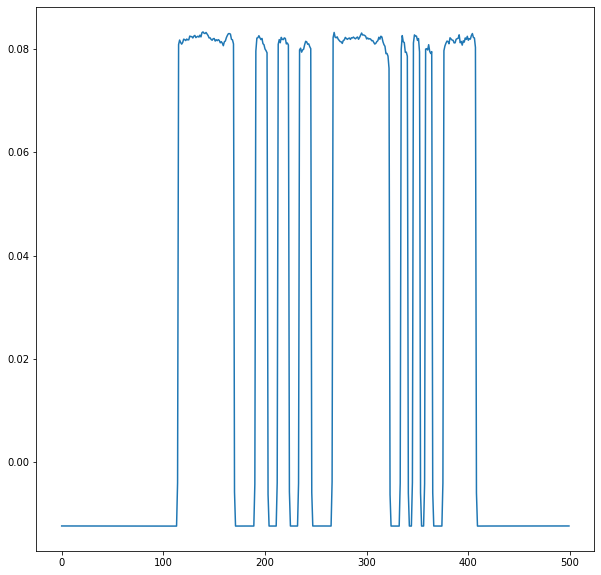

epoch [3800/5000]     PSNR: 28.08613552887277 |  SSIM: 0.8093109164994794 | Phase PSNR: 8.931080725136344
epoch [3900/5000]     Loss: 0.0026738175873787773


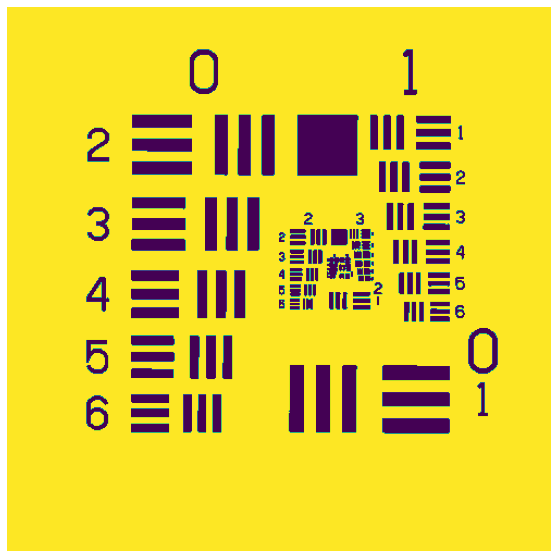

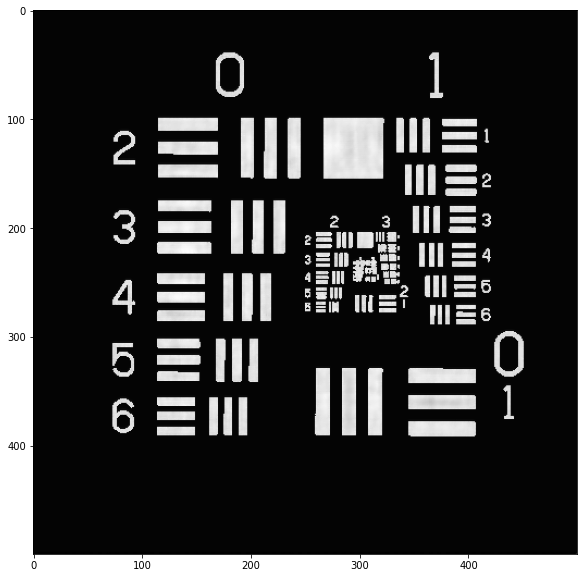

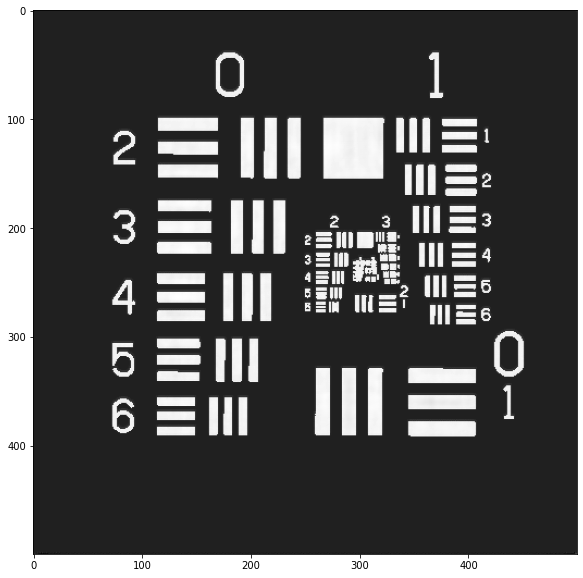

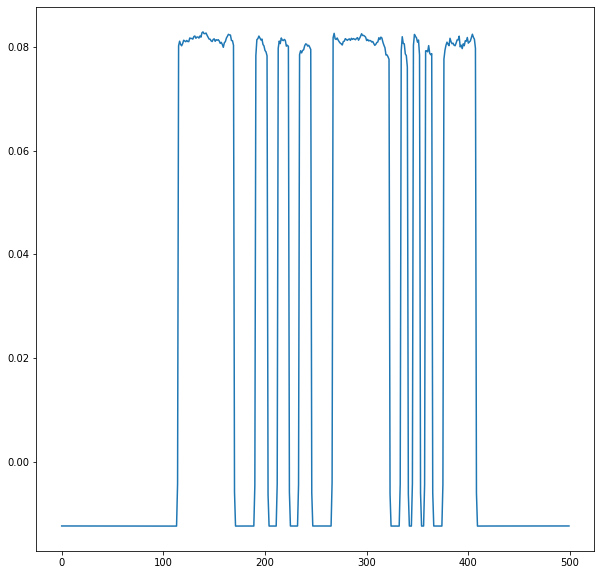

epoch [3900/5000]     PSNR: 27.54531445424186 |  SSIM: 0.7206040816644835 | Phase PSNR: 8.930977258975918
epoch [4000/5000]     Loss: 0.0026956749532796274


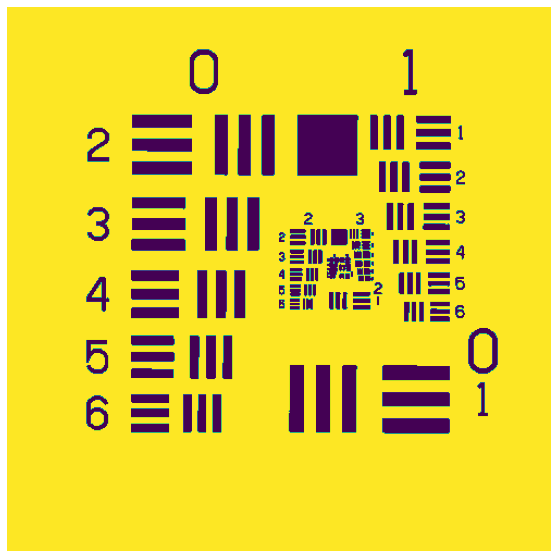

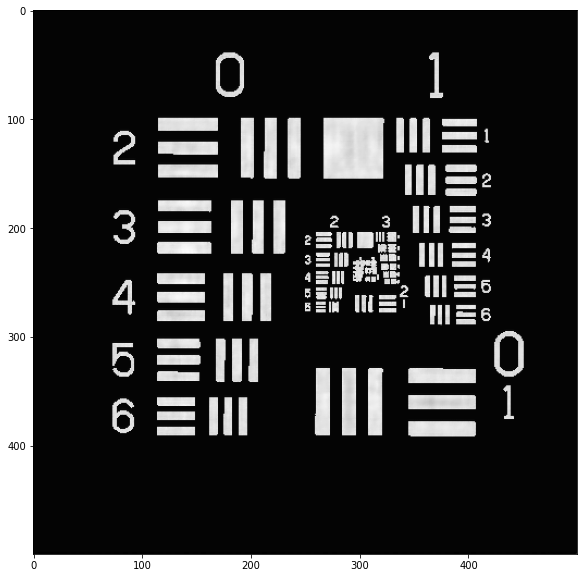

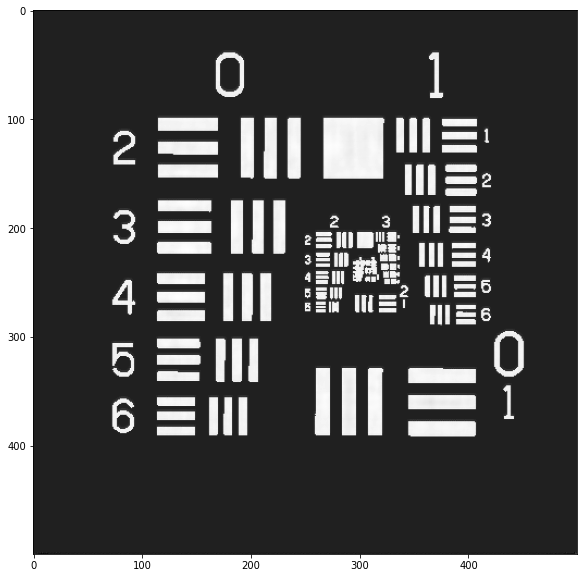

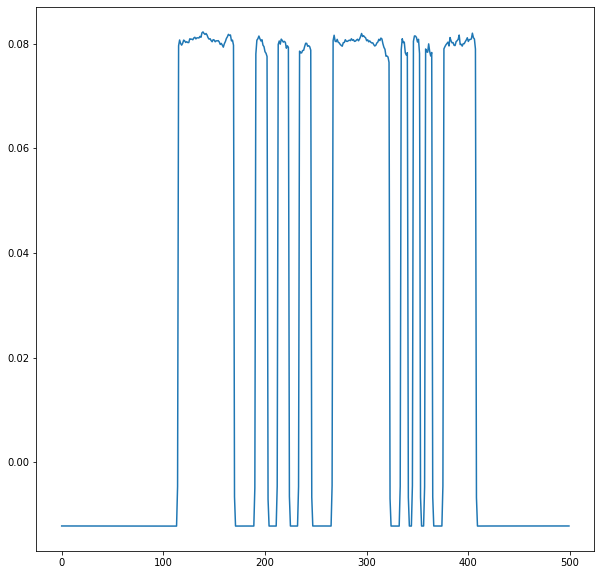

epoch [4000/5000]     PSNR: 27.106057661934486 |  SSIM: 0.7208656809405037 | Phase PSNR: 8.930953630306366
epoch [4100/5000]     Loss: 0.0037707395663428215


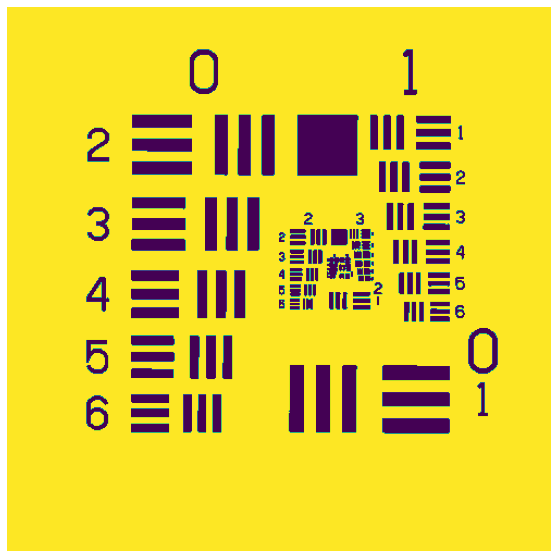

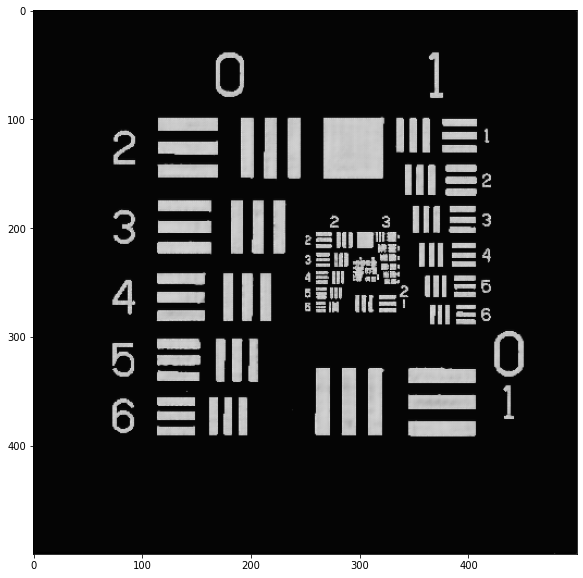

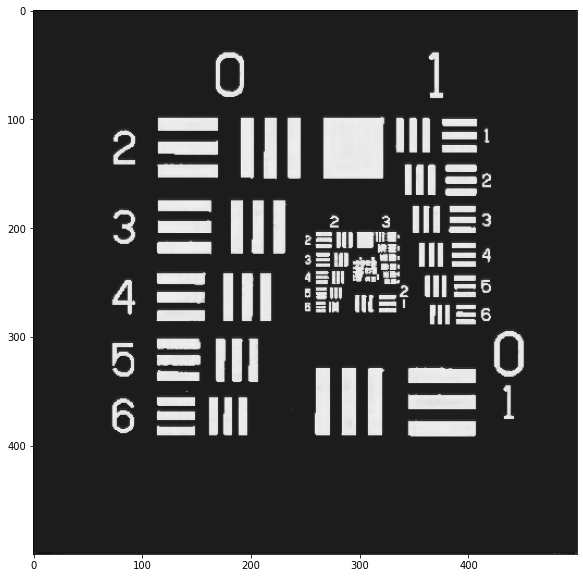

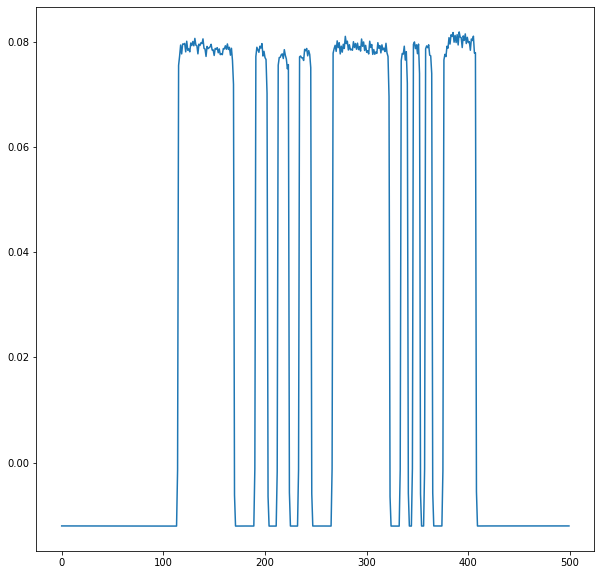

epoch [4100/5000]     PSNR: 21.423381813390264 |  SSIM: 0.6276452482357352 | Phase PSNR: 8.929391468142665
epoch [4200/5000]     Loss: 0.002644531096799742


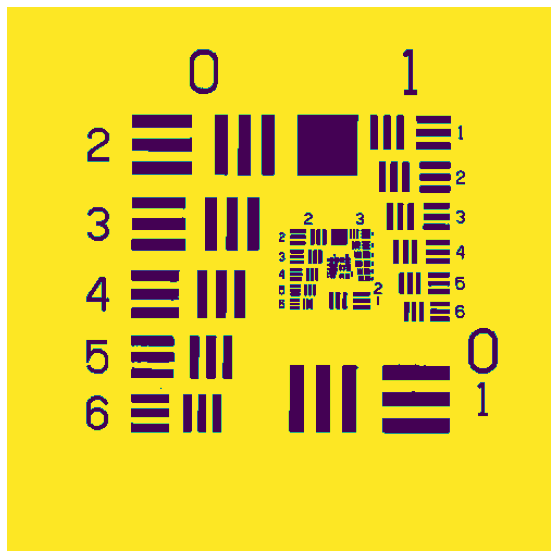

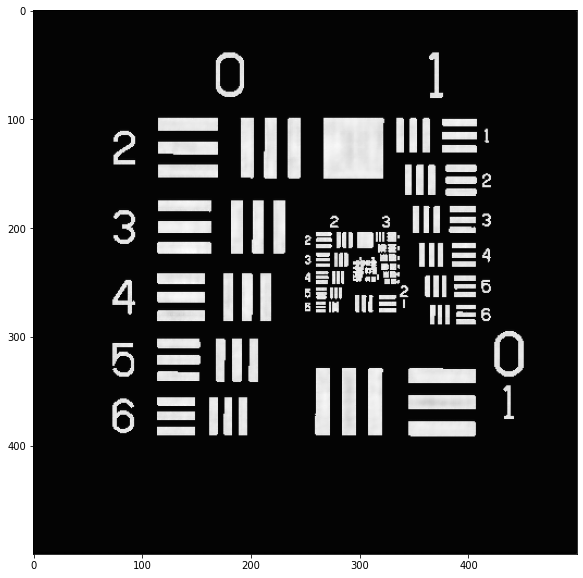

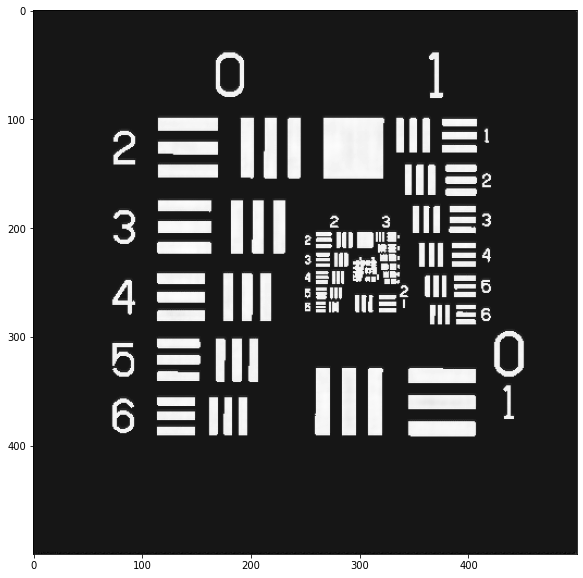

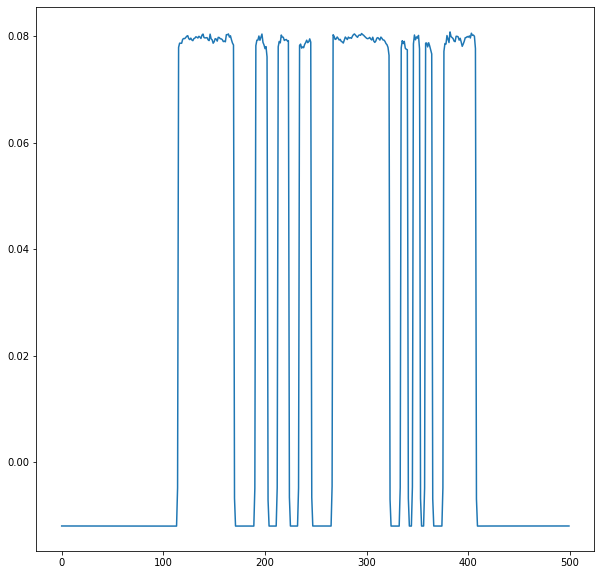

epoch [4200/5000]     PSNR: 28.728391225609407 |  SSIM: 0.7225722437255473 | Phase PSNR: 8.931059987996942
epoch [4300/5000]     Loss: 0.002604619656640046


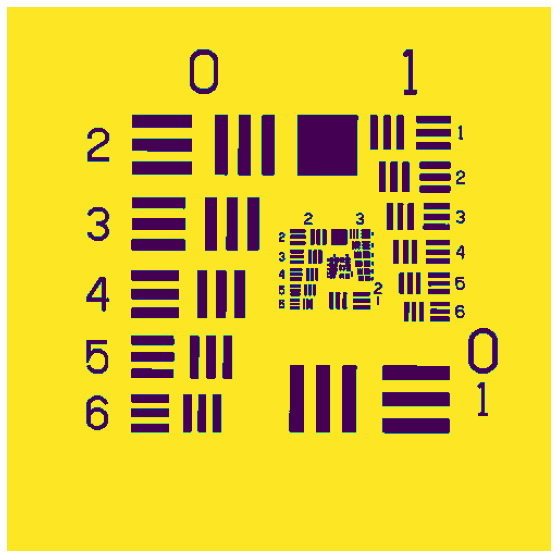

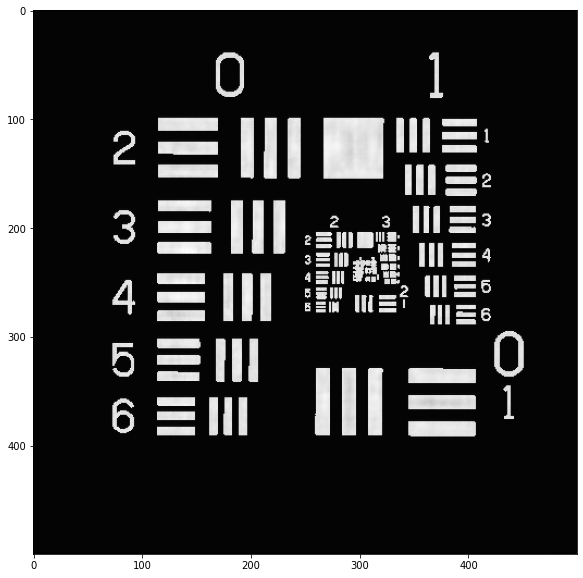

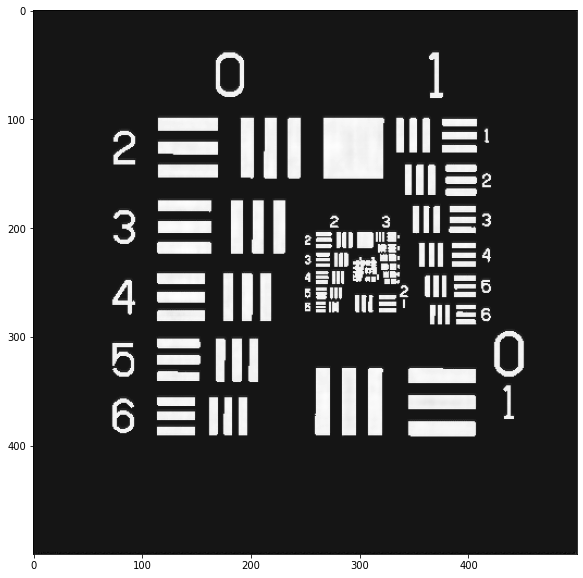

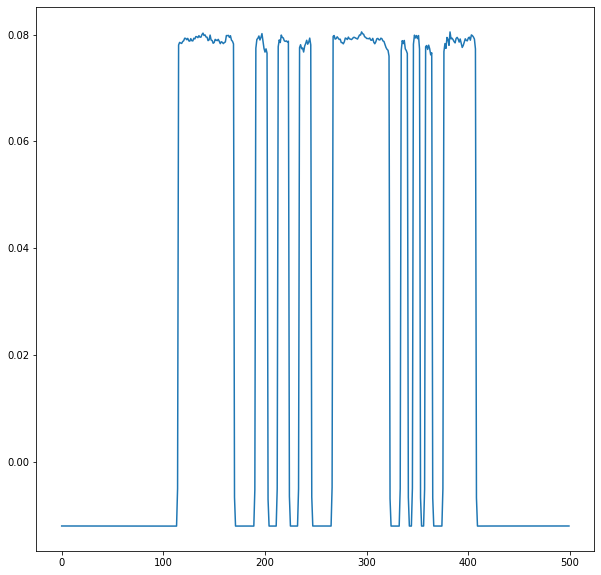

epoch [4300/5000]     PSNR: 27.767774364031688 |  SSIM: 0.7214581096568785 | Phase PSNR: 8.930990248034945
epoch [4400/5000]     Loss: 0.0025841740668994576


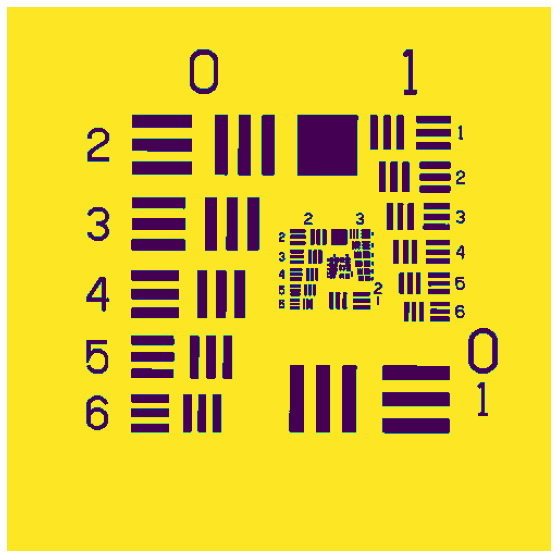

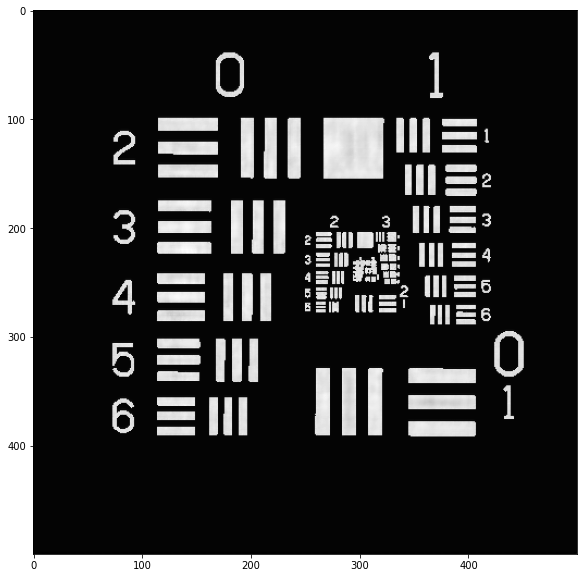

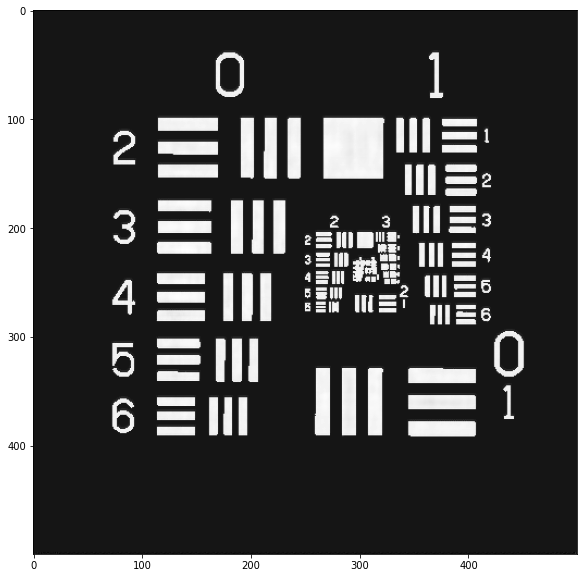

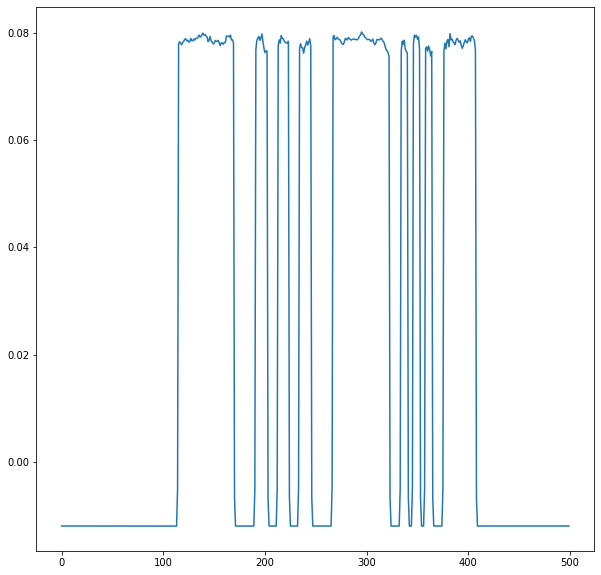

epoch [4400/5000]     PSNR: 27.45162760655132 |  SSIM: 0.7207830568993008 | Phase PSNR: 8.930836485207148
epoch [4500/5000]     Loss: 0.0026051931524344366


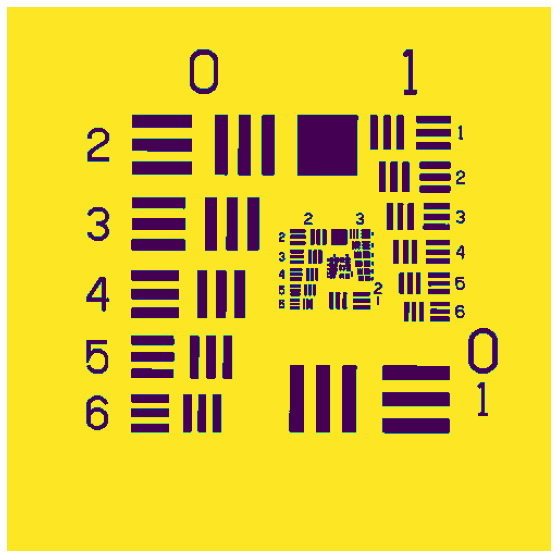

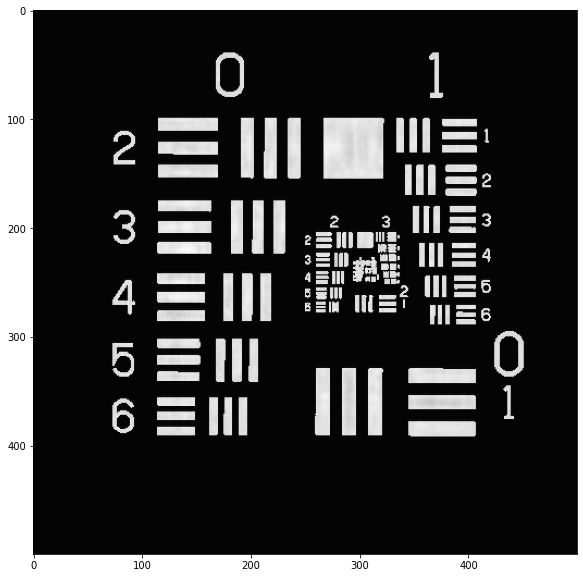

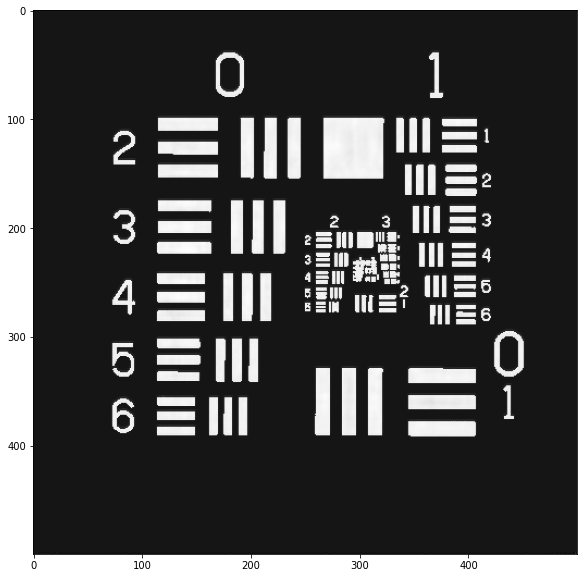

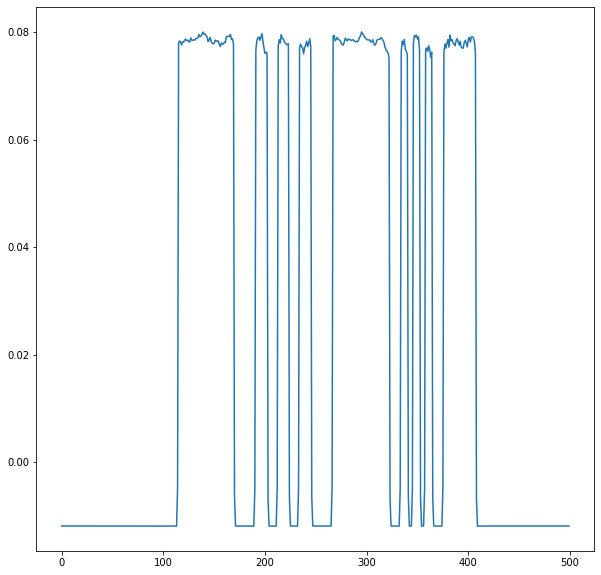

epoch [4500/5000]     PSNR: 26.909373321806914 |  SSIM: 0.7202444618622345 | Phase PSNR: 8.930681485064841
epoch [4600/5000]     Loss: 0.0025617014657712584


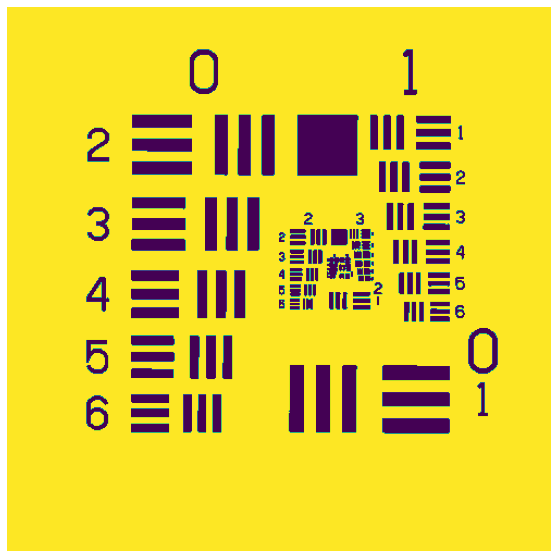

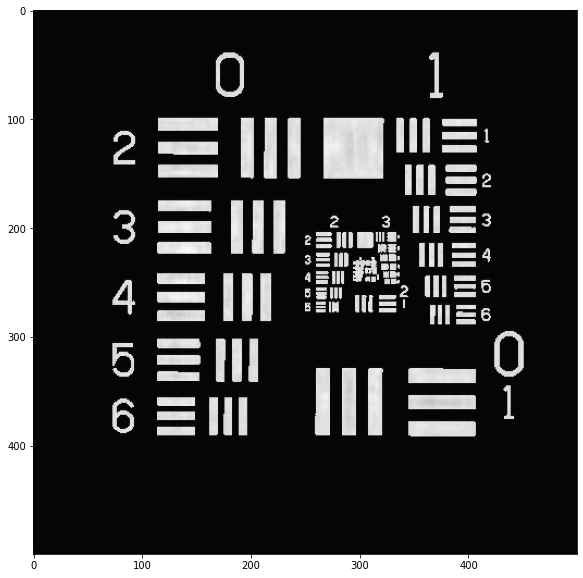

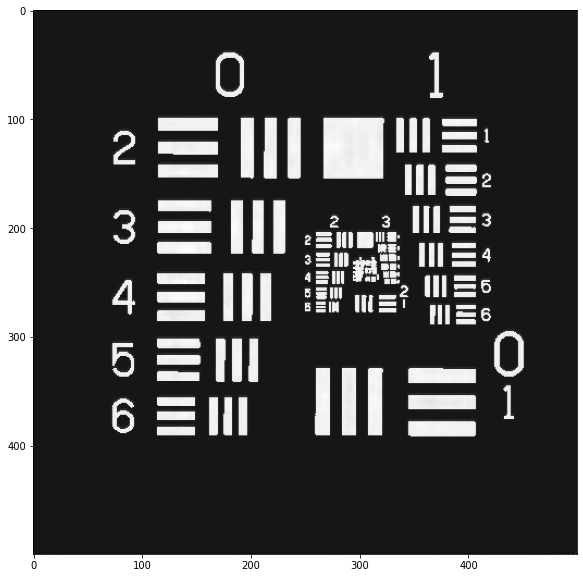

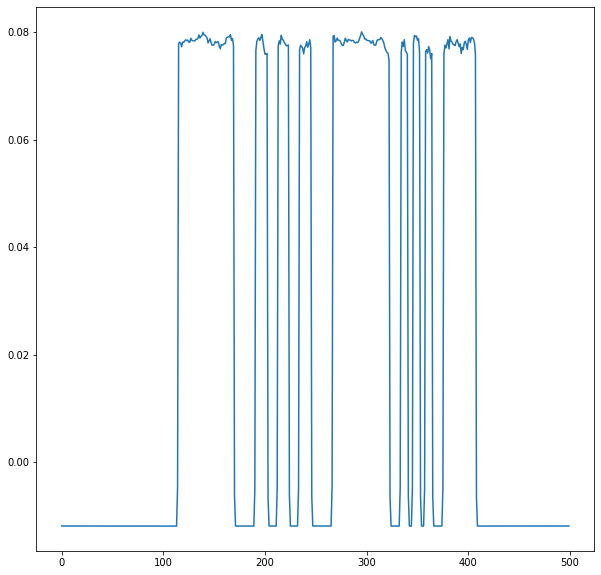

epoch [4600/5000]     PSNR: 26.31706396220371 |  SSIM: 0.6408924967597714 | Phase PSNR: 8.930616394432635
epoch [4700/5000]     Loss: 0.002592354364118048


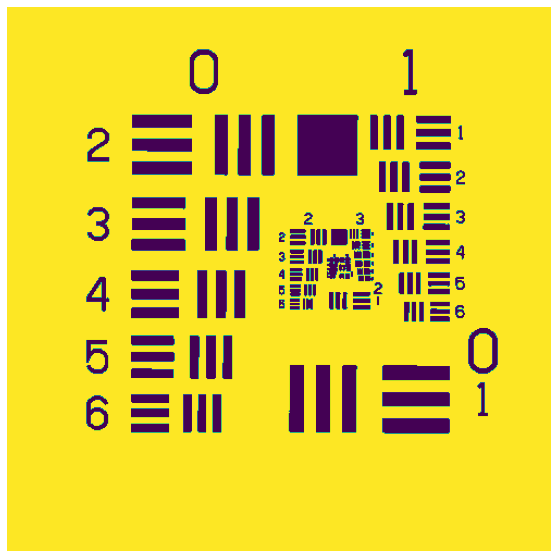

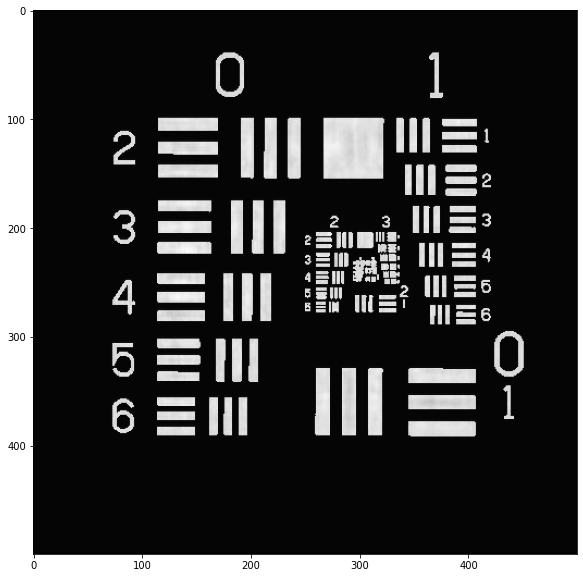

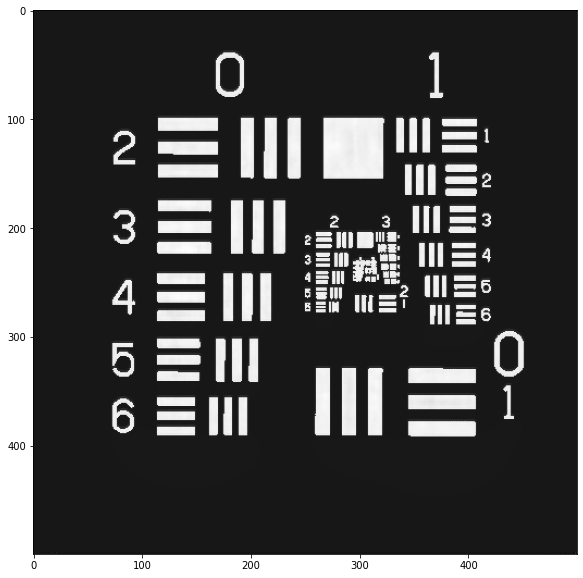

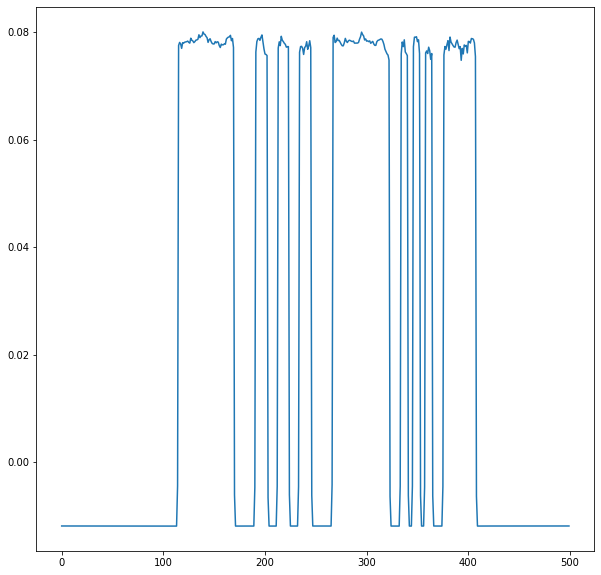

epoch [4700/5000]     PSNR: 26.245102096202125 |  SSIM: 0.6407004176364027 | Phase PSNR: 8.9305256246105
epoch [4800/5000]     Loss: 0.0026671434856669046


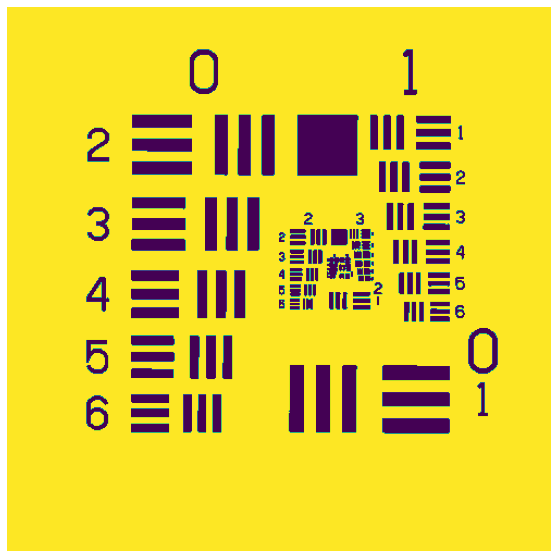

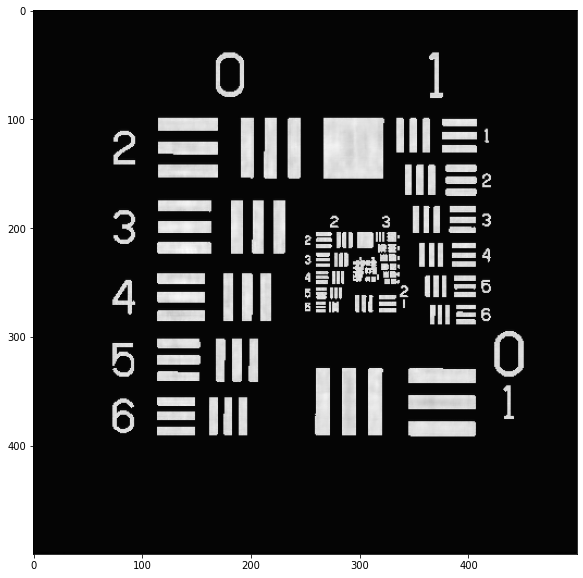

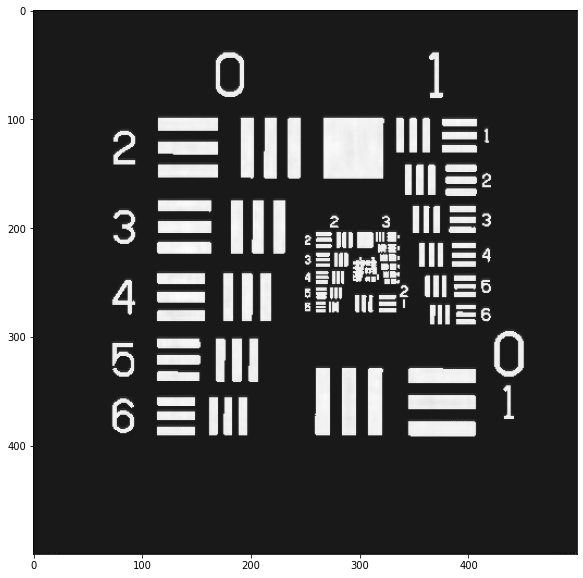

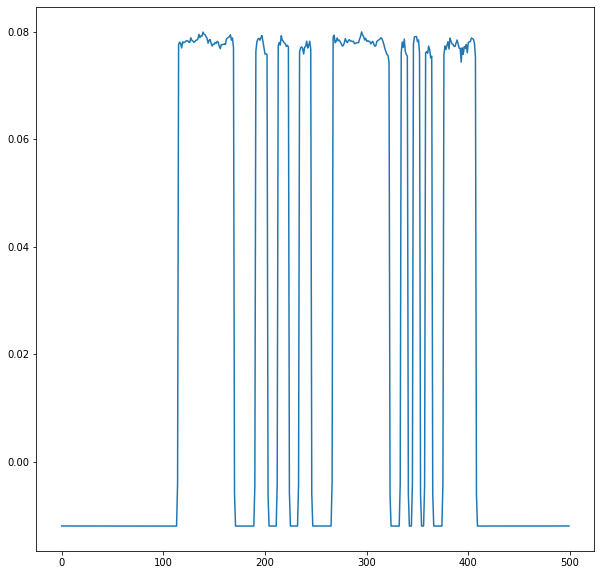

epoch [4800/5000]     PSNR: 26.020715646536896 |  SSIM: 0.6401953984302928 | Phase PSNR: 8.930508188279871
epoch [4900/5000]     Loss: 0.0025688082054670784


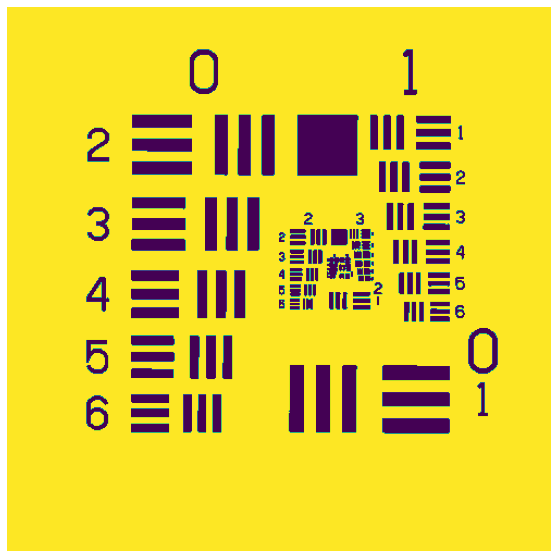

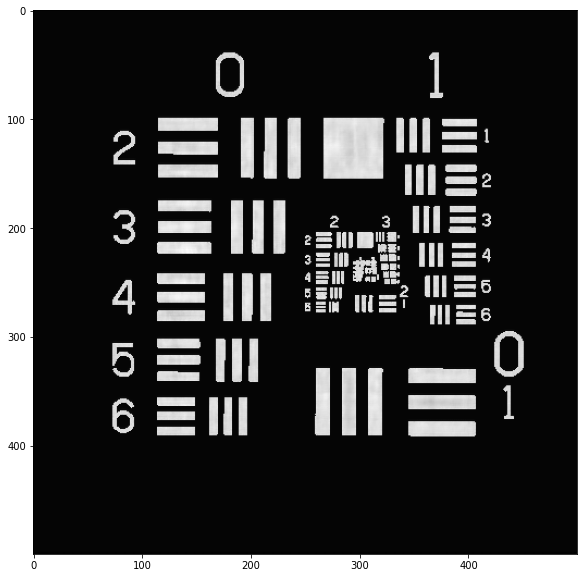

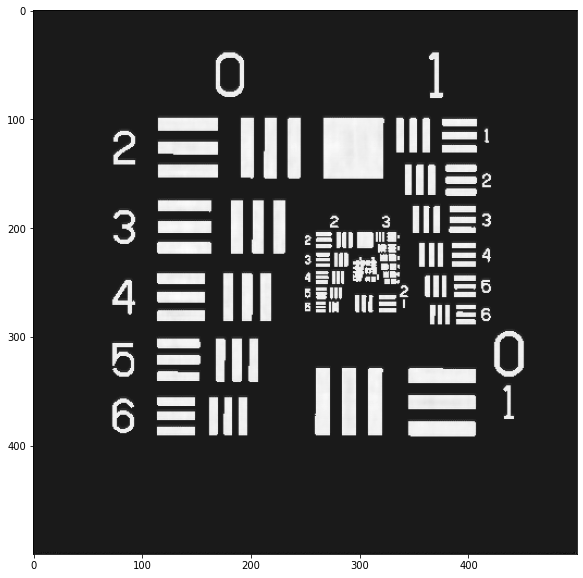

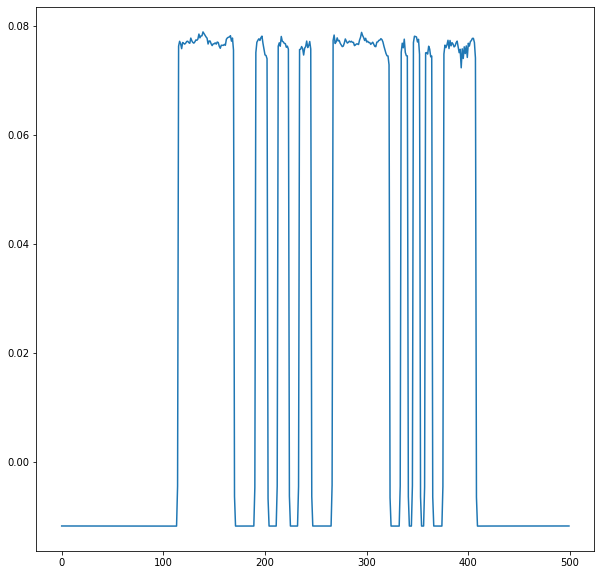

epoch [4900/5000]     PSNR: 25.899140376670626 |  SSIM: 0.6402262699823913 | Phase PSNR: 8.930456936168124
epoch [5000/5000]     Loss: 0.002575148891541696


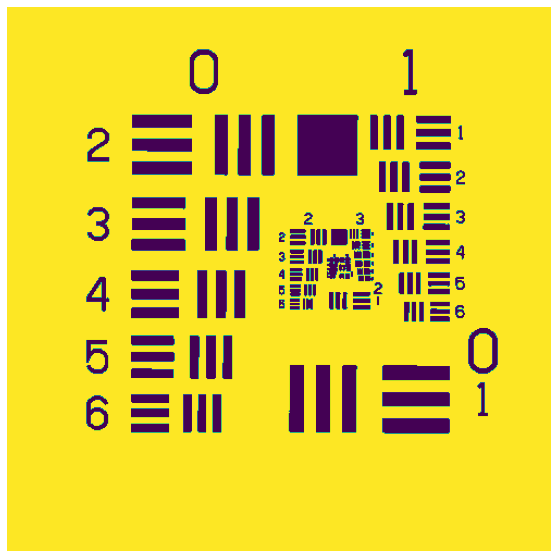

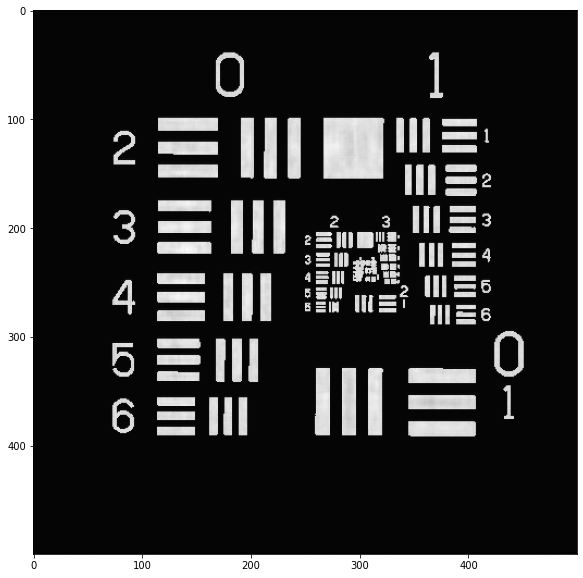

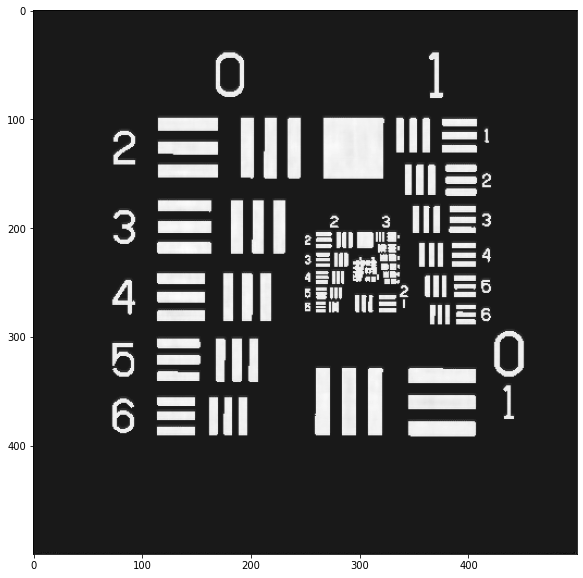

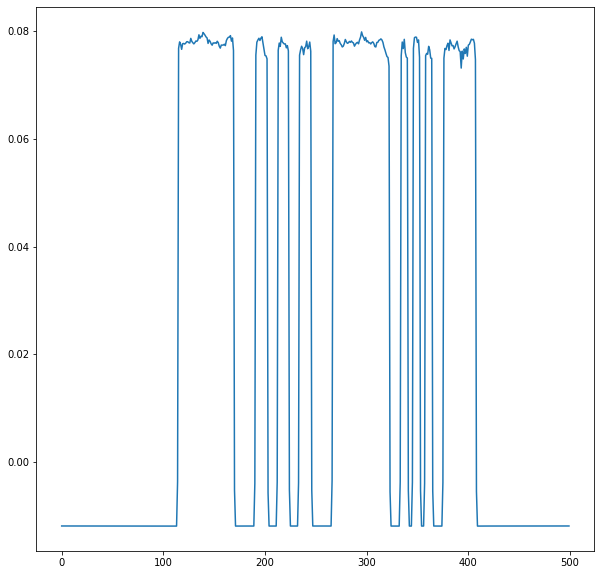

epoch [5000/5000]     PSNR: 25.874362741200166 |  SSIM: 0.6398867079401486 | Phase PSNR: 8.930428711565218


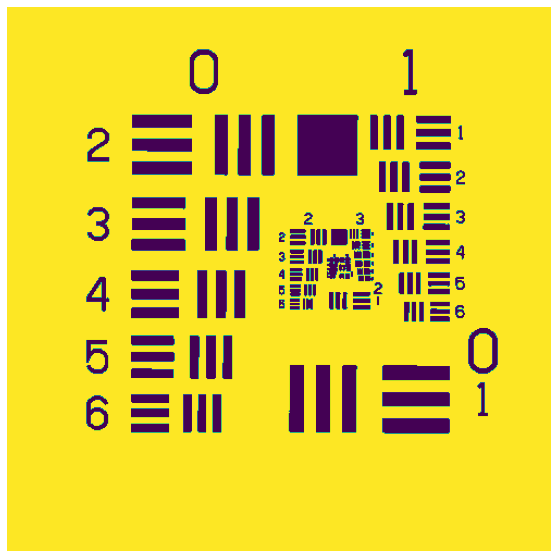

In [29]:
t0 = 12#1e-2 # initial simulated annealing

# temp_mask = mask #set mask as numpy and used to update the mask

pil2tensor = transforms.ToTensor()
tensor2pil = transforms.ToPILImage()

# mask =  torch.tensor(mask).to(device)
mask = torch.ones(img.shape).to(device)



D_loss = []
G_loss = []
A_loss = []
PSNR_list = []
SSIM_list = []
Temp_amp = []
Temp_phase = []
Mask_list = []

t_begin = time.time()
for i in range(epoch):
    
    #optimizer.zero_grad()
    batch_size =1
    #print(batch_size)
    real_labels = (0.2*torch.ones(batch_size, 1)+0.8).to(device)  
    fake_labels = torch.zeros(batch_size, 1).to(device)-real_labels # 
    #out = model(eta) 
    j=0
    while (j <period_train): 
        j = j+1
    #for j in range(period_train):
        
        ## train D per k epoch
    ## Train D
    # real loss: BCE_Loss(x, y): - y * log(D(x)) 
        outputs = D(holo[:,0,:,:].unsqueeze(1))
        
        #print(outputs)
        d_loss_real = criterion_2(outputs, real_labels) #bce(pred_real,true_label)
        #print(d_loss_real)
        real_score = outputs
        

        # fake loss: - (1-y) * log(1 - D(x))
        fake_images = G(eta)
        outputs = D(forward_propogate(fake_images))
        d_loss_fake = criterion_2(outputs, fake_labels) #bce(pred_fake,true_fake)
        fake_score = outputs

        # Back propgate
        d_loss = d_loss_real + d_loss_fake#-10*criterion(fake_images, holo) 
        # print(d_loss_real)
        # print(d_loss_fake)
        optimizer_D.zero_grad()
        optimizer_G.zero_grad()
        d_loss.backward()
        optimizer_D.step()

    D_loss.append(d_loss.cpu().data.numpy())
        
    ## Train G : maximize log(D(G(z))
    
    fake_images = G(eta)
    out = fake_images
    outputs = D(forward_propogate(out))  #  the generated holo from fake image
    #print(criterion_2(outputs, real_labels))
    if i >101:
        auto_loss = criterion(fake_images,holo,mask,mylamda) 
    else:
        auto_loss = criterion(fake_images,holo,mask,0) 
    g_loss = criterion_2(outputs, real_labels)+10*auto_loss  #bce_loss(pred_fake, true_labels)
    A_loss.append(criterion(fake_images,holo,mask,0).cpu().data.numpy())
    # print(g_loss)
    G_loss.append(g_loss.cpu().data.numpy())
    
    # back propgate
    optimizer_D.zero_grad()
    optimizer_G.zero_grad()

    g_loss.backward()
    optimizer_G.step()
    
    
   
    
#     mask_tensor = torch.zeros((eta.size())).to(device)
    
#     mask_tensor[0,0,:,:] = mask.clone().detach()
#     mask_tensor[0,1,:,:] = mask.clone().detach()
#     eta = (torch.mul(eta,mask_tensor)*0.5 + torch.mul(eta,-(mask_tensor-1))).to(device)
    
#     loss = criterion(out, holo) 
#     loss.backward()
#     optimizer.step()
#     out = model(eta) 
    
    
    
    #print('epoch [{}/{}]     Loss: {}'.format(i+1, epoch, loss.cpu().data.numpy()))
    if ((i+1) % period) == 0:
          
        
        print('epoch [{}/{}]     Loss: {}'.format(i+1, epoch, auto_loss.cpu().data.numpy()))
        outtemp = out.cpu().data.squeeze(0)
        outtemp = outtemp
        plotout = torch.sqrt(outtemp[0,:,:]**2 + outtemp[1,:,:]**2)
        plotout = (plotout - torch.min(plotout))/(torch.max(plotout)-torch.min(plotout))
        
        
        Temp_amp.append(tensor2pil(plotout))
        
        PSNR_list.append(compare_psnr(ground_truth,np.array(tensor2pil(plotout))/255.))
        SSIM_list.append(compare_ssim(ground_truth,np.array(tensor2pil(plotout))/255.))
        
        
        
        
        plotout_p = outtemp.numpy()
#         print('phase scale')
#         print(plotout_p[0,100,:10])
#         print(plotout_p[1,100,:10])
        
        plotout_p = np.arctan2(plotout_p[0,:,:], plotout_p[1,:,:])
#         print(plotout_p[100,:10])
        plotout_p = Phase_unwrapping(plotout_p)
    
    
        plt.figure(figsize=(10,10))
        plt.imshow(tensor2pil(plotout), cmap='gray')
        plt.show()
        
        
        plt.figure(figsize=(10,10))
        plt.imshow((plotout_p), cmap='gray')
        plt.show()
        
#         print(plotout_p[100,:10])
        #print(np.min(plotout_p))
        plt.figure(figsize=(10,10))
        plt.plot((plotout_p[100,:]))
        plt.show()
        plotout_p = (plotout_p - np.min(plotout_p))/(np.max(plotout_p)-np.min(plotout_p))
        print('epoch [{}/{}]     PSNR: {} |  SSIM: {} | Phase PSNR: {}'.format(i+1, epoch, compare_psnr(ground_truth,np.array(tensor2pil(plotout))/255.),compare_ssim(ground_truth,np.array(tensor2pil(plotout))/255.),compare_psnr(ground_truth,np.array(plotout_p)/255.)))
        
        
        Temp_phase.append(plotout_p)
        
        
        
        mask_tensor = torch.zeros((out.size())).to(device)
        
        mask_tensor[0,0,:,:] = mask
        mask_tensor[0,1,:,:] = mask

        x_mask = torch.mul(out,mask_tensor)*0 + torch.mul(out,(1-mask_tensor)) #make background to zero ->holo
        current_mask_loss = criterion(x_mask,holo,mask,0) 
        
        mask_new = seg(plotout)
#         plt.figure(figsize=(10,10))
#         plt.imshow(mask_new)
#         mask_new_2,prob = seg_gmm(plotout)
#         plt.figure(figsize=(10,10))
#         plt.imshow(mask_new_2)
        
        
        
        mask_new = torch.tensor(mask_new).to(device)
        
        mask_new_tensor = torch.zeros((out.size())).to(device)
        
        mask_new_tensor[0,0,:,:] = mask_new
        mask_new_tensor[0,0,:,:] = mask_new
        
        x_mask_new = torch.mul(out,mask_new_tensor)*0 + torch.mul(out,(1-mask_new_tensor))
        new_mask_loss = criterion(x_mask_new,holo,mask,0) 
        
        
        
        '''
        simulated annealing
        '''
        delta_t = new_mask_loss - current_mask_loss
        if delta_t<0:
            mask = mask_new
            Mask_list.append(mask.cpu().data)
           
        else:
          
            
            p = torch.exp(-delta_t/t0)
            if torch.rand(1).to(device)<p:
                mask = mask_new
                Mask_list.append(mask.cpu().data)
              
            else:
                pass
                
        t0 = t0 / np.log(1 + i)
        
        
        
        
        
         
        
        
        plt.figure(figsize=(10,10))
        
        plt.imshow(mask.cpu().data)
        plt.axis('off')
        
#         holo_mask= generate_holo(np.multiply(plotout, temp_mask)*0+ np.multiply(plotout, 1-temp_mask))
#         current_loss = np.mean((hologram-holo_mask)**2)
        #compute current loss to the caputred hologram
        
        
        
t_end = time.time()        
        
        
        

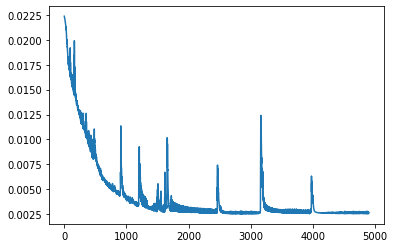

In [30]:
plt.plot(A_loss[100:])

In [31]:
# max(PSNR_list)

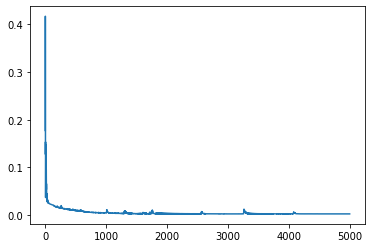

In [32]:
plt.plot(A_loss)

In [33]:
min(A_loss)

array(0.002511)

## Get the best results

In [34]:
max_index = np.argsort(PSNR_list)[-20:]
for index in max_index:
    
    imsave(out_dir+'rec_amp_'+str(PSNR_list[index])+'_'+str(index)+'.bmp',np.uint8(np.squeeze(Temp_amp[index])*255))
    imsave(out_dir+'rec_phase_'+str(PSNR_list[index])+'_'+str(index)+'.bmp',np.uint8(np.squeeze(Temp_phase[index])*255))

    strcontent=str(z)+'_'+str(wavelength)+ ' PSNR:'+str(PSNR_list[index])+'   SSIM:'+str(SSIM_list[index]) +'    index:'+str(index)

    with open("gan_eval.txt",'a') as f:
        f.write(strcontent)
        f.write('\n')
# with open("gan_eval.txt",'a') as f:       
#     f.write(f'runtime: {t_begin-t_end}')
#     f.write('\n')

In [35]:
max_index = PSNR_list.index(max(PSNR_list))# [:40]""

In [36]:
index = max_index 

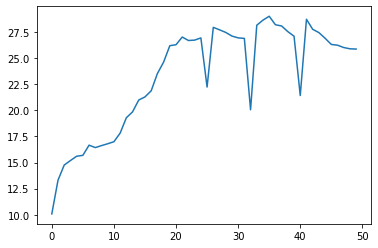

In [37]:
plt.plot(PSNR_list)

In [38]:
PSNR_list[max_index]

29.019452187892327

In [39]:
str(mylamda)

'0.001'

In [40]:
out_dir

'output/'

In [41]:

index = max_index
img_save = np.array((Temp_amp[index]))/255.
imsave(out_dir+'rec_gan_'+str(z)+'_'+str(wavelength)+'_'+str(PSNR_list[max_index])+'_'+str(period_train)+'_'+str(mylamda)+'_'+format_time+'.bmp',np.uint8(np.squeeze(img_save)*255))
imsave(out_dir+'rec_phase_gan_'+str(z)+'_'+str(wavelength)+'_'+str(PSNR_list[max_index])+str(period_train)+'_'+str(mylamda)+'_'+format_time+'.bmp',np.uint8(np.squeeze(Temp_phase[index])*255))
imsave(out_dir+'holo_'+str(z)+'_'+str(wavelength)+'.bmp',np.squeeze(hologram))
imsave(out_dir+'bp_'+str(z)+'_'+str(wavelength)+'.bmp',np.squeeze(np.abs(bp)))


Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


In [42]:
# strcontent = str(format_time)+'_'+str(mylamda)+ ' PSNR:'+str(PSNR_list[max_index])+'   SSIM:'+str(SSIM_list[max_index])+ 'flat'+str(flat)
# f = open("gan_eval.txt",'a+')
# f.write(strcontent)
# f.write('\n')
# f.write(f'runtime:{t_begin-t_end}')
# f.write('\n')
# f.close()

(-0.5, 499.5, 499.5, -0.5)

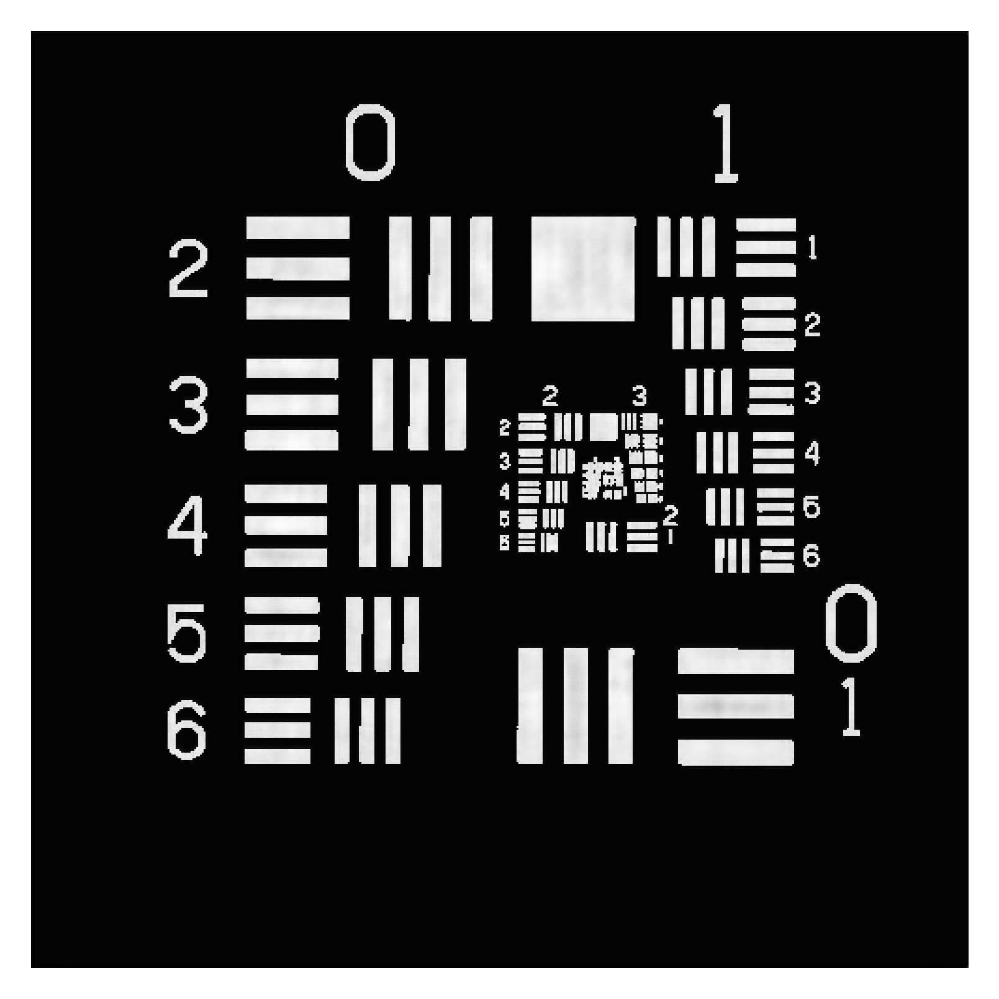

In [43]:

plt.figure(dpi=500)
plt.imshow(img_save,'gray')
plt.axis('off')
# plt.colorbar(

(-0.5, 499.5, 499.5, -0.5)

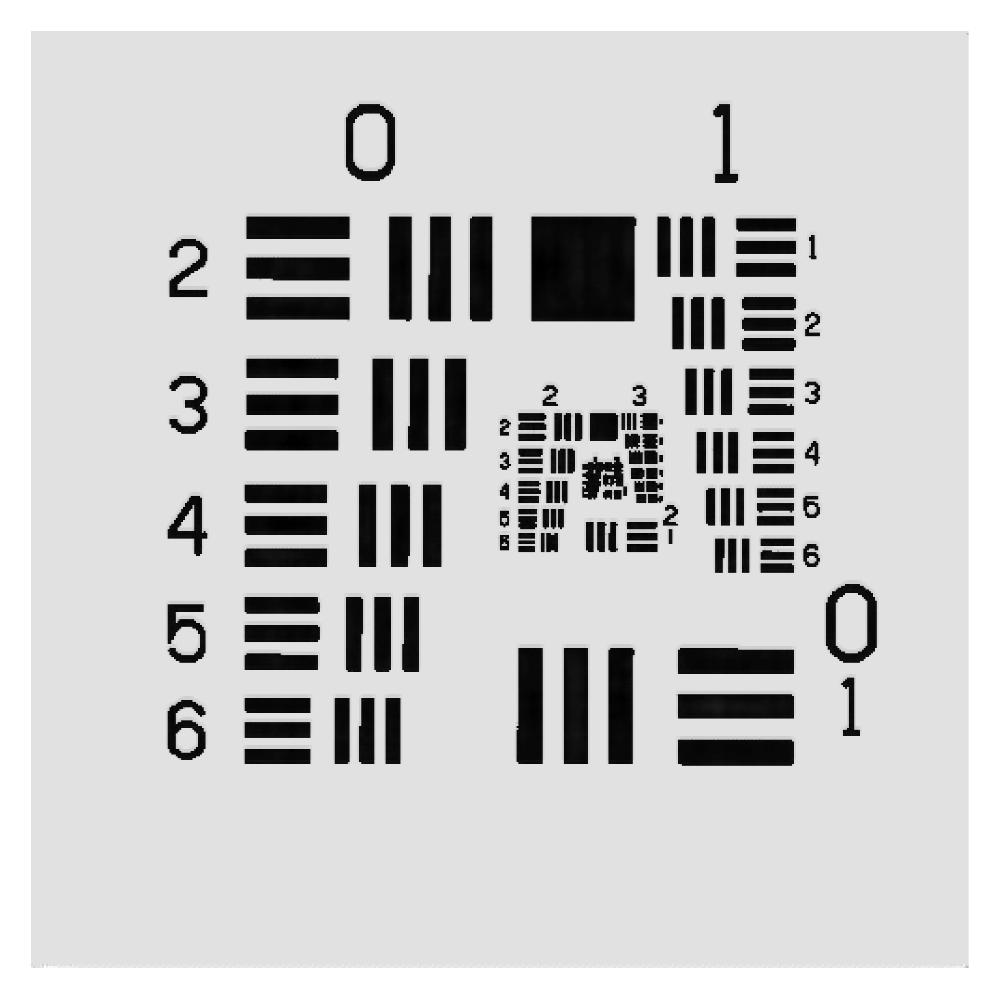

In [44]:
plt.figure(dpi=500)
plt.imshow(np.squeeze(Temp_phase[index]),'binary')
plt.axis('off')

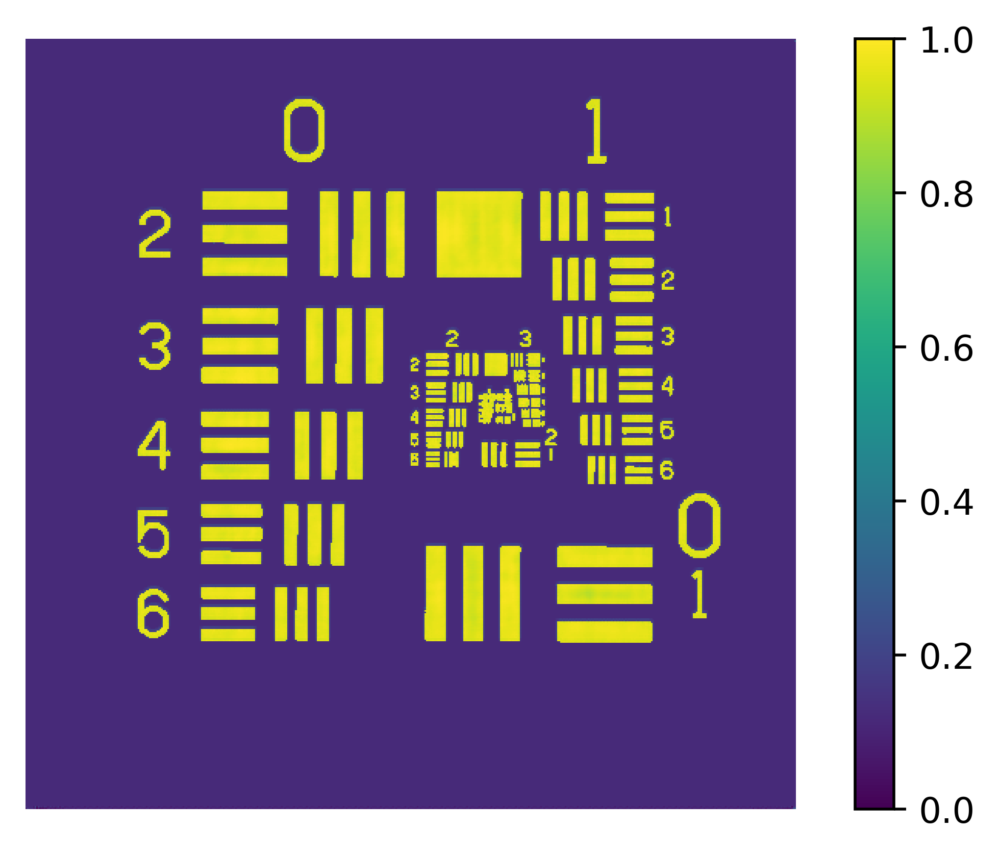

In [45]:
plt.figure(dpi=500)
plt.imshow(np.squeeze(Temp_phase[index]))
plt.axis('off')
plt.colorbar()

(-0.5, 499.5, 499.5, -0.5)

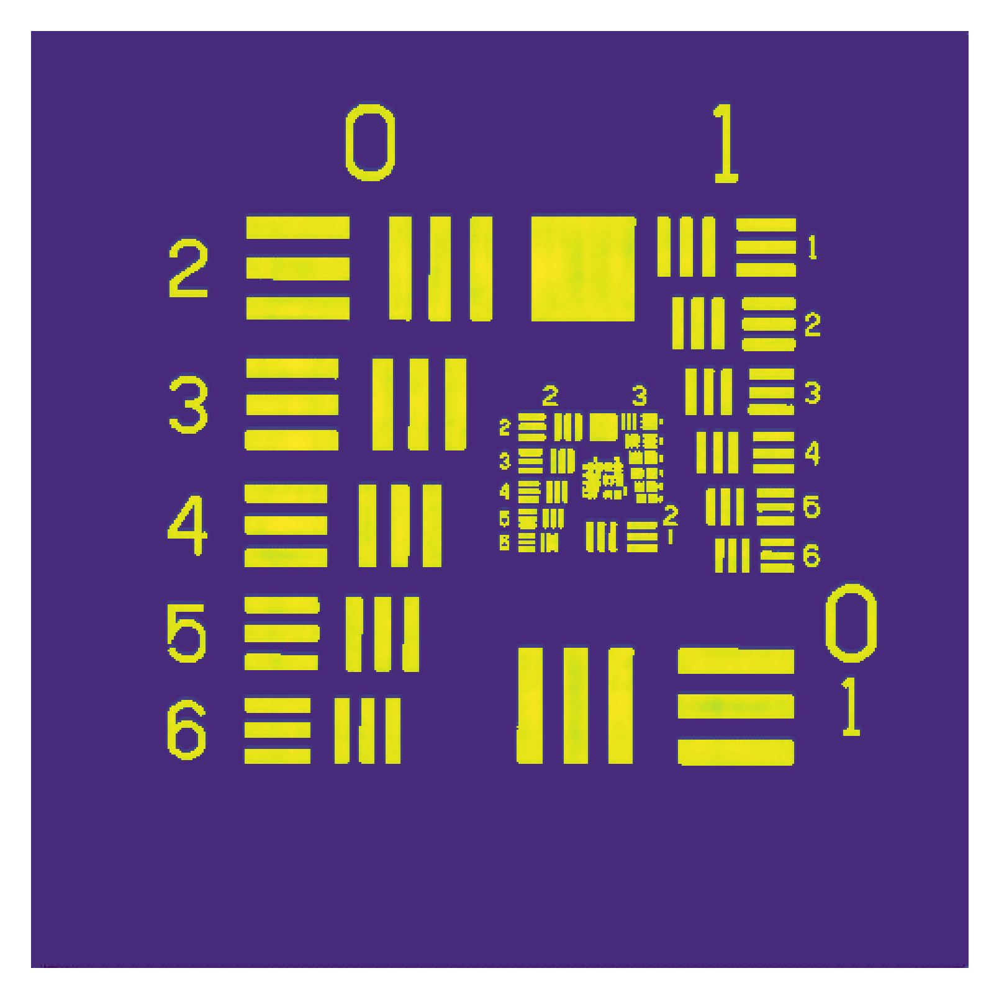

In [46]:
plt.figure(dpi=500)
plt.imshow(np.squeeze(Temp_phase[index]))
plt.axis('off')
# plt.colorbar()

(-24.950000000000003, 523.95, 0.07573007870243385, 1.0227027297864955)

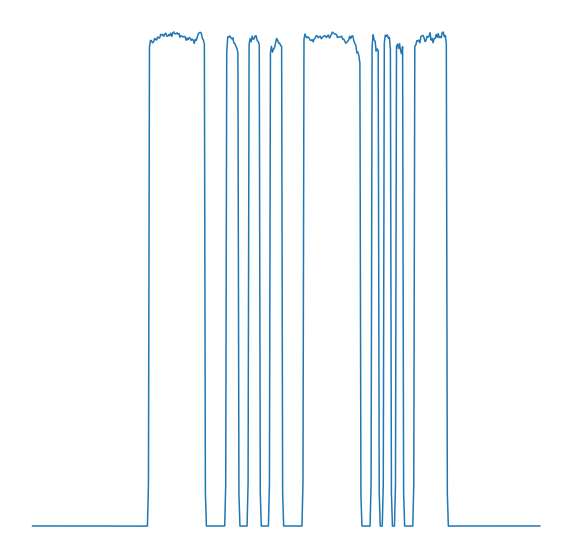

In [47]:
plt.figure(figsize=(10,10))
plt.plot((Temp_phase[index][100,:]))
plt.axis('off')